In [1]:
# Import packages

import pandas as pd
import math
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import pyart
import glob
import matplotlib.patheffects as path_effects
from matplotlib.colors import BoundaryNorm, LinearSegmentedColormap
from pyproj import Transformer
import radlib
import os
import h5py
import matplotlib.dates as mdates
from scipy.ndimage import gaussian_filter1d
from cartopy.feature import NaturalEarthFeature
import xmltodict, geopandas, geojson, xml, json #xml and json do not exist
from datetime import datetime, timedelta
import geopy.distance
from datetime import datetime, timedelta
import numpy.matlib as npm
import copy
from scipy.signal import convolve2d
from astropy.convolution import convolve
import scipy.ndimage as ndi
import re
from skimage.draw import polygon


from pprint import pprint
from pysteps import io, motion, rcparams
from pysteps.utils import conversion, transformation
from pysteps.visualization import plot_precip_field, quiver


os.environ["library_metranet_path"] = "/store_new/mch/msrad/idl/lib/radlib4/" # needed for pyradlib
os.environ["METRANETLIB_PATH"] = "/store_new/mch/msrad/idl/lib/radlib4/" # needed for pyart_mch




## You are using the Python ARM Radar Toolkit (Py-ART), an open source
## library for working with weather radar data. Py-ART is partly
## supported by the U.S. Department of Energy as part of the Atmospheric
## Radiation Measurement (ARM) Climate Research Facility, an Office of
## Science user facility.
##
## If you use this software to prepare a publication, please cite:
##
##     JJ Helmus and SM Collis, JORS 2016, doi: 10.5334/jors.119

Pysteps configuration file found at: /scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pysteps/pystepsrc



## Definitions

In [2]:
# Defining valid time and elevation scan

valid_time3 = '1535'
elevation_scan = '3'
radar_station = 'D'
radar_name = 'La Dole'


#valid_time2 = '15:25' # Used for temporary wind barbs

In [3]:
# Data Imports, processing, norming, etc.

# GPSConverter for coordinate transformation
class GPSConverter(object):
    '''
    GPS Converter class which is able to perform convertions between the 
    CH1903 and WGS84 system.
    '''
    # Convert CH y/x/h to WGS height
    def CHtoWGSheight(self, y, x, h):
        # Axiliary values (% Bern)
        y_aux = (y - 600000) / 1000000
        x_aux = (x - 200000) / 1000000
        h = (h + 49.55) - (12.60 * y_aux) - (22.64 * x_aux)
        return h

    # Convert CH y/x to WGS lat
    def CHtoWGSlat(self, y, x):
        # Axiliary values (% Bern)
        y_aux = (y - 600000) / 1000000
        x_aux = (x - 200000) / 1000000
        lat = (16.9023892 + (3.238272 * x_aux)) + \
                - (0.270978 * pow(y_aux, 2)) + \
                - (0.002528 * pow(x_aux, 2)) + \
                - (0.0447 * pow(y_aux, 2) * x_aux) + \
                - (0.0140 * pow(x_aux, 3))
        # Unit 10000" to 1" and convert seconds to degrees (dec)
        lat = (lat * 100) / 36
        return lat

    # Convert CH y/x to WGS long
    def CHtoWGSlng(self, y, x):
        # Axiliary values (% Bern)
        y_aux = (y - 600000) / 1000000
        x_aux = (x - 200000) / 1000000
        lng = (2.6779094 + (4.728982 * y_aux) + \
                + (0.791484 * y_aux * x_aux) + \
                + (0.1306 * y_aux * pow(x_aux, 2))) + \
                - (0.0436 * pow(y_aux, 3))
        # Unit 10000" to 1" and convert seconds to degrees (dec)
        lng = (lng * 100) / 36
        return lng

    # Convert decimal angle (° dec) to sexagesimal angle (dd.mmss,ss)
    def DecToSexAngle(self, dec):
        degree = int(math.floor(dec))
        minute = int(math.floor((dec - degree) * 60))
        second = (((dec - degree) * 60) - minute) * 60
        return degree + (float(minute) / 100) + (second / 10000)
		
    # Convert sexagesimal angle (dd.mmss,ss) to seconds
    def SexAngleToSeconds(self, dms):
        degree = 0 
        minute = 0 
        second = 0
        degree = math.floor(dms)
        minute = math.floor((dms - degree) * 100)
        second = (((dms - degree) * 100) - minute) * 100
        return second + (minute * 60) + (degree * 3600)

    # Convert sexagesimal angle (dd.mmss) to decimal angle (degrees)
    def SexToDecAngle(self, dms):
        degree = 0
        minute = 0
        second = 0
        degree = math.floor(dms)
        minute = math.floor((dms - degree) * 100)
        second = (((dms - degree) * 100) - minute) * 100
        return degree + (minute / 60) + (second / 3600)
    
    # Convert WGS lat/long (° dec) and height to CH h
    def WGStoCHh(self, lat, lng, h):
        lat = self.DecToSexAngle(lat)
        lng = self.DecToSexAngle(lng)
        lat = self.SexAngleToSeconds(lat)
        lng = self.SexAngleToSeconds(lng)
        # Axiliary values (% Bern)
        lat_aux = (lat - 169028.66) / 10000
        lng_aux = (lng - 26782.5) / 10000
        h = (h - 49.55) + (2.73 * lng_aux) + (6.94 * lat_aux)
        return h

    # Convert WGS lat/long (° dec) to CH x
    def WGStoCHx(self, lat, lng):
        lat = self.DecToSexAngle(lat)
        lng = self.DecToSexAngle(lng)
        lat = self.SexAngleToSeconds(lat)
        lng = self.SexAngleToSeconds(lng)
        # Axiliary values (% Bern)
        lat_aux = (lat - 169028.66) / 10000
        lng_aux = (lng - 26782.5) / 10000
        x = ((200147.07 + (308807.95 * lat_aux) + \
            + (3745.25 * pow(lng_aux, 2)) + \
            + (76.63 * pow(lat_aux,2))) + \
            - (194.56 * pow(lng_aux, 2) * lat_aux)) + \
            + (119.79 * pow(lat_aux, 3))
        return x

	# Convert WGS lat/long (° dec) to CH y
    def WGStoCHy(self, lat, lng):
        lat = self.DecToSexAngle(lat)
        lng = self.DecToSexAngle(lng)
        lat = self.SexAngleToSeconds(lat)
        lng = self.SexAngleToSeconds(lng)
        # Axiliary values (% Bern)
        lat_aux = (lat - 169028.66) / 10000
        lng_aux = (lng - 26782.5) / 10000
        y = (600072.37 + (211455.93 * lng_aux)) + \
            - (10938.51 * lng_aux * lat_aux) + \
            - (0.36 * lng_aux * pow(lat_aux, 2)) + \
            - (44.54 * pow(lng_aux, 3))
        return y

    def LV03toWGS84(self, east, north, height):
        '''
        Convert LV03 to WGS84 Return a array of double that contain lat, long,
        and height
        '''
        d = []
        d.append(self.CHtoWGSlat(east, north))
        d.append(self.CHtoWGSlng(east, north))
        d.append(self.CHtoWGSheight(east, north, height))
        return d
        
    def WGS84toLV03(self, latitude, longitude, ellHeight):
        '''
        Convert WGS84 to LV03 Return an array of double that contaign east,
        north, and height
        '''
        d = []
        d.append(self.WGStoCHy(latitude, longitude))
        d.append(self.WGStoCHx(latitude, longitude))
        d.append(self.WGStoCHh(latitude, longitude, ellHeight))
        return d
        
if __name__ == "__main__":
    ''' Example usage for the GPSConverter class.'''

    converter = GPSConverter()

    # Coordinates
    wgs84 = []
    lv03  = [567719, 155077, 1974]
    #567719/ 155077  Altitude: 1974
    # Convert WGS84 to LV03 coordinates
    wgs84 = converter.LV03toWGS84(lv03[0], lv03[1], lv03[2])

    print("WGS84: ")
    print(wgs84)
    print("LV03: ")
    print(lv03)

# Transform function for dealiased velocity
def transform_from_digital(mydata, nyquist):
    myfinaldata = (mydata * 1.0 - 128) * nyquist / 127
    myfinaldata[mydata == 0] = np.nan
    return myfinaldata

# Convert polar coordinates (range, azimuth) to geographic coordinates (lat/lon)
def radar_to_latlon(radar_lat, radar_lon, ranges, azimuths):
    R = 6371.0  # Earth radius in kilometers
    azimuths_rad = np.radians(azimuths)
    latitudes = np.zeros((len(azimuths), len(ranges)))
    longitudes = np.zeros((len(azimuths), len(ranges)))

    for i, az in enumerate(azimuths_rad):
        latitudes[i, :] = radar_lat + (ranges / R) * np.cos(az) * (180.0 / np.pi)
        longitudes[i, :] = radar_lon + (ranges / R) * np.sin(az) * (180.0 / np.pi) / np.cos(np.radians(radar_lat))

    return latitudes, longitudes

# Define TRT reading function
def read_TRT(path, file=0, ttime=0):
    """
    Read .trt or .json file containing TRT output
    Returns dataframe with attributes and gridded TRT cells

    Parameters
    ----------

    path : string
        path, where to look for files.
    file: string
        filename
    ttime : string
        timestep to find files for.
    Requires either filename or timestep
   
    Returns
    -------
    trt_df : dataframe
        TRT cells and attributes of the timestep.
    cells: list
        Gridded TRT cells per timestep
    timelist: list
        timesteps

    """
   
    o_x=255000
    o_y=-160000
    lx=710; ly=640
    cells=np.zeros([ly,lx])
    if file == 0:
        file=glob.glob(path["lomdata"]+'TRTC/*'+ttime+'*json*')
        if len(file)>0: flag=1
        else:
            file=glob.glob(path["lomdata"]+'TRTC/*'+ttime+'*'+'.trt')[0]
            flag=0
    else:
        if 'json' in file: flag=1; ttime=file[-20:-11]
        else: flag=0; ttime=file[-15:-6]
        file=[file]
   
    if flag==1:
        with open(file[0]) as f: gj = geojson.FeatureCollection(gs.load(f))
        trt_df=geopandas.GeoDataFrame.from_features(gj['features'])
        if len(trt_df)>0:
          # print(trt_df.lon.values.astype(float))
          chx, chy = c_transform(trt_df.lon.values.astype(float),trt_df.lat.values.astype(float))
          trt_df['chx']=chx.astype(str); trt_df['chy']=chy.astype(str)
          for n in range(len(trt_df)):
              lon,lat=trt_df.iloc[n].geometry.boundary.xy
              # print(trt_df.iloc[n])
              chx, chy = c_transform(lon,lat)
              # trt_df.iloc[n]['chx']=chx.astype(str); trt_df.iloc[n]['chy']=chy.astype(str)
              #transform.c_transform(trt_df.iloc[n].lon.values,trt_df.iloc[n].lat.values)
              ix=np.round((chx-o_x)/1000).astype(int)
              iy=np.round((chy-o_y)/1000).astype(int)
              rr, cc = polygon(iy, ix, cells.shape)
              # print(lat,lon,chx,chy,ix,iy)
              cells[rr,cc]=int(trt_df.traj_ID.iloc[n]);
        else: cells=[]
    else:
        data=pd.read_csv(file).iloc[8:]
        headers=pd.read_csv(file).iloc[7:8].iloc[0][0].split()
        trt_df=pd.DataFrame()
        for n in range(len(data)):
            t=data.iloc[n].str.split(';',expand=True)
            trt_df.loc[n,'traj_ID']=int(t[0].values)
            trt_df.loc[n,'time']=int(t[1].values)
            trt_df.loc[n,'lon']=t[2].values.astype(float)
            trt_df.loc[n,'lat']=t[3].values.astype(float)
            chx,chy=c_transform([trt_df.loc[n,'lon']],[trt_df.loc[n,'lat']])
            ix=np.round((chx-o_x)/1000).astype(int)
            if ix>=710: ix=709
            iy=np.round((chy-o_y)/1000).astype(int)
            if iy>=640: iy=639
            n2=27
            if int(ttime)>=221520631: n2=82
            tt=np.array(t)[0,n2:-1]
            tt=np.reshape(tt,[int(len(tt)/2),2])
            trt_df.loc[n,'chx']=chx
            trt_df.loc[n,'chy']=chy
            lat=tt[:,1].astype(float); lon=tt[:,0].astype(float)
            # trt_df=trt_df.astype(str)
            chx,chy=c_transform(lon,lat)
            ix=np.round((chx-o_x)/1000).astype(int)
            iy=np.round((chy-o_y)/1000).astype(int)
            rr, cc = polygon(iy, ix, cells.shape)
            cells[rr,cc]=int(t[0].values);
    # print(np.nanmax(cells))
    timelist=[str(ttime)]
    return trt_df, [cells], timelist

# Define VAD reading function
def read_VAD(file_VAD):
    mydoc = xml.dom.minidom.parse(file_VAD)

    levels = mydoc.getElementsByTagName('level')
   
    heights = mydoc.getElementsByTagName('height')
    speeds = mydoc.getElementsByTagName('speed')
    directions = mydoc.getElementsByTagName('direction')
   
    vad_levels=np.zeros(len(levels))
    vad_heights=np.zeros(len(levels))
    vad_speeds=np.zeros(len(levels))
    vad_directions=np.zeros(len(levels))
    for m in range(0,len(levels)):
        vad_levels[m]=levels[m].firstChild.data
        vad_heights[m]=heights[m].firstChild.data
        vad_speeds[m]=speeds[m].firstChild.data
        vad_directions[m]=directions[m].firstChild.data
    vad_s=np.zeros(150); vad_d=np.zeros(150); vad_s[:]=np.nan; vad_d[:]=np.nan;
    for n in range(0,150):
        for m in range(0,len(levels)):
            if vad_levels[m]==n:
                vad_s[n]=vad_speeds[m]
                vad_d[n]=vad_directions[m]
       
       
    vad_u = np.multiply(vad_s, np.cos(np.radians(vad_d)))
    vad_v = np.multiply(vad_s, np.sin(np.radians(vad_d)))
   
    vadu=np.zeros(15); vadv=np.zeros(15);
    for n in range(0,15):
        a=n*10
        vadu[n]=np.nanmean(vad_u[a:a+10])
        vadv[n]=np.nanmean(vad_v[a:a+10])
       
    return vadu, vad_u, vadv, vad_v

# Function to calculate azimuth angle from radar to downburst location
def calculate_azimuth(lat1, lon1, lat2, lon2):
    # Convert to radians
    lat1 = math.radians(lat1)
    lon1 = math.radians(lon1)
    lat2 = math.radians(lat2)
    lon2 = math.radians(lon2)
    
    # Calculate azimuth
    delta_lon = lon2 - lon1
    x = math.sin(delta_lon) * math.cos(lat2)
    y = math.cos(lat1) * math.sin(lat2) - math.sin(lat1) * math.cos(lat2) * math.cos(delta_lon)
    azimuth = math.atan2(x, y)
    azimuth_deg = math.degrees(azimuth)
    
    # Normalize to 0-360 degrees
    return (azimuth_deg + 360) % 360

# Convolves and normalizes 2D data with a 3x3 kernel
def conv(data):
    """
    Convolves and normalizes 2D data with a 3x3 kernel

    Parameters
    ----------
    data : 2-D array
        data to be convolved.

    Returns
    -------
    d_conv : 2-D array
        convolved data.

    """
    ## convolves 2D data with a 3x3 kernel, equal weights, wrapped boundary, NaN values ignored / filled in
    g_kernel=np.ones([3,3])/9
    d_conv=convolve(data,g_kernel, boundary='wrap')
    return d_conv

# azimuthal centered difference derivative for polar data -> wraps around 0/360
def az_cd(myfinaldata, nyquist, threshold, resolution, min_size):
    """
    azimuthal centered difference derivative for polar data -> wraps around 0/360

    Parameters
    ----------
    myfinaldata : 2D array
        input data.
    nyquist : float
        Nyquist velocity of raw velocity data.
    threshold : float
        shear correction threshold.
    resolution : float
        radial resolution of data.
    min_size : int
        minimum number of gates required for correction.

    Returns
    -------
    myshear_cor : 2D array
        azimuthal derivative, corrected for unfolding errors.
    mygateshear_cor : 2D array
        azimuthal difference (no normalization by distance), corrected for unfolding errors.

    """
    ## azimuthal derivative, centered difference
    ## corrects for anomalous shear exceeding threshold
    ## shear only corrected if contiguous area of several pixels
    myfinaldata_1=np.zeros(myfinaldata.shape)
    myfinaldata_1[:-1,:]=myfinaldata[1:,:]
    myfinaldata_1[-1,:]=myfinaldata[0,:]
    myfinaldata_2=np.zeros(myfinaldata.shape)
    myfinaldata_2[1:,:]=myfinaldata[:-1,:]
    myfinaldata_2[0,:]=myfinaldata[-1,:]
    
    distance=np.arange(0.5*resolution, myfinaldata.shape[1]*resolution 
                       + 0.5*resolution, resolution)
    distance=npm.repmat(distance,myfinaldata.shape[0],1)
    distance=np.divide(np.multiply(distance,2*np.pi),360)
    
    myshear_1=(myfinaldata-myfinaldata_1)/(2*distance)*-(1)
    myshear_2=(myfinaldata_2-myfinaldata)/(2*distance)*(-1)
    myshear_3=(myfinaldata_2-myfinaldata_1)/(2*distance)*(-1)
    
    myshear_1_cor=shear_cor(myshear_1, distance, threshold, nyquist, min_size)
        
    myshear_2_cor=shear_cor(myshear_2, distance, threshold, nyquist, min_size)

    myshear_3_cor=shear_cor(myshear_3, distance, threshold, nyquist, min_size)
    
    myshear_cor=np.nansum([myshear_2_cor,myshear_1_cor],axis=0)
    myshear_cor[np.isnan(myfinaldata)==1]=myshear_3_cor[np.isnan(myfinaldata)==1]
    mygateshear_cor=myshear_cor*distance
    
    return myshear_cor, mygateshear_cor

# Identifies unfolding errors in derivative and corrects for them
def shear_cor(myshear, distance, threshold, nyquist, min_size):
    """
    Identifies unfolding errors in derivative and corrects for them

    Parameters
    ----------
    myshear : 2D array
        input data.
    distance : 2D array
        azimuthal Cartesian distance between gates.
    threshold : float
        error identification threshold.
    nyquist : float
        correction interval (nyquist velocity).
    min_size : int
        minimum number of connected erroneous gates.

    Returns
    -------
    myshear_cor : 2D array
        corrected data.

    """
    ## function embedded in centered difference shear
    ## eliminates anomalous shear in contiguous area
    myshear_cor=(myshear*(2*distance))
    thresh_1=(myshear*(2*distance))-threshold
    thresh_2=(myshear*(2*distance))+threshold
    
    mybin_pos=np.zeros(myshear.shape)
    mybin_pos[thresh_1>=0]=1
    labels, n_groups=ndi.label(mybin_pos)
    for n in range(1, n_groups):
        size=len(np.where(labels==n)[0])
        if size<min_size: labels[labels==n]=0
        else: myshear_cor[labels==n] -= (2*nyquist)
    
    mybin_neg=np.zeros(myshear.shape)
    mybin_neg[thresh_2<=0]=1
    labels, n_groups=ndi.label(mybin_neg)
    for n in range(1, n_groups):
        size=len(np.where(labels==n)[0])
        if size<min_size: labels[labels==n]=0
        else: myshear_cor[labels==n] += (2*nyquist)
    myshear_cor=myshear_cor/(2*distance)
    return myshear_cor

# azimuthal linear least squares derivative        
def az_llsd(d_r, d_theta, u_k_r, u_k_thet, u_k, weights):
    """
    azimuthal linear least squares derivative

    Parameters
    ----------
    d_r : array of same dimensions as data
        radial distance.
    d_theta : array of same dimensions as data
        azimuthal distance.
    u_k_r : array of same dimensions as data
        data weighted radially.
    u_k_thet : array of same dimensions as data
        data weighted azimuthally.
    u_k : array of same dimensions as data
        data weighted uniformly.
    weights : array of same dimensions as data
        weights for convolution.

    Returns
    -------
    az_shear : array of same dimensions as data
        azimuthal derivative of data.

    """
    ##azimuthal linear least squares derivative
    az_shear=( np.sum(weights * d_r * d_theta) * np.sum(weights * d_r * d_theta) * np.sum(weights) \
                + np.sum(weights * d_theta * d_theta) * np.sum(weights * d_r) * np.sum(weights * d_r) \
                + np.sum(weights * d_theta) * np.sum(weights * d_r * d_r) * np.sum(weights * d_theta) \
                - 2 * np.sum(weights * d_r * d_theta) * np.sum(weights * d_r) * np.sum(weights * d_theta) \
                - np.sum(weights * d_theta * d_theta) * np.sum(weights * d_r * d_r) * np.sum(weights)) ** (-1) \
                * ( u_k_r * (np.sum(weights * d_r * d_theta) * np.sum(weights) - np.sum(weights * d_theta) * np.sum(weights * d_r)) \
                + u_k_thet * ( - np.sum(weights * d_r * d_r) * np.sum(weights) + np.sum(weights * d_r) * np.sum(weights * d_r)) \
                + u_k * (np.sum(weights * d_r * d_r) * np.sum(weights * d_theta) - np.sum(weights * d_r) * np.sum(weights * d_r * d_theta)) )
    return az_shear

# radial linear least squares derivative
def div_llsd(d_r, d_theta, u_k_r, u_k_thet, u_k, weights):
    """
    radial linear least squares derivative

    Parameters
    ----------
    d_r : array of same dimensions as data
        radial distance.
    d_theta : array of same dimensions as data
        azimuthal distance.
    u_k_r : array of same dimensions as data
        data weighted radially.
    u_k_thet : array of same dimensions as data
        data weighted azimuthally.
    u_k : array of same dimensions as data
        data weighted uniformly.
    weights : array of same dimensions as data
        weights for convolution.

    Returns
    -------
    div_shear : array of same dimensions as data
        radial derivative of data.

    """
    ##radial linear least squares derivative
    div_shear= ( np.sum(weights * d_r * d_theta) * np.sum(weights * d_r * d_theta) * np.sum(weights) \
                + np.sum(weights * d_theta * d_theta) * np.sum(weights * d_r) * np.sum(weights * d_r) \
                + np.sum(weights * d_theta) * np.sum(weights * d_r * d_r) * np.sum(weights * d_theta) \
                - 2 * np.sum(weights * d_r * d_theta) * np.sum(weights * d_r) * np.sum(weights * d_theta) \
                - np.sum(weights * d_theta * d_theta) * np.sum(weights * d_r * d_r) * np.sum(weights)) ** (-1) \
                * ( u_k_r * (- np.sum(weights * d_theta * d_theta) * np.sum(weights) + np.sum(weights * d_theta) * np.sum(weights * d_theta)) \
                + u_k_thet * (np.sum(weights * d_r * d_theta) * np.sum(weights) - np.sum(weights * d_theta) * np.sum(weights * d_r)) \
                + u_k * ( - np.sum(weights * d_r * d_theta) * np.sum(weights * d_theta) + np.sum(weights * d_r) * np.sum(weights * d_theta * d_theta)) )
    return div_shear

# full linear least squares derivative
def llsd(vel, az_min, az_max, w_k, r_k, resolution):
    """
    full linear least squares derivative

    Parameters
    ----------
    vel : 2D array
        input data, polar data.
    az_min : int
        min. number of gates in azimuth.
    az_max : int
        max. number of gates in azimuth.
    w_k : float
        kernel width in azimuth (Cartesian).
    r_k : float
        kernel width in radial (Cartesian).
    resolution : float
        radial resolution.

    Returns
    -------
    az_shear : 2D array
        azimuthal derivative.
    div_shear : 2D array
        radial derivative.

    """
    ##complete linear least squares derivative
    az_shear=np.zeros(vel.shape); az_shear[:]=np.nan
    div_shear=np.zeros(vel.shape); div_shear[:]=np.nan
    
    distance=np.arange(0.5*resolution, vel.shape[1]*resolution 
                       + 0.5*resolution, resolution)
    distance=npm.repmat(distance,vel.shape[0],1)
    distance=np.divide(np.multiply(distance,2*np.pi),360)

    r_h=int(np.floor(az_max/2))
	
    for n2 in range(r_h,vel.shape[1]-r_h):
        
        az_w=int(np.round(w_k/distance[1,n2]));
        if az_w%2 == 0: az_w+=1
        if az_w>az_max: az_w=az_max
        if az_w<az_min: az_w=az_min
        az_r=int(np.floor(az_w/2))
        
        r_w= r_k/resolution;
        if r_w%2 == 0: r_w+=1
        r_w=int(r_w)
        r_r=r_w*resolution
        r_vec=np.arange(-r_r,r_r+resolution,resolution)
        r_vec=np.expand_dims(r_vec,axis=0)
        d_r=np.repeat(r_vec,az_w,axis=0)
        
        d_r=np.zeros([az_w,r_w])
        for n2_2 in range(0,r_w):
            d_r[:,n2_2]=-r_k*n2_2/(r_w-1)+r_k*0.5
        rw_f=int(np.floor(r_w/2))
	    
        d_r2=-copy.deepcopy(d_r); #print(d_r.shape,n2)
        weights=np.ones([az_w,r_w])
        d_theta=copy.deepcopy(distance[:az_w,n2-rw_f:n2+rw_f+1]); d_theta[az_r,:]=0
        d_theta[:az_r,:]=-d_theta[:az_r,:];
        d_thet=copy.deepcopy(d_theta); d_thet=-np.flip(d_thet,1)

        u_k=convolve2d(vel[:,n2-rw_f:n2+rw_f+1],weights,mode='same',boundary='wrap')[:,1]
        u_k_thet=convolve2d(vel[:,n2-rw_f:n2+rw_f+1],d_thet,mode='same',boundary='wrap')[:,1]
        u_k_r=convolve2d(vel[:,n2-rw_f:n2+rw_f+1],d_r2,mode='same',boundary='wrap')[:,1]

        az_shear[:,n2]= az_llsd(d_r, d_theta, u_k_r, u_k_thet, u_k, weights)
        div_shear[:,n2]= div_llsd(d_r, d_theta, u_k_r, u_k_thet, u_k, weights)
    return az_shear, div_shear

# c_transform
def c_transform(lon,lat):
    """
    transforms arrays of lat/lon to chx/chy

    Parameters
    ----------
    lon : float
        longitude.
    lat : float
        latitude.

    Returns
    -------
    chx : float
        chx in m.
    chy : float
        chy in m.

    """
    converter = GPSConverter()
    chx=np.zeros([len(lon)])
    chy=np.zeros([len(lon)])
    for n in range(len(lon)):
        chx[n],chy[n],z=converter.WGS84toLV03(lat[n], lon[n], 0)
    return chx,chy

# transform_c 
def transform_c(chx,chy):
    """
    transforms arrays of chx/chy to lat/lon
    
    Parameters
    -------
    chx : float
        chx in m.
    chy : float
        chy in m.
        
    Returns
    ----------
    lon : float
        longitude.
    lat : float
        latitude.



    """
    converter = GPSConverter()
    lon=np.zeros([len(chx)])
    lat=np.zeros([len(chy)])
    for n in range(len(lon)):
        lat[n], lon[n],z=converter.LV03toWGS84(chx[n],chy[n], 0)
    return lon,lat



# Radar locations
if radar_station=='L':
    radar_lat = 46.0401
    radar_lon = 8.8334
    radar_alt = 1627 
if radar_station=='P':
    radar_lat = 46.37083
    radar_lon = 7.48694
    radar_alt = 2927
if radar_station=='W':
    radar_lat = 46.832
    radar_lon = 9.796
    radar_alt = 2892 
if radar_station=='A':
    radar_lat = 47.2841
    radar_lon = 8.5117
    radar_alt = 938 
if radar_station=='D':
    radar_lat = 46.425676
    radar_lon = 6.100092
    radar_alt = 1670

# Coordinates of cities
geneva_lat = 46.2044
geneva_lon = 6.1432
lausanne_lat = 46.5197
lausanne_lon = 6.6323

# Load radar data
path = '/scratch/mch/fackerma/orders/case_150619'
file = glob.glob(path + '/MLD/ML' + radar_station + '19166' + valid_time3 + '0U.00' + elevation_scan) # ML data 
file2 = glob.glob(path +'/DVD/srn/data/tmp/mof/DV' + radar_station + '/DV' + radar_station + '19166' + valid_time3 + '7L.80' + elevation_scan) # Dealiased velocity
file3 = glob.glob(path +'/HZC/HZC19166' + valid_time3 + 'VL.801') # Freezing level height composite
file4 = glob.glob(path +'/VAD/VA' + radar_station + '19166' + valid_time3 + '7U.019') # Vertical wind profile above radar
file5 = glob.glob(path +'/BZC/BZC19166' + valid_time3 + 'VL.845') # POH
file6 = glob.glob(path +'/MZC/MZC19166' + valid_time3 + 'VL.850') # MESH
file7 = glob.glob(path +'/TRTC/CZC19166' + valid_time3 + '0T.trt') # Thunderstorm radar tracking; or .rdt .trt
file8 = glob.glob(path +'/CZC/CZC19166' + valid_time3 + 'VL.801') # Reflectivity composite
file9 = glob.glob(path +'/LZC/LZC19166' + valid_time3 + 'VL.801') # VIL composite
file10 = glob.glob(path +'/EZC/EZC19166' + valid_time3 + 'VL.820') # Echotops composite: 815, 820, 845, 850
file11 = glob.glob(path +'/OZC/OZC19166' + valid_time3 + 'VL.830') # CAPPI composite, ranging from 810 to 980 in steps of 10
file12 = glob.glob(path + '/dARC/ARC191660000FF.1440') # daily bias corrected rain accumulation
file13 = glob.glob(path + '/dBZC/BZC191662400VL.845') # daily POH
file14 = glob.glob(path + '/dRZC/RZC191662400VL.801') # daily Rain Rate
file15 = glob.glob(path + '/dCZC/CZC191662400VL.801') # daily Max Echo




# Read the data for the plots
data = pyart.aux_io.read_metranet(file[0], reader='python')
velocity = data.get_field(0, 'velocity').data
reflectivity = data.get_field(0, 'reflectivity').data

dv_data = pyart.aux_io.read_file_py(file2[0], physic_value=False)
dv_digital = dv_data.data
dv_header = dv_data.header
nyq = float(dv_header['nyquist'])
dv_velocity = transform_from_digital(dv_digital, nyq)

hzc_data = radlib.read_file(file3[0],physic_value=True)
hzc=hzc_data.data

dARC_data = radlib.read_file(file12[0],physic_value=True)
dARC=dARC_data.data

dBZC_data = radlib.read_file(file13[0],physic_value=True)
dBZC=dBZC_data.data

dRZC_data = radlib.read_file(file14[0],physic_value=True)
dRZC=dRZC_data.data

dCZC_data = radlib.read_file(file15[0],physic_value=True)
dCZC=dCZC_data.data

diff_reflectivity = data.get_field(0, 'differential_reflectivity').data

diff_phase = data.get_field(0, 'uncorrected_differential_phase').data

cc_ratio = data.get_field(0, 'uncorrected_cross_correlation_ratio').data

mzc_data = radlib.read_file(file6[0],physic_value=True)
mzc=mzc_data.data

bzc_data = radlib.read_file(file5[0],physic_value=True)
bzc=bzc_data.data

specw = data.get_field(0, 'spectrum_width').data

czc_data = radlib.read_file(file8[0],physic_value=True)
czc=czc_data.data

lzc_data = radlib.read_file(file9[0],physic_value=True)
lzc=lzc_data.data

ezc_data = radlib.read_file(file10[0],physic_value=True)
ezc=ezc_data.data

ozc_data = radlib.read_file(file11[0],physic_value=True)
ozc=ozc_data.data


path_trtc = {"lomdata": "/scratch/mch/fackerma/orders/case_150619/"}  # Replace with your actual path
trt_df, cells_list, timelist = read_TRT(path_trtc, ttime=valid_time3)
# Extract the first element from the list of cells
cells = cells_list[0]
# Define Swiss CH1903 to WGS84 transformer
transformer_trtc = Transformer.from_crs("epsg:21781", "epsg:4326", always_xy=True)
# Grid dimensions and origin
o_x, o_y = 255000, -160000  # Origin in Swiss coordinates
lx, ly = 710, 640           # Grid size (width x height)
cell_size = 1000            # 1 km grid spacing
# Create Swiss grid (CH1903 coordinates)
x_coords = np.linspace(o_x, o_x + (lx - 1) * cell_size, lx)
y_coords = np.linspace(o_y, o_y + (ly - 1) * cell_size, ly)
x_grid, y_grid = np.meshgrid(x_coords, y_coords)
# Convert grid to WGS84 (longitude, latitude)
lon_trtc, lat_trtc = transformer_trtc.transform(x_grid, y_grid)

#vad = read_VAD(file4[0])


# Convert echotop18 from km to meters
ezc_m = ezc * 1000
# Compute the wind gust estimator 'wge' (Trefalt 2017)
wge = np.sqrt((-3.1 * 10**-6 * (ezc**2)) + (20.6 * lzc))



# Define resolution, azimuths, and ranges
resolution = 0.5
range_max = reflectivity.shape[1] * resolution
azimuths = np.linspace(0, 360, reflectivity.shape[0])
ranges = np.arange(0, range_max, resolution)

# Kdp own method
#smoothed_diff_phase = gaussian_filter1d(diff_phase, sigma=2, axis=1) 
#Kdp = np.gradient(smoothed_diff_phase, ranges, axis=1)

# KDP Vulpiani Method
Kdp = pyart.retrieve.kdp_vulpiani(data, psidp_field='uncorrected_differential_phase', band='C', parallel=True)
Kdp = Kdp[0]['data']


llsd_vel = llsd(vel=dv_velocity, az_min=3, az_max=90, w_k=5, r_k=5, resolution=0.5)


# Transform radar polar coordinates to lat/lon
lats, lons = radar_to_latlon(radar_lat, radar_lon, ranges, azimuths)

# Define the Swiss grid (values based on metadata)
chx = np.arange(255000, 255000 + 710 * 1000 + 1, 1000)
chy = sorted(np.arange(-160000, -160000 + 640 * 1000 + 1, 1000), reverse=True)
X, Y = np.meshgrid(chx, chy)
# Initialize transformer for Swiss grid to WGS84 (EPSG:21781 to EPSG:3857) 4326 PlateCarree
transformer = Transformer.from_crs(21781, 3035, always_xy=True)
# Convert Swiss grid coordinates to lat/lon
clons, clats = transformer.transform(X, Y)


cmap_czc = LinearSegmentedColormap.from_list("custom_cmap", ["white", "blue", "green", "yellow","red","magenta","black"], N=256)
czc_levels = np.arange(-10, 65, 5)  # Steps of 2 for Reflectivity
czc_norm = BoundaryNorm(boundaries=czc_levels, ncolors=256, clip=True)

# Define color steps for Reflectivity and Velocity/Dealiased Velocity
reflectivity_levels = np.arange(-5, 65, 5)  # Steps of 2 for Reflectivity
velocity_levels = np.arange(-25, 26, 5)  # Steps of 1 for Velocity and Dealiased Velocity
hzc_levels = np.arange(1, 10, 1)
diff_reflectivity_levels = np.arange(-1,3,0.5)
diff_phase_levels = np.arange(-70,90,20)
cc_ratio_levels = np.arange(0.7,1,0.05)
mzc_levels = np.arange(0,5.5,0.5)
bzc_levels = np.arange(0,101,10)
specw_levels = np.arange(0,7,1)
Kdp_levels = np.arange(0,5.5,0.5)
lzc_levels = np.arange(2.5,25,2.5)
ezc_levels = np.arange(2,16,2)
wge_levels = np.arange(2,20,2)
#az_shear_levels = np.arange(-10,12,2)
#div_shear_levels = np.arange(-10,12,2)
az_shear_levels = np.arange(-5,5.5,0.5)
div_shear_levels = np.arange(-5,5.5,0.5)

# Create boundary norms
reflectivity_norm = czc_norm
velocity_norm = BoundaryNorm(boundaries=velocity_levels, ncolors=256, clip=True)
hzc_norm = BoundaryNorm(boundaries=hzc_levels, ncolors=256, clip=True)
diff_reflectivity_norm = BoundaryNorm(boundaries=diff_reflectivity_levels, ncolors=256, clip=True)
diff_phase_norm = BoundaryNorm(boundaries=diff_phase_levels, ncolors=256, clip=True)
cc_ratio_norm = BoundaryNorm(boundaries=cc_ratio_levels, ncolors=256, clip=True)
mzc_norm = BoundaryNorm(boundaries=mzc_levels, ncolors=256, clip=True)
bzc_norm = BoundaryNorm(boundaries=bzc_levels, ncolors=256, clip=True)
specw_norm = BoundaryNorm(boundaries=specw_levels, ncolors=256, clip=True)
Kdp_norm = BoundaryNorm(boundaries=Kdp_levels, ncolors=256, clip=True)
lzc_norm = BoundaryNorm(boundaries=lzc_levels, ncolors=256, clip=True)
ezc_norm = BoundaryNorm(boundaries=ezc_levels, ncolors=256, clip=True)
wge_norm = BoundaryNorm(boundaries=wge_levels, ncolors=256, clip=True)
az_shear_norm = BoundaryNorm(boundaries=az_shear_levels, ncolors=256, clip=True)
div_shear_norm = BoundaryNorm(boundaries=div_shear_levels, ncolors=256, clip=True)


cmap_velocity = LinearSegmentedColormap.from_list("custom_cmap", ["blue", "white", "red"], N=256)
cmap_hzc = LinearSegmentedColormap.from_list("custom_cmap", ["white", "dodgerblue", "midnightblue"], N=256)
cmap_diff_reflectivity = LinearSegmentedColormap.from_list("custom_cmap", ["blue", "white","red"], N=256)
cmap_diff_phase = LinearSegmentedColormap.from_list("custom_cmap", ["blue", "white","red"], N=256)
cmap_cc_ratio = LinearSegmentedColormap.from_list("custom_cmap", ["darkblue", "lightblue","yellow","orange","red"], N=256)
cmap_Kdp = LinearSegmentedColormap.from_list("custom_cmap", ["darkblue", "lightblue","yellow","orange","red"], N=256)
cmap_bzc = LinearSegmentedColormap.from_list("custom_cmap", ["black","yellow", "red"], N=256)
cmap_specw = LinearSegmentedColormap.from_list("custom_cmap", ["darkblue", "lightblue","yellow","orange","red"], N=256)
cmap_lzc = LinearSegmentedColormap.from_list("custom_cmap", ["black", "cyan", "purple"], N=256)
cmap_ezc = plt.cm.Blues
cmap_wge = plt.cm.magma
cmap_vad = plt.cm.Accent
cmap_az_shear = LinearSegmentedColormap.from_list("custom_cmap", ["aqua","blue", "black", "red","yellow"], N=256)
cmap_div_shear = cmap_az_shear
cmap_vad = cmap_diff_reflectivity
cmap_reflectivity=cmap_czc



# Assess rhi files
files_rhi = sorted(glob.glob(path + '/MLD/MLD19166' + valid_time3 + '*')) # Read all elevations for rhi
for i,f in enumerate(files_rhi):
    radar = pyart.aux_io.read_metranet(f)
    
    if i == 0:
        radar_merged = radar
    else:
        radar_merged = pyart.util.join_radar(radar_merged, 
                                       radar)
#corr_vel = pyart.correct.dealias_region_based(radar_merged)
#radar_merged.add_field('corrected_velocity', corr_vel)


# Load the station data from the .txt file
station_data_path = '/users/fackerma/newproject1/case_150619_stations.csv'
stations_df = pd.read_csv(station_data_path)

# Convert time column to datetime for easier filtering
stations_df['time'] = pd.to_datetime(stations_df['time'], format='%Y%m%d%H%M')


# Data import, assimilation
file_path = '/scratch/mch/fackerma/orders/case_150619/stations/20190615.csv'

# Open the file and read its contents
with open(file_path, 'r') as file:
    station_data = file.readlines()  # Read all lines into a list

# Import stations readme
file_path = '/users/fackerma/newproject1/stations_readme.csv'

# Open and read the file as plain text
try:
    with open(file_path, 'r') as stations:
        stations = stations.readlines()  # Read all lines into a list
    #for line in content[:10]:  # Print the first 10 lines for inspection
        #print(line.strip())
except Exception as e:
    print(f"Error reading file: {e}")

# Parse the station metadata to create a dictionary mapping station ID to coordinates and altitude
station_info = {}

# Extract the relevant station data from 'stations' (first 158 rows)
for line in stations[0:0+158]:  # Starts from line 5, inclusive
    parts = line.strip().split("\t")
    station_id = parts[0].strip()  # First column: Station ID
    
    # Extract coordinates (last column)
    coordinates = parts[-1].strip()  
    x, y = map(int, coordinates.split("/"))  # Split the coordinates into x and y

    # Extract altitude (using regex to find the number before "m a.s.l.")
    altitude_match = re.search(r'(\d+)\s*m\s*a\.s\.l\.', parts[1])
    altitude = int(altitude_match.group(1)) if altitude_match else None  # Default to None if no altitude found
    
    station_info[station_id] = (x, y, altitude)

# Add Swiss coordinates and altitude to 'station_data'
updated_station_data = []

# Add headers for clarity
header = station_data[0].strip() + "   X_COORD   Y_COORD   ALTITUDE\n"
updated_station_data.append(header)

for line in station_data[1:]:  # Skip the header
    parts = line.strip().split()
    station_id = parts[0].strip()  # First column: Station ID
    
    # Lookup coordinates and altitude for the station
    x, y, altitude = station_info.get(station_id, (None, None, None))
    
    if x is not None and y is not None and altitude is not None:
        # Append the coordinates and altitude as new columns
        updated_line = line.strip() + f"   {x}   {y}   {altitude}\n"
    else:
        # In case no coordinates or altitude are found (unlikely here), keep it unchanged
        updated_line = line.strip() + "   N/A   N/A   N/A\n"
    
    updated_station_data.append(updated_line)

# Assuming converter.LV03toWGS84() function is defined, and it converts LV03 to WGS84
# Function to convert LV03 to WGS84 (assuming this is already defined)
# Example: converter.LV03toWGS84(x, y, altitude) returns [latitude, longitude, altitude]

# Iterate over each row in updated_station_data (skip the header)
for i, line in enumerate(updated_station_data[1:], start=1):
    parts = line.strip().split()
    
    # Extract the X_COORD, Y_COORD, and ALTITUDE for the current station
    x_coord = int(parts[-3])  # X_COORD is the second last column
    y_coord = int(parts[-2])  # Y_COORD is the last column before altitude
    altitude = int(parts[-1])  # ALTITUDE is the last column in the row
    
    # Convert LV03 (x_coord, y_coord, altitude) to WGS84 (latitude, longitude, altitude)
    wgs84 = converter.LV03toWGS84(x_coord, y_coord, altitude)
    
    # Append the WGS84 values as new columns: latitude, longitude, altitude
    updated_station_data[i] = line.strip() + f"   {wgs84[0]}   {wgs84[1]}   {wgs84[2]}"
    
# Add headers for latitude, longitude, and altitude to the header row
header = updated_station_data[0].strip() + "   LATITUDE   LONGITUDE   ALTITUDE_NEW"
updated_station_data[0] = header

# Data assimilation
# Extract the headers and rows
headers = updated_station_data[0].split()
data = [line.split() for line in updated_station_data[1:]]

# Create a DataFrame
df = pd.DataFrame(data, columns=headers)

# Convert relevant columns to numeric (e.g., the wind gust column '101')
df['101'] = pd.to_numeric(df['101'], errors='coerce')
df['197'] = pd.to_numeric(df['197'], errors='coerce')
df['UTC'] = (df['JAHR'].astype(str) +
                      df['MO'].astype(str).str.zfill(2) +
                      df['TG'].astype(str).str.zfill(2) +
                      df['HH'].astype(str).str.zfill(2) +
                      df['MM'].astype(str).str.zfill(2))

# Filter the data for the timestamp closest to 14:30 UTC (1430)
target_time = '20190615' + valid_time3
filtered_df = df[df['UTC'] == target_time]
# Filter out rows where the '101' value is greater than 200
filtered_df = filtered_df[filtered_df['101'] <= 200]

# Extract necessary columns (station ID, wind speed, wind direction)
wind_speeds = filtered_df['101'].values
wind_directions = filtered_df['197'].values
station_ids = filtered_df['STA'].values

filtered_df['LONGITUDE'] = pd.to_numeric(filtered_df['LONGITUDE'], errors='coerce')
filtered_df['LATITUDE'] = pd.to_numeric(filtered_df['LATITUDE'], errors='coerce')
filtered_df['101'] = pd.to_numeric(filtered_df['101'], errors='coerce')
filtered_df['197'] = pd.to_numeric(filtered_df['197'], errors='coerce')

# Drop rows with invalid data
filtered_df = filtered_df.dropna(subset=['LONGITUDE', 'LATITUDE', '101', '197'])




# Extents for plotting
extent_switzerland = [5.77, 10.8, 45.5, 48]
max_extent = [4, 12, 44, 49]
LakeGeneva_extent = [5.2, 7.9, 45.5, 47.3]
LakeGenevaLarge_extent = [4.2, 8.9, 45.5, 47.3]


WGS84: 
[46.54620053012867, 7.017760746224894, 2024.97379732]
LV03: 
[567719, 155077, 1974]


/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pyart/aux_io/metranet_reader.py:925: UserWarning: Moment SNR not in file
  warn('Moment ' + momnames[i] + ' not in file')


py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
swap product table data ......
py_decoder DBG verb=0
py_decoder DBG verbl=0


/tmp/ipykernel_50046/3471013963.py:236: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers=pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_50046/3471013963.py:240: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n,'traj_ID']=int(t[0].values)
/tmp/ipykernel_50046/3471013963.py:241: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n,'time']=int(t[1].values)
/tmp/ipykernel_50046/3471013963.py:261: DeprecationWarning: Conver

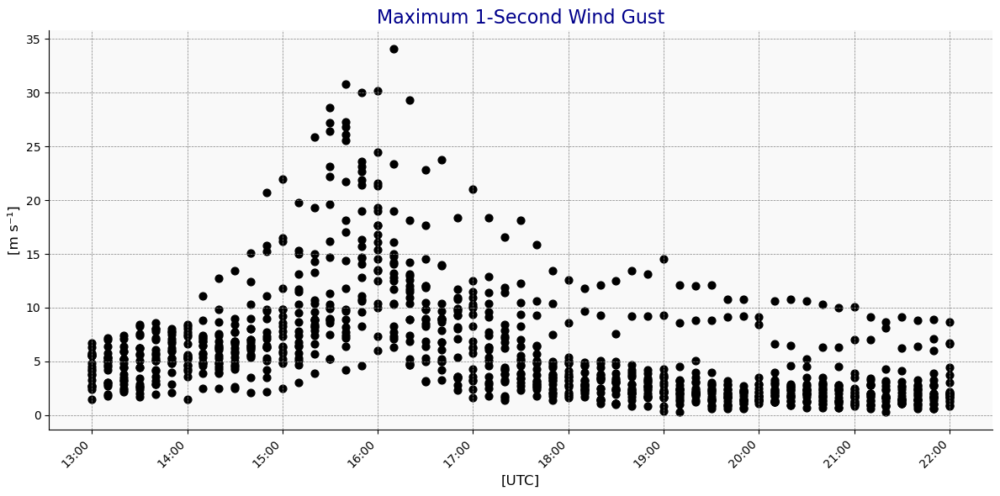

In [4]:
# In situ wind speeds plot

# Filter data between 13:00 and 22:00
start_time = pd.Timestamp('2019-06-15 13:00:00')
end_time = pd.Timestamp('2019-06-15 22:00:00')
filtered_df = stations_df[(stations_df['time'] >= start_time) & (stations_df['time'] <= end_time)]

# Sort the DataFrame by 'fkl010z1' in descending order
sorted_df = stations_df.sort_values(by='fkl010z1', ascending=False)
# Save the sorted DataFrame to a new CSV file
sorted_df.to_csv('sorted_by_fkl010z1.csv', index=False)

# Wind gusts defined as severe weather by US (Markowski & Richardson):
#stn,time,fkl010z0,fkl010z1,dkl010z0,dkl010z1,fkl010z3
#38,2019-06-15 16:10:00,17.9,34.1,247,10000000,32.4
#268,2019-06-15 15:40:00,18.9,30.8,239,10000000,29.4
#38,2019-06-15 16:00:00,19.8,30.2,247,10000000,29.5
#38,2019-06-15 15:50:00,17.1,30.0,272,10000000,29.4
#38,2019-06-15 16:20:00,16.0,29.3,249,10000000,28.7
#205,2019-06-15 15:30:00,12.1,28.6,263,10000000,28.3
#850,2019-06-15 15:40:00,12.0,27.3,256,10000000,25.3
#31,2019-06-15 15:30:00,21.1,27.2,270,10000000,26.4
#205,2019-06-15 15:40:00,12.7,26.8,270,10000000,25.4
#268,2019-06-15 15:30:00,10.8,26.4,282,10000000,25.7
#37,2019-06-15 15:40:00,11.1,26.1,269,10000000,25.1
#31,2019-06-15 15:20:00,16.8,25.9,281,10000000,25.0
#31,2019-06-15 15:40:00,18.7,25.6,273,10000000,24.5

# Plot the 3-second maximum wind gust
plt.figure(figsize=(12, 6))
for stn in filtered_df['stn'].unique():
    station_data = filtered_df[filtered_df['stn'] == stn]
    plt.scatter(station_data['time'], station_data['fkl010z1'], color='black', s=40)

# Beautify the plot
plt.title('Maximum 1-Second Wind Gust', fontsize=16, color='darkblue')
plt.xlabel('[UTC]', fontsize=12)
plt.ylabel('[m s⁻¹]', fontsize=12)

# Format x-axis to show time clearly
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
plt.gca().xaxis.set_major_locator(mdates.HourLocator(interval=1))
plt.xticks(rotation=45, ha='right')

# Customize the grid and background
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')
plt.gca().set_facecolor('#f9f9f9')
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# Tight layout for better spacing
plt.tight_layout()

# Save or show the plot
#plt.savefig('/users/fackerma/newproject1/figures/first_case/case_150619_max1swindgust.png', dpi=300)
plt.show()


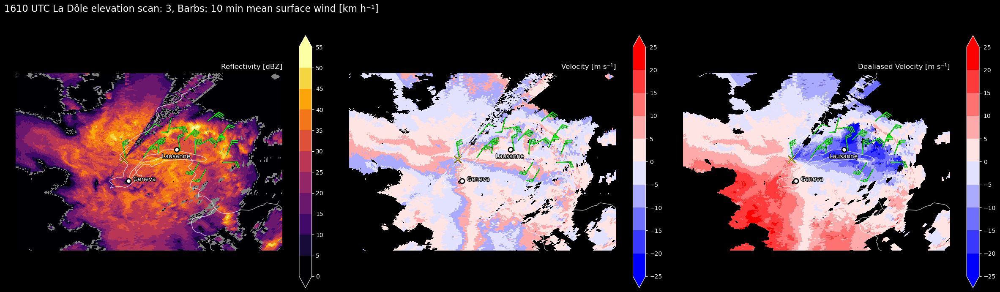

In [ ]:
# La Dole Reflectivity and Raw Velocity, Dealiased Velocity

# Create figure with three subplots (Reflectivity, Velocity, and Dealiased Velocity)
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(24, 7), subplot_kw={'projection': ccrs.PlateCarree()})

# Set background to black for all subplots
for ax in axs:
    fig.patch.set_facecolor('black')
    ax.set_facecolor('black')


# Plot Reflectivity
cmap_reflectivity = plt.cm.inferno
cmap_reflectivity.set_bad(color='grey')
p1 = axs[0].pcolormesh(lons, lats, reflectivity, cmap=cmap_reflectivity, norm=reflectivity_norm, transform=ccrs.PlateCarree())
axs[0].set_extent([5, 7.7, 45.5, 47.3], crs=ccrs.PlateCarree())
axs[0].add_feature(cfeature.BORDERS, edgecolor='white', linestyle='-', alpha=0.7)
axs[0].add_feature(cfeature.COASTLINE, edgecolor='white', alpha=0.7)
axs[0].add_feature(cfeature.LAKES, edgecolor='white', facecolor='none', alpha=0.7)
cbar1 = plt.colorbar(p1, ax=axs[0], cmap=cmap_reflectivity, extend='both', boundaries=reflectivity_levels, ticks=reflectivity_levels)
cbar1.outline.set_edgecolor('white')
cbar1.ax.yaxis.set_tick_params(color='white')
plt.setp(plt.getp(cbar1.ax.axes, 'yticklabels'), color='white')
axs[0].set_title('Reflectivity [dBZ]', color='white', loc='right')

# Plot Velocity
cmap_velocity = LinearSegmentedColormap.from_list("custom_cmap", ["blue", "white", "red"], N=256)
cmap_velocity.set_bad(color='black')
p2 = axs[1].pcolormesh(lons, lats, velocity, cmap=cmap_velocity, norm=velocity_norm, transform=ccrs.PlateCarree())
axs[1].set_extent([5, 7.7, 45.5, 47.3], crs=ccrs.PlateCarree())
axs[1].add_feature(cfeature.BORDERS, edgecolor='white', linestyle='-', alpha=0.7)
axs[1].add_feature(cfeature.COASTLINE, edgecolor='white', alpha=0.7)
axs[1].add_feature(cfeature.LAKES, edgecolor='white', facecolor='none', alpha=0.7)
cbar2 = plt.colorbar(p2, ax=axs[1], cmap=cmap_velocity, extend='both', boundaries=velocity_levels, ticks=velocity_levels)
cbar2.outline.set_edgecolor('white')
cbar2.ax.yaxis.set_tick_params(color='white')
plt.setp(plt.getp(cbar2.ax.axes, 'yticklabels'), color='white')
axs[1].set_title('Velocity [m s⁻¹]', color='white', loc='right')

# Plot Dealiased Velocity
p3 = axs[2].pcolormesh(lons, lats, dv_velocity, cmap=cmap_velocity, norm=velocity_norm, transform=ccrs.PlateCarree())
axs[2].set_extent([5, 7.7, 45.5, 47.3], crs=ccrs.PlateCarree())
axs[2].add_feature(cfeature.BORDERS, edgecolor='white', linestyle='-', alpha=0.7)
axs[2].add_feature(cfeature.COASTLINE, edgecolor='white', alpha=0.7)
axs[2].add_feature(cfeature.LAKES, edgecolor='white', facecolor='none', alpha=0.7)
cbar3 = plt.colorbar(p3, ax=axs[2], cmap=cmap_velocity, extend='both', boundaries=velocity_levels, ticks=velocity_levels)
cbar3.outline.set_edgecolor('white')
cbar3.ax.yaxis.set_tick_params(color='white')
plt.setp(plt.getp(cbar3.ax.axes, 'yticklabels'), color='white')
axs[2].set_title('Dealiased Velocity [m s⁻¹]', color='white', loc='right')

# (Plotting of wind barbs and other features remains the same)
# Add Radar, Geneva, and Lausanne locations to all plots
for ax in axs:
    #ax.plot(radar_lon, radar_lat, marker='x', color='yellow', markersize=12, transform=ccrs.PlateCarree())  # Radar location
    ax.plot(radar_lon, radar_lat, marker='x', color='yellow', markersize=12, transform=ccrs.PlateCarree(),
        path_effects=[path_effects.withStroke(linewidth=2, foreground='black')])
    ax.plot(geneva_lon, geneva_lat, marker='o', color='white', markersize=8, markeredgecolor='black', markeredgewidth=2, transform=ccrs.PlateCarree())  # Geneva
    ax.plot(lausanne_lon, lausanne_lat, marker='o', color='white', markersize=8, markeredgecolor='black', markeredgewidth=2, transform=ccrs.PlateCarree())  # Lausanne

    # Add city names with a black outline for visibility
    geneva_text = ax.text(geneva_lon + 0.05, geneva_lat, 'Geneva', color='white', fontsize=10, transform=ccrs.PlateCarree())
    lausanne_text = ax.text(lausanne_lon - 0.15, lausanne_lat - 0.085, 'Lausanne', color='white', fontsize=10, transform=ccrs.PlateCarree())
    geneva_text.set_path_effects([path_effects.Stroke(linewidth=2, foreground='black'), path_effects.Normal()])
    lausanne_text.set_path_effects([path_effects.Stroke(linewidth=2, foreground='black'), path_effects.Normal()])


# Load the station data from the .txt file
station_data_path = '/users/fackerma/newproject1/case_150619_stations.csv'
stations_df = pd.read_csv(station_data_path)

# Convert time column to datetime for easier filtering
stations_df['time'] = pd.to_datetime(stations_df['time'], format='%Y%m%d%H%M')

# Filter the data for the timestamp closest to 14:30 UTC (1430)
target_time = pd.Timestamp('2019-06-15 ' + valid_time2 + ':00')
filtered_df = stations_df[stations_df['time'] == target_time]

# Extract necessary columns (station ID, wind speed, wind direction)
wind_speeds = filtered_df['fkl010z0'].values
wind_directions = filtered_df['dkl010z0'].values
station_ids = filtered_df['stn'].values


# Extract lat/lon for the stations in the filtered data
# Swiss KM-coordinates for all stations
swiss_coords = {
    13: (577041, 147655),   # Château-d'Oex
    38: (567719, 155077),   # Le Moléson
    748: (571758, 167317),  # Marsens
    850: (555506, 158053),  # Oron
    32: (562131, 184611),   # Payerne
    309: (513821, 169387),  # Les Charbonnières
    308: (533458, 176567),  # Mathod
    762: (544198, 163651),  # Villars-Tiercelin
    77: (534225, 188081),   # Bullet / La Frétaz
    521: (573818, 137852),  # Col des Mosses
    37: (560405, 130713),   # Aigle
    268: (555264, 138175),  # Bouveret
    205: (552106, 146847),  # Vevey / Corseaux
    61: (540819, 151510),   # Pully
    331: (523549, 148525),  # St-Prex
    849: (515888, 153210),  # Bière
    31: (497998, 145539),   # Nyon / Changins
    517: (512005, 144552)   # Genf-Cointrin
}


# Transformation for Swiss KM to WGS84 lat/lon
transformer = Transformer.from_crs(21781, 4326, always_xy=True)

# Function to convert Swiss KM-coordinates to lat/lon
def convert_swiss_to_latlon(swiss_easting, swiss_northing):
    lon, lat = transformer.transform(swiss_easting, swiss_northing)
    return lat, lon


# List to store the lat/lon for stations
station_lats = []
station_lons = []

# Loop through the station coordinates to convert and store lat/lon
for stn_id, (swiss_x, swiss_y) in swiss_coords.items():
    lat, lon = convert_swiss_to_latlon(swiss_x, swiss_y)
    station_lats.append(lat)
    station_lons.append(lon)

# Convert lists to numpy arrays for easier indexing later
station_lats = np.array(station_lats)
station_lons = np.array(station_lons)

# Convert wind speeds from m/s to km/h
wind_speeds_kmh = wind_speeds * 3.6  # Multiply by 3.6 to convert to km/h

# Plot wind barbs on each subplot
for ax in axs:
    # Loop through each station and plot the barbs
    for i in range(len(station_ids)):
        # Ensure we do not go out of bounds
        if i >= len(station_lats) or i >= len(station_lons):
            continue  # Skip if the index is out of bounds

        u_component = wind_speeds_kmh[i] * np.cos(np.radians(wind_directions[i]))  # U-component
        v_component = wind_speeds_kmh[i] * np.sin(np.radians(wind_directions[i]))  # V-component
        
        if wind_speeds_kmh[i] > 0:  # Only plot barbs for positive wind speeds
            # Plot black barbs first (for the outline)
            ax.barbs(station_lons[i], station_lats[i],
                     u_component, v_component,
                     length=7,  # Length of the barbs
                     linewidth=1.5,  # Thickness of the outline
                     color='black',  # Black color for outline
                     transform=ccrs.PlateCarree())

            # Plot cyan barbs on top
            ax.barbs(station_lons[i], station_lats[i],
                     u_component, v_component,
                     length=7,  # Length of the barbs
                     linewidth=1.0,  # Normal thickness for color
                     color='lime',  # Desired color for barbs
                     transform=ccrs.PlateCarree())
        else:
            print(f"Warning: Zero wind speed for station ID {station_ids[i]}. Skipping barb plotting.")



# Set main title
plt.suptitle(valid_time3 + ' UTC La Dôle elevation scan: ' + elevation_scan + ', Barbs: 10 min mean surface wind [km h⁻¹]', color='white', fontsize=16, x=0.18)


# Adjust layout and display the plot
plt.tight_layout(rect=[0, 0, 1, 0.95])

# Save the figure
#plt.savefig("/users/fackerma/newproject1/figures/first_case/1430_ref_vel_dvel_10minwind.png", facecolor='black', dpi=300)

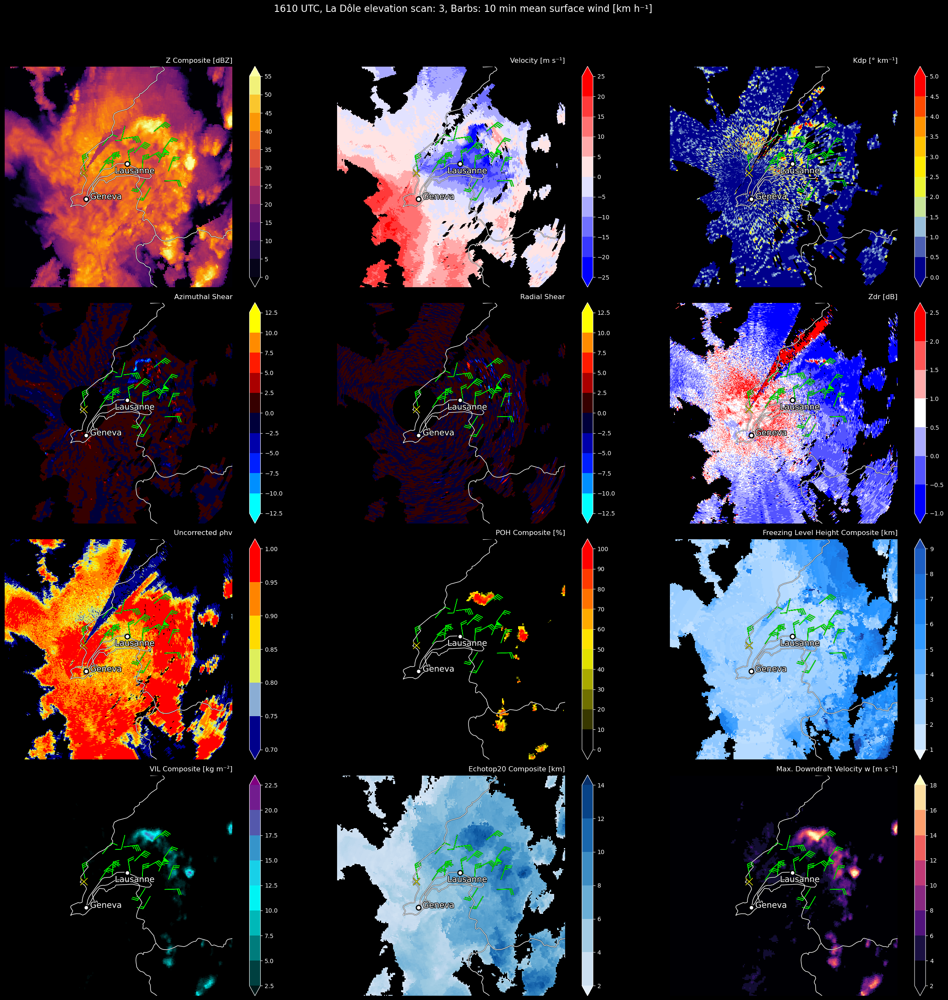

In [17]:
# Multi-variable plot
projection = ccrs.epsg(3035)
# Create figure with three subplots (Reflectivity, Velocity, and Dealiased Velocity)
fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(24, 24), subplot_kw={'projection': projection})

# Set background to black for all subplots
for row in axs:  # axs is a 2D array, so iterate through rows
    for ax in row:  # Iterate through each subplot in the row
        fig.patch.set_facecolor('black')  # Set figure background
        ax.set_facecolor('black')  # Set axis background


# Plot Reflectivity composite
cmap_czc.set_bad(color='grey')
p1 = axs[0,0].pcolormesh(clons, clats, czc, vmin=0, vmax=55, 
                   cmap=cmap_czc, transform=projection)
# Add a colorbar
cbar1 = plt.colorbar(p1, ax=axs[0,0], extend='both', cmap=cmap_czc, norm=czc_norm, boundaries=czc_levels, ticks=czc_levels
                     )
cbar1.outline.set_edgecolor('white')
cbar1.ax.yaxis.set_tick_params(color='white')
plt.setp(plt.getp(cbar1.ax.axes, 'yticklabels'), color='white')
axs[0,0].set_title('Z Composite [dBZ]', color='white', loc='right')


# Plot Dealiased Velocity
cmap_velocity.set_bad(color='black')
p2 = axs[0,1].pcolormesh(lons, lats, dv_velocity, cmap=cmap_velocity, norm=velocity_norm, transform=ccrs.PlateCarree())
cbar2 = plt.colorbar(p2, ax=axs[0,1], cmap=cmap_velocity, extend='both', boundaries=velocity_levels, ticks=velocity_levels)
cbar2.outline.set_edgecolor('white')
cbar2.ax.yaxis.set_tick_params(color='white')
plt.setp(plt.getp(cbar2.ax.axes, 'yticklabels'), color='white')
axs[0,1].set_title('Velocity [m s⁻¹]', color='white', loc='right')


# Plot Radial shear
#cmap_specw.set_bad(color='black')
p9 = axs[1,1].pcolormesh(lons, lats, llsd_vel[1], cmap=cmap_div_shear, norm=div_shear_norm, 
                         transform=ccrs.PlateCarree())
cbar9 = plt.colorbar(p9, ax=axs[1,1], cmap=cmap_div_shear, extend='both', boundaries=div_shear_levels, ticks=div_shear_levels
                     )
cbar9.outline.set_edgecolor('white')
cbar9.ax.yaxis.set_tick_params(color='white')
plt.setp(plt.getp(cbar9.ax.axes, 'yticklabels'), color='white')
axs[1,1].set_title('Radial Shear', color='white', loc='right')

# Plot Azmiutal shear
#cmap_specw.set_bad(color='black')
p9 = axs[1,0].pcolormesh(lons, lats, llsd_vel[0], cmap=cmap_az_shear, norm=az_shear_norm, 
                         transform=ccrs.PlateCarree())
cbar9 = plt.colorbar(p9, ax=axs[1,0], cmap=cmap_az_shear, extend='both', boundaries=az_shear_levels, ticks=az_shear_levels
                     )
cbar9.outline.set_edgecolor('white')
cbar9.ax.yaxis.set_tick_params(color='white')
plt.setp(plt.getp(cbar9.ax.axes, 'yticklabels'), color='white')
axs[1,0].set_title('Azimuthal Shear', color='white', loc='right')


# Plot Freezing level height
# Mask values of freezing level height that are 0 or lower
hzc_masked = np.ma.masked_less_equal(hzc, 0)
# Define a custom colormap, setting the under value (for masked/low values) to black
#cmap_hzc.set_under('black')  # Black for values 0 or lower
cmap_hzc.set_bad(color='black')  # Black for invalid data
# Plot the freezing level height with the masked values
p3 = axs[2,2].pcolormesh(clons, clats, hzc_masked, vmin=0, vmax=12, 
                         cmap=cmap_hzc, transform=projection)
# Add a colorbar
cbar3 = plt.colorbar(p3, ax=axs[2,2], extend='both', cmap=cmap_hzc, boundaries=hzc_levels, ticks=hzc_levels)
cbar3.outline.set_edgecolor('white')
cbar3.ax.yaxis.set_tick_params(color='white')
plt.setp(plt.getp(cbar3.ax.axes, 'yticklabels'), color='white')
axs[2,2].set_title('Freezing Level Height Composite [km]', color='white', loc='right')


# Plot Differential Reflectivity
cmap_diff_reflectivity.set_bad(color='black')
p4 = axs[1,2].pcolormesh(lons, lats, diff_reflectivity, cmap=cmap_diff_reflectivity, norm=diff_reflectivity_norm, 
                         transform=ccrs.PlateCarree())
cbar4 = plt.colorbar(p4, ax=axs[1,2], cmap=cmap_diff_reflectivity, extend='both', boundaries=diff_reflectivity_levels, ticks=diff_reflectivity_levels
                     )
cbar4.outline.set_edgecolor('white')
cbar4.ax.yaxis.set_tick_params(color='white')
plt.setp(plt.getp(cbar4.ax.axes, 'yticklabels'), color='white')
axs[1,2].set_title('Zdr [dB]', color='white', loc='right')


# Plot Differential Phase
#cmap_diff_phase.set_bad(color='black')
#p5 = axs[1,1].pcolormesh(lons, lats, diff_phase, cmap=cmap_diff_phase, norm=diff_phase_norm, 
                         #transform=ccrs.PlateCarree())
#cbar5 = plt.colorbar(p5, ax=axs[1,1], cmap=cmap_diff_phase, extend='both', boundaries=diff_phase_levels, ticks=diff_phase_levels
                     #)
#cbar5.outline.set_edgecolor('white')
#cbar5.ax.yaxis.set_tick_params(color='white')
#plt.setp(plt.getp(cbar5.ax.axes, 'yticklabels'), color='white')
#axs[1,1].set_title('Uncorrected ΦDP [°]', color='white', loc='right')


# Plot CC ratio
cmap_cc_ratio.set_bad(color='black')
p6 = axs[2,0].pcolormesh(lons, lats, cc_ratio, cmap=cmap_cc_ratio, norm=cc_ratio_norm, 
                         transform=ccrs.PlateCarree())
cbar6 = plt.colorbar(p6, ax=axs[2,0], cmap=cmap_cc_ratio, extend='both', boundaries=cc_ratio_levels, ticks=cc_ratio_levels
                     )
cbar6.outline.set_edgecolor('white')
cbar6.ax.yaxis.set_tick_params(color='white')
plt.setp(plt.getp(cbar6.ax.axes, 'yticklabels'), color='white')
axs[2,0].set_title('Uncorrected ρhv', color='white', loc='right')


# Plot Kdp
cmap_Kdp.set_bad(color='black')
p7 = axs[0,2].pcolormesh(lons, lats, Kdp, norm=Kdp_norm,
                   cmap=cmap_Kdp, transform=ccrs.PlateCarree())
# Add a colorbar
cbar7 = plt.colorbar(p7, ax=axs[0,2], extend='both', cmap=cmap_Kdp, boundaries=Kdp_levels, ticks=Kdp_levels
                     )
cbar7.outline.set_edgecolor('white')
cbar7.ax.yaxis.set_tick_params(color='white')
plt.setp(plt.getp(cbar7.ax.axes, 'yticklabels'), color='white')
axs[0,2].set_title('Kdp [° km⁻¹]', color='white', loc='right')


# Plot POH
cmap_bzc.set_bad(color='black')
p8 = axs[2,1].pcolormesh(clons, clats, bzc, norm=bzc_norm,
                   cmap=cmap_bzc, transform=projection)
# Add a colorbar
cbar8 = plt.colorbar(p8, ax=axs[2,1], extend='both', cmap=cmap_bzc, boundaries=bzc_levels, ticks=bzc_levels
                     )
cbar8.outline.set_edgecolor('white')
cbar8.ax.yaxis.set_tick_params(color='white')
plt.setp(plt.getp(cbar8.ax.axes, 'yticklabels'), color='white')
axs[2,1].set_title('POH Composite [%]', color='white', loc='right')


# Plot Spectrum Width
#cmap_specw.set_bad(color='black')
#p9 = axs[2,2].pcolormesh(lons, lats, specw, cmap=cmap_specw, norm=specw_norm, 
                         #transform=ccrs.PlateCarree())
#cbar9 = plt.colorbar(p9, ax=axs[2,2], cmap=cmap_specw, extend='both', boundaries=specw_levels, ticks=specw_levels
                     #)
#cbar9.outline.set_edgecolor('white')
#cbar9.ax.yaxis.set_tick_params(color='white')
#plt.setp(plt.getp(cbar9.ax.axes, 'yticklabels'), color='white')
#axs[2,2].set_title('Spectrum Width [m s⁻¹]', color='white', loc='right')

# Plot VIL composite
#lzc = np.ma.masked_less_equal(lzc, 0.1)
cmap_lzc.set_bad(color='black')
p10 = axs[3,0].pcolormesh(clons, clats, lzc, vmin=1, vmax=22.5, 
                   cmap=cmap_lzc, transform=projection)
# Add a colorbar
cbar10 = plt.colorbar(p10, ax=axs[3,0], extend='both', cmap=cmap_lzc, norm=lzc_norm, boundaries=lzc_levels, ticks=lzc_levels
                     )
cbar10.outline.set_edgecolor('white')
cbar10.ax.yaxis.set_tick_params(color='white')
plt.setp(plt.getp(cbar10.ax.axes, 'yticklabels'), color='white')
axs[3,0].set_title('VIL Composite [kg m⁻²]', color='white', loc='right')

# Plot Echotop 20 composite
# Set a mask
ezc = np.ma.masked_less_equal(ezc, 0)
cmap_ezc.set_bad(color='black')
p11 = axs[3,1].pcolormesh(clons, clats, ezc, vmin=0, vmax=14, 
                   cmap=cmap_ezc, transform=projection)
# Add a colorbar
cbar11 = plt.colorbar(p11, ax=axs[3,1], extend='both', cmap=cmap_ezc, norm=ezc_norm, boundaries=ezc_levels, ticks=ezc_levels
                     )
cbar11.outline.set_edgecolor('white')
cbar11.ax.yaxis.set_tick_params(color='white')
plt.setp(plt.getp(cbar11.ax.axes, 'yticklabels'), color='white')
axs[3,1].set_title('Echotop20 Composite [km]', color='white', loc='right')

# Plot wge composite
# Set a mask
wge = np.ma.masked_less_equal(wge, 0)
cmap_wge.set_bad(color='black')
p12 = axs[3,2].pcolormesh(clons, clats, wge, vmax=18, 
                   cmap=cmap_wge, transform=projection)
# Add a colorbar
cbar12 = plt.colorbar(p12, ax=axs[3,2], extend='both', cmap=cmap_wge, norm=wge_norm, boundaries=wge_levels, ticks=wge_levels
                     )
cbar12.outline.set_edgecolor('white')
cbar12.ax.yaxis.set_tick_params(color='white')
plt.setp(plt.getp(cbar12.ax.axes, 'yticklabels'), color='white')
axs[3,2].set_title('Max. Downdraft Velocity w [m s⁻¹]', color='white', loc='right')

# (Plotting of wind barbs and other features remains the same)
# Add Radar, Geneva, and Lausanne locations to all plots
for row in axs:
    for ax in row:
        #ax.plot(radar_lon, radar_lat, marker='x', color='yellow', markersize=12, transform=projection)  # Radar location
        ax.plot(radar_lon, radar_lat, marker='x', color='yellow', markersize=12, transform=ccrs.PlateCarree(), path_effects=[path_effects.withStroke(linewidth=2, foreground='black')])
        ax.plot(geneva_lon, geneva_lat, marker='o', color='white', markersize=8, markeredgecolor='black', markeredgewidth=2, transform=ccrs.PlateCarree())  # Geneva
        ax.plot(lausanne_lon, lausanne_lat, marker='o', color='white', markersize=8, markeredgecolor='black', markeredgewidth=2, transform=ccrs.PlateCarree())  # Lausanne
        ax.set_extent([5.2, 7.9, 45.5, 47.3], crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.BORDERS, edgecolor='black', linestyle='-', alpha=0.8, linewidth=2)
        ax.add_feature(cfeature.COASTLINE, edgecolor='black', alpha=0.8, linewidth=2)
        ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='none', alpha=0.8, linewidth=2)
        ax.add_feature(cfeature.BORDERS, edgecolor='white', linestyle='-', alpha=1)
        ax.add_feature(cfeature.COASTLINE, edgecolor='white', alpha=1)
        ax.add_feature(cfeature.LAKES, edgecolor='white', facecolor='none', alpha=1)
        # Add city names with a black outline for visibility
        geneva_text = ax.text(geneva_lon + 0.05, geneva_lat, 'Geneva', color='white', fontsize=14, transform=ccrs.PlateCarree())
        lausanne_text = ax.text(lausanne_lon - 0.15, lausanne_lat - 0.085, 'Lausanne', color='white', fontsize=14, transform=ccrs.PlateCarree())
        geneva_text.set_path_effects([path_effects.Stroke(linewidth=2, foreground='black'), path_effects.Normal()])
        lausanne_text.set_path_effects([path_effects.Stroke(linewidth=2, foreground='black'), path_effects.Normal()])




# Filter the data for the timestamp closest to 14:30 UTC (1430)
target_time = pd.Timestamp('2019-06-15 ' + valid_time2 + ':00')
filtered_df = stations_df[stations_df['time'] == target_time]
# Extract necessary columns (station ID, wind speed, wind direction)
wind_speeds = filtered_df['fkl010z0'].values
wind_directions = filtered_df['dkl010z0'].values
station_ids = filtered_df['stn'].values


# Extract lat/lon for the stations in the filtered data
# Swiss KM-coordinates for all stations
swiss_coords = {
    13: (577041, 147655),   # Château-d'Oex
    38: (567719, 155077),   # Le Moléson
    748: (571758, 167317),  # Marsens
    850: (555506, 158053),  # Oron
    32: (562131, 184611),   # Payerne
    309: (513821, 169387),  # Les Charbonnières
    308: (533458, 176567),  # Mathod
    762: (544198, 163651),  # Villars-Tiercelin
    77: (534225, 188081),   # Bullet / La Frétaz
    521: (573818, 137852),  # Col des Mosses
    37: (560405, 130713),   # Aigle
    268: (555264, 138175),  # Bouveret
    205: (552106, 146847),  # Vevey / Corseaux
    61: (540819, 151510),   # Pully
    331: (523549, 148525),  # St-Prex
    849: (515888, 153210),  # Bière
    31: (497998, 145539),   # Nyon / Changins
    517: (512005, 144552)   # Genf-Cointrin
}
# Transformation for Swiss KM to WGS84 lat/lon
#transformer = Transformer.from_crs(21781, 4326, always_xy=True)
# Function to convert Swiss KM-coordinates to lat/lon
def convert_swiss_to_latlon(swiss_easting, swiss_northing):
    lon, lat = transformer.transform(swiss_easting, swiss_northing)
    return lat, lon
# List to store the lat/lon for stations
station_lats = []
station_lons = []
# Loop through the station coordinates to convert and store lat/lon
for stn_id, (swiss_x, swiss_y) in swiss_coords.items():
    lat, lon = convert_swiss_to_latlon(swiss_x, swiss_y)
    station_lats.append(lat)
    station_lons.append(lon)
# Convert lists to numpy arrays for easier indexing later
station_lats = np.array(station_lats)
station_lons = np.array(station_lons)

# Convert wind speeds from m/s to km/h
wind_speeds_kmh = wind_speeds * 3.6  # Multiply by 3.6 to convert to km/h
# Plot wind barbs on each subplot
for ax in np.ravel(axs):  # Ensure axs is flattened to loop over subplots
    # Loop through each station and plot the barbs
    for i in range(len(station_ids)):
        # Ensure we do not go out of bounds
        if i >= len(station_lats) or i >= len(station_lons):
            continue  # Skip if the index is out of bounds

        u_component = wind_speeds_kmh[i] * np.cos(np.radians(wind_directions[i]))  # U-component
        v_component = wind_speeds_kmh[i] * np.sin(np.radians(wind_directions[i]))  # V-component
        
        if wind_speeds_kmh[i] > 0:  # Only plot barbs for positive wind speeds
            # Plot black barbs first (for the outline)
            ax.barbs(station_lons[i], station_lats[i],
                     u_component, v_component,
                     length=7,  # Length of the barbs
                     linewidth=1.5,  # Thickness of the outline
                     color='black',  # Black color for outline
                     transform=projection)

            # Plot cyan barbs on top
            ax.barbs(station_lons[i], station_lats[i],
                     u_component, v_component,
                     length=7,  # Length of the barbs
                     linewidth=1.0,  # Normal thickness for color
                     color='lime',  # Desired color for barbs
                     transform=projection)
        else:
            print(f"Warning: Zero wind speed for station ID {station_ids[i]}. Skipping barb plotting.")






# Set main title
plt.suptitle(valid_time3 + ' UTC, La Dôle elevation scan: ' + elevation_scan + ', Barbs: 10 min mean surface wind [km h⁻¹]', color='white', fontsize=16, x=0.5)
# Adjust layout and display the plot
plt.tight_layout(rect=[0, 0, 1, 0.95])

# Save the figure
#plt.savefig("/users/fackerma/newproject1/figures/first_case/" + 'a' + valid_time3 + "_" + elevation_scan + "_all_variables.png", facecolor='black', dpi=300)

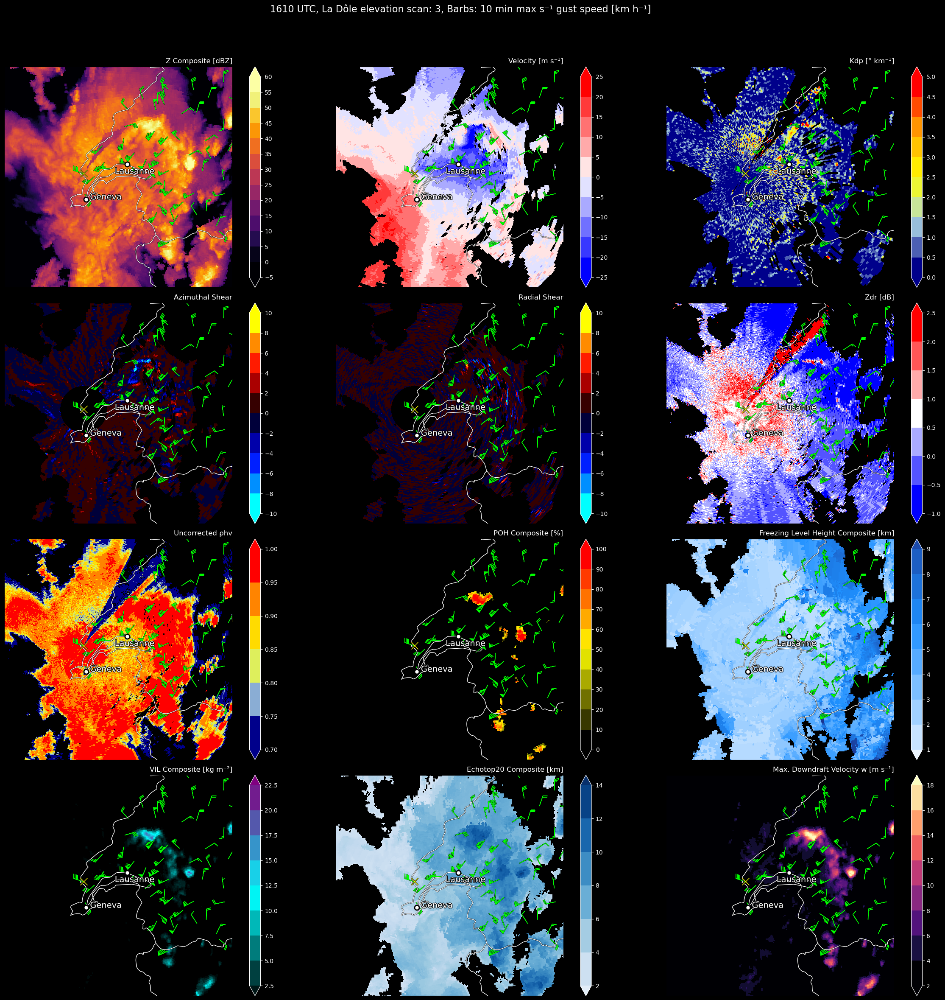

In [ ]:
# Multi-variable plot
projection = ccrs.epsg(3035)
# Create figure with three subplots (Reflectivity, Velocity, and Dealiased Velocity)
fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(24, 24), subplot_kw={'projection': projection})

# Set background to black for all subplots
for row in axs:  # axs is a 2D array, so iterate through rows
    for ax in row:  # Iterate through each subplot in the row
        fig.patch.set_facecolor('black')  # Set figure background
        ax.set_facecolor('black')  # Set axis background


# Plot Reflectivity composite
cmap_czc.set_bad(color='grey')
p1 = axs[0,0].pcolormesh(clons, clats, czc, vmin=0, vmax=55, 
                   cmap=cmap_czc, transform=projection)
# Add a colorbar
cbar1 = plt.colorbar(p1, ax=axs[0,0], extend='both', cmap=cmap_czc, norm=czc_norm, boundaries=czc_levels, ticks=czc_levels
                     )
cbar1.outline.set_edgecolor('white')
cbar1.ax.yaxis.set_tick_params(color='white')
plt.setp(plt.getp(cbar1.ax.axes, 'yticklabels'), color='white')
axs[0,0].set_title('Z Composite [dBZ]', color='white', loc='right')


# Plot Dealiased Velocity
cmap_velocity.set_bad(color='black')
p2 = axs[0,1].pcolormesh(lons, lats, dv_velocity, cmap=cmap_velocity, norm=velocity_norm, transform=ccrs.PlateCarree())
cbar2 = plt.colorbar(p2, ax=axs[0,1], cmap=cmap_velocity, extend='both', boundaries=velocity_levels, ticks=velocity_levels)
cbar2.outline.set_edgecolor('white')
cbar2.ax.yaxis.set_tick_params(color='white')
plt.setp(plt.getp(cbar2.ax.axes, 'yticklabels'), color='white')
axs[0,1].set_title('Velocity [m s⁻¹]', color='white', loc='right')


# Plot Radial shear
#cmap_specw.set_bad(color='black')
cmap_div_shear.set_bad(color='black')
p9 = axs[1,1].pcolormesh(lons, lats, llsd_vel[1], cmap=cmap_div_shear, norm=div_shear_norm, 
                         transform=ccrs.PlateCarree())
cbar9 = plt.colorbar(p9, ax=axs[1,1], cmap=cmap_div_shear, extend='both', boundaries=div_shear_levels, ticks=div_shear_levels
                     )
cbar9.outline.set_edgecolor('white')
cbar9.ax.yaxis.set_tick_params(color='white')
plt.setp(plt.getp(cbar9.ax.axes, 'yticklabels'), color='white')
axs[1,1].set_title('Radial Shear', color='white', loc='right')

# Plot Azmiutal shear
#cmap_specw.set_bad(color='black')
cmap_az_shear.set_bad(color='black')
p9 = axs[1,0].pcolormesh(lons, lats, llsd_vel[0], cmap=cmap_az_shear, norm=az_shear_norm, 
                         transform=ccrs.PlateCarree())
cbar9 = plt.colorbar(p9, ax=axs[1,0], cmap=cmap_az_shear, extend='both', boundaries=az_shear_levels, ticks=az_shear_levels
                     )
cbar9.outline.set_edgecolor('white')
cbar9.ax.yaxis.set_tick_params(color='white')
plt.setp(plt.getp(cbar9.ax.axes, 'yticklabels'), color='white')
axs[1,0].set_title('Azimuthal Shear', color='white', loc='right')


# Plot Freezing level height
# Mask values of freezing level height that are 0 or lower
hzc_masked = np.ma.masked_less_equal(hzc, 0)
# Define a custom colormap, setting the under value (for masked/low values) to black
#cmap_hzc.set_under('black')  # Black for values 0 or lower
cmap_hzc.set_bad(color='black')  # Black for invalid data
# Plot the freezing level height with the masked values
p3 = axs[2,2].pcolormesh(clons, clats, hzc_masked, vmin=0, vmax=12, 
                         cmap=cmap_hzc, transform=projection)
# Add a colorbar
cbar3 = plt.colorbar(p3, ax=axs[2,2], extend='both', cmap=cmap_hzc, boundaries=hzc_levels, ticks=hzc_levels)
cbar3.outline.set_edgecolor('white')
cbar3.ax.yaxis.set_tick_params(color='white')
plt.setp(plt.getp(cbar3.ax.axes, 'yticklabels'), color='white')
axs[2,2].set_title('Freezing Level Height Composite [km]', color='white', loc='right')


# Plot Differential Reflectivity
cmap_diff_reflectivity.set_bad(color='black')
p4 = axs[1,2].pcolormesh(lons, lats, diff_reflectivity, cmap=cmap_diff_reflectivity, norm=diff_reflectivity_norm, 
                         transform=ccrs.PlateCarree())
cbar4 = plt.colorbar(p4, ax=axs[1,2], cmap=cmap_diff_reflectivity, extend='both', boundaries=diff_reflectivity_levels, ticks=diff_reflectivity_levels
                     )
cbar4.outline.set_edgecolor('white')
cbar4.ax.yaxis.set_tick_params(color='white')
plt.setp(plt.getp(cbar4.ax.axes, 'yticklabels'), color='white')
axs[1,2].set_title('Zdr [dB]', color='white', loc='right')


# Plot Differential Phase
#cmap_diff_phase.set_bad(color='black')
#p5 = axs[1,1].pcolormesh(lons, lats, diff_phase, cmap=cmap_diff_phase, norm=diff_phase_norm, 
                         #transform=ccrs.PlateCarree())
#cbar5 = plt.colorbar(p5, ax=axs[1,1], cmap=cmap_diff_phase, extend='both', boundaries=diff_phase_levels, ticks=diff_phase_levels
                     #)
#cbar5.outline.set_edgecolor('white')
#cbar5.ax.yaxis.set_tick_params(color='white')
#plt.setp(plt.getp(cbar5.ax.axes, 'yticklabels'), color='white')
#axs[1,1].set_title('Uncorrected ΦDP [°]', color='white', loc='right')


# Plot CC ratio
cmap_cc_ratio.set_bad(color='black')
p6 = axs[2,0].pcolormesh(lons, lats, cc_ratio, cmap=cmap_cc_ratio, norm=cc_ratio_norm, 
                         transform=ccrs.PlateCarree())
cbar6 = plt.colorbar(p6, ax=axs[2,0], cmap=cmap_cc_ratio, extend='both', boundaries=cc_ratio_levels, ticks=cc_ratio_levels
                     )
cbar6.outline.set_edgecolor('white')
cbar6.ax.yaxis.set_tick_params(color='white')
plt.setp(plt.getp(cbar6.ax.axes, 'yticklabels'), color='white')
axs[2,0].set_title('Uncorrected ρhv', color='white', loc='right')


# Plot Kdp
cmap_Kdp.set_bad(color='black')
p7 = axs[0,2].pcolormesh(lons, lats, Kdp, norm=Kdp_norm,
                   cmap=cmap_Kdp, transform=ccrs.PlateCarree())
# Add a colorbar
cbar7 = plt.colorbar(p7, ax=axs[0,2], extend='both', cmap=cmap_Kdp, boundaries=Kdp_levels, ticks=Kdp_levels
                     )
cbar7.outline.set_edgecolor('white')
cbar7.ax.yaxis.set_tick_params(color='white')
plt.setp(plt.getp(cbar7.ax.axes, 'yticklabels'), color='white')
axs[0,2].set_title('Kdp [° km⁻¹]', color='white', loc='right')


# Plot POH
cmap_bzc.set_bad(color='black')
p8 = axs[2,1].pcolormesh(clons, clats, bzc, norm=bzc_norm,
                   cmap=cmap_bzc, transform=projection)
# Add a colorbar
cbar8 = plt.colorbar(p8, ax=axs[2,1], extend='both', cmap=cmap_bzc, boundaries=bzc_levels, ticks=bzc_levels
                     )
cbar8.outline.set_edgecolor('white')
cbar8.ax.yaxis.set_tick_params(color='white')
plt.setp(plt.getp(cbar8.ax.axes, 'yticklabels'), color='white')
axs[2,1].set_title('POH Composite [%]', color='white', loc='right')


# Plot Spectrum Width
#cmap_specw.set_bad(color='black')
#p9 = axs[2,2].pcolormesh(lons, lats, specw, cmap=cmap_specw, norm=specw_norm, 
                         #transform=ccrs.PlateCarree())
#cbar9 = plt.colorbar(p9, ax=axs[2,2], cmap=cmap_specw, extend='both', boundaries=specw_levels, ticks=specw_levels
                     #)
#cbar9.outline.set_edgecolor('white')
#cbar9.ax.yaxis.set_tick_params(color='white')
#plt.setp(plt.getp(cbar9.ax.axes, 'yticklabels'), color='white')
#axs[2,2].set_title('Spectrum Width [m s⁻¹]', color='white', loc='right')

# Plot VIL composite
#lzc = np.ma.masked_less_equal(lzc, 0.1)
cmap_lzc.set_bad(color='black')
p10 = axs[3,0].pcolormesh(clons, clats, lzc, vmin=1, vmax=22.5, 
                   cmap=cmap_lzc, transform=projection)
# Add a colorbar
cbar10 = plt.colorbar(p10, ax=axs[3,0], extend='both', cmap=cmap_lzc, norm=lzc_norm, boundaries=lzc_levels, ticks=lzc_levels
                     )
cbar10.outline.set_edgecolor('white')
cbar10.ax.yaxis.set_tick_params(color='white')
plt.setp(plt.getp(cbar10.ax.axes, 'yticklabels'), color='white')
axs[3,0].set_title('VIL Composite [kg m⁻²]', color='white', loc='right')

# Plot Echotop 20 composite
# Set a mask
ezc = np.ma.masked_less_equal(ezc, 0)
cmap_ezc.set_bad(color='black')
p11 = axs[3,1].pcolormesh(clons, clats, ezc, vmin=0, vmax=14, 
                   cmap=cmap_ezc, transform=projection)
# Add a colorbar
cbar11 = plt.colorbar(p11, ax=axs[3,1], extend='both', cmap=cmap_ezc, norm=ezc_norm, boundaries=ezc_levels, ticks=ezc_levels
                     )
cbar11.outline.set_edgecolor('white')
cbar11.ax.yaxis.set_tick_params(color='white')
plt.setp(plt.getp(cbar11.ax.axes, 'yticklabels'), color='white')
axs[3,1].set_title('Echotop20 Composite [km]', color='white', loc='right')

# Plot wge composite
# Set a mask
wge = np.ma.masked_less_equal(wge, 0)
cmap_wge.set_bad(color='black')
p12 = axs[3,2].pcolormesh(clons, clats, wge, vmax=18, 
                   cmap=cmap_wge, transform=projection)
# Add a colorbar
cbar12 = plt.colorbar(p12, ax=axs[3,2], extend='both', cmap=cmap_wge, norm=wge_norm, boundaries=wge_levels, ticks=wge_levels
                     )
cbar12.outline.set_edgecolor('white')
cbar12.ax.yaxis.set_tick_params(color='white')
plt.setp(plt.getp(cbar12.ax.axes, 'yticklabels'), color='white')
axs[3,2].set_title('Max. Downdraft Velocity w [m s⁻¹]', color='white', loc='right')

# (Plotting of wind barbs and other features remains the same)
# Add Radar, Geneva, and Lausanne locations to all plots
for row in axs:
    for ax in row:
        #ax.plot(radar_lon, radar_lat, marker='x', color='yellow', markersize=12, transform=projection)  # Radar location
        ax.plot(radar_lon, radar_lat, marker='x', color='yellow', markersize=12, transform=ccrs.PlateCarree(), path_effects=[path_effects.withStroke(linewidth=2, foreground='black')])
        ax.plot(geneva_lon, geneva_lat, marker='o', color='white', markersize=8, markeredgecolor='black', markeredgewidth=2, transform=ccrs.PlateCarree())  # Geneva
        ax.plot(lausanne_lon, lausanne_lat, marker='o', color='white', markersize=8, markeredgecolor='black', markeredgewidth=2, transform=ccrs.PlateCarree())  # Lausanne
        ax.set_extent([5.2, 7.9, 45.5, 47.3], crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.BORDERS, edgecolor='black', linestyle='-', alpha=0.8, linewidth=2)
        ax.add_feature(cfeature.COASTLINE, edgecolor='black', alpha=0.8, linewidth=2)
        ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='none', alpha=0.8, linewidth=2)
        ax.add_feature(cfeature.BORDERS, edgecolor='white', linestyle='-', alpha=1)
        ax.add_feature(cfeature.COASTLINE, edgecolor='white', alpha=1)
        ax.add_feature(cfeature.LAKES, edgecolor='white', facecolor='none', alpha=1)
        # Add city names with a black outline for visibility
        geneva_text = ax.text(geneva_lon + 0.05, geneva_lat, 'Geneva', color='white', fontsize=14, transform=ccrs.PlateCarree())
        lausanne_text = ax.text(lausanne_lon - 0.15, lausanne_lat - 0.085, 'Lausanne', color='white', fontsize=14, transform=ccrs.PlateCarree())
        geneva_text.set_path_effects([path_effects.Stroke(linewidth=2, foreground='black'), path_effects.Normal()])
        lausanne_text.set_path_effects([path_effects.Stroke(linewidth=2, foreground='black'), path_effects.Normal()])




# Data import, assimilation
file_path = '/scratch/mch/fackerma/orders/case_150619/stations/20190615.csv'

# Open the file and read its contents
with open(file_path, 'r') as file:
    station_data = file.readlines()  # Read all lines into a list

# Import stations readme
file_path = '/users/fackerma/newproject1/stations_readme.csv'

# Open and read the file as plain text
try:
    with open(file_path, 'r') as stations:
        stations = stations.readlines()  # Read all lines into a list
    #for line in content[:10]:  # Print the first 10 lines for inspection
        #print(line.strip())
except Exception as e:
    print(f"Error reading file: {e}")

# Parse the station metadata to create a dictionary mapping station ID to coordinates and altitude
station_info = {}

# Extract the relevant station data from 'stations' (first 158 rows)
for line in stations[0:0+158]:  # Starts from line 5, inclusive
    parts = line.strip().split("\t")
    station_id = parts[0].strip()  # First column: Station ID
    
    # Extract coordinates (last column)
    coordinates = parts[-1].strip()  
    x, y = map(int, coordinates.split("/"))  # Split the coordinates into x and y

    # Extract altitude (using regex to find the number before "m a.s.l.")
    altitude_match = re.search(r'(\d+)\s*m\s*a\.s\.l\.', parts[1])
    altitude = int(altitude_match.group(1)) if altitude_match else None  # Default to None if no altitude found
    
    station_info[station_id] = (x, y, altitude)

# Add Swiss coordinates and altitude to 'station_data'
updated_station_data = []

# Add headers for clarity
header = station_data[0].strip() + "   X_COORD   Y_COORD   ALTITUDE\n"
updated_station_data.append(header)

for line in station_data[1:]:  # Skip the header
    parts = line.strip().split()
    station_id = parts[0].strip()  # First column: Station ID
    
    # Lookup coordinates and altitude for the station
    x, y, altitude = station_info.get(station_id, (None, None, None))
    
    if x is not None and y is not None and altitude is not None:
        # Append the coordinates and altitude as new columns
        updated_line = line.strip() + f"   {x}   {y}   {altitude}\n"
    else:
        # In case no coordinates or altitude are found (unlikely here), keep it unchanged
        updated_line = line.strip() + "   N/A   N/A   N/A\n"
    
    updated_station_data.append(updated_line)

# Assuming converter.LV03toWGS84() function is defined, and it converts LV03 to WGS84
# Function to convert LV03 to WGS84 (assuming this is already defined)
# Example: converter.LV03toWGS84(x, y, altitude) returns [latitude, longitude, altitude]

# Iterate over each row in updated_station_data (skip the header)
for i, line in enumerate(updated_station_data[1:], start=1):
    parts = line.strip().split()
    
    # Extract the X_COORD, Y_COORD, and ALTITUDE for the current station
    x_coord = int(parts[-3])  # X_COORD is the second last column
    y_coord = int(parts[-2])  # Y_COORD is the last column before altitude
    altitude = int(parts[-1])  # ALTITUDE is the last column in the row
    
    # Convert LV03 (x_coord, y_coord, altitude) to WGS84 (latitude, longitude, altitude)
    wgs84 = converter.LV03toWGS84(x_coord, y_coord, altitude)
    
    # Append the WGS84 values as new columns: latitude, longitude, altitude
    updated_station_data[i] = line.strip() + f"   {wgs84[0]}   {wgs84[1]}   {wgs84[2]}"
    
# Add headers for latitude, longitude, and altitude to the header row
header = updated_station_data[0].strip() + "   LATITUDE   LONGITUDE   ALTITUDE_NEW"
updated_station_data[0] = header

# Data assimilation
# Extract the headers and rows
headers = updated_station_data[0].split()
data = [line.split() for line in updated_station_data[1:]]

# Create a DataFrame
df = pd.DataFrame(data, columns=headers)

# Convert relevant columns to numeric (e.g., the wind gust column '101')
df['101'] = pd.to_numeric(df['101'], errors='coerce')
df['197'] = pd.to_numeric(df['197'], errors='coerce')
df['UTC'] = (df['JAHR'].astype(str) +
                      df['MO'].astype(str).str.zfill(2) +
                      df['TG'].astype(str).str.zfill(2) +
                      df['HH'].astype(str).str.zfill(2) +
                      df['MM'].astype(str).str.zfill(2))

# Filter the data for the timestamp closest to 14:30 UTC (1430)
target_time = '20190615' + valid_time3
filtered_df = df[df['UTC'] == target_time]
# Filter out rows where the '101' value is greater than 200
filtered_df = filtered_df[filtered_df['101'] <= 200]

# Extract necessary columns (station ID, wind speed, wind direction)
wind_speeds = filtered_df['101'].values
wind_directions = filtered_df['197'].values
station_ids = filtered_df['STA'].values

filtered_df['LONGITUDE'] = pd.to_numeric(filtered_df['LONGITUDE'], errors='coerce')
filtered_df['LATITUDE'] = pd.to_numeric(filtered_df['LATITUDE'], errors='coerce')
filtered_df['101'] = pd.to_numeric(filtered_df['101'], errors='coerce')
filtered_df['197'] = pd.to_numeric(filtered_df['197'], errors='coerce')

# Drop rows with invalid data
filtered_df = filtered_df.dropna(subset=['LONGITUDE', 'LATITUDE', '101', '197'])


# Select a specific subplot for the wind barbs (e.g., the first subplot)
#ax = axs[0:3, 0:2]  # Adjust the index based on your layout preference

# Iterate over rows in the filtered dataframe
for _, row in filtered_df.iterrows():
    try:
        # Extract values directly without wrapping them in float or np.array
        longitude = row['LONGITUDE']
        latitude = row['LATITUDE']
        speed = row['101']  # Wind speed
        direction = row['197']  # Wind direction

        # Ensure the values are 1-dimensional arrays
        longitude = np.array([longitude])  # Wrap as 1D array
        latitude = np.array([latitude])    # Wrap as 1D array
        speed = np.array([speed])
        direction = np.array([direction])
        
        # Convert to wind components
        u = -speed * np.sin(np.radians(direction)) * 3.6
        v = -speed * np.cos(np.radians(direction)) * 3.6
        
        for row in axs:
            for ax in row:
        # Add a single wind barb
                ax.barbs(longitude, latitude, u, v, transform=ccrs.PlateCarree(), color='black', length=6, linewidth=1.5)
                ax.barbs(longitude, latitude, u, v, transform=ccrs.PlateCarree(), color='lime', length=6, linewidth=1)
    except ValueError as e:
        print(f"Skipping row due to error: {e}")


# Set main title
plt.suptitle(valid_time3 + ' UTC, ' + radar_name + ' elevation scan: ' + elevation_scan + ', Barbs: 10 min max s⁻¹ gust speed [km h⁻¹]', color='white', fontsize=16, x=0.5)
# Adjust layout and display the plot
plt.tight_layout(rect=[0, 0, 1, 0.95])

# Save the figure
#plt.savefig("/users/fackerma/newproject1/figures/first_case/" + radar_station + valid_time3 + "_" + elevation_scan + "_all_variables.png", facecolor='black', dpi=300)

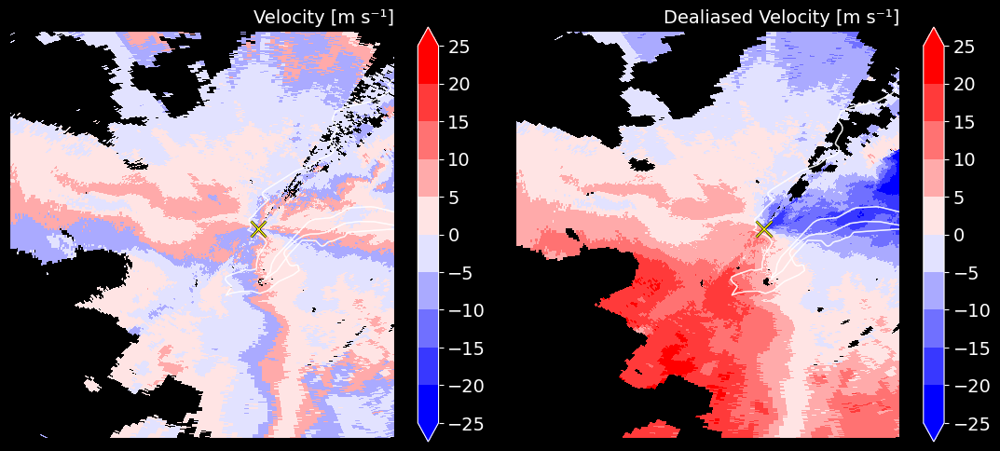

In [7]:
# Demonstrate Dealiased Velocity and Raw Velocity

# Create figure with two subplots (dARC and dBZC composites)
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(11, 5), subplot_kw={'projection': ccrs.PlateCarree()})

# Set background to black for all subplots
fig.patch.set_facecolor('black')  # Set the overall figure background
for ax in axs:  # Directly iterate over axs (1D array of subplots)
    ax.set_facecolor('black')  # Set each axis background


# Plot Velocity
cmap_velocity = LinearSegmentedColormap.from_list("custom_cmap", ["blue", "white", "red"], N=256)
cmap_velocity.set_bad(color='black')
p2 = axs[0].pcolormesh(lons, lats, velocity, cmap=cmap_velocity, norm=velocity_norm, transform=ccrs.PlateCarree())
axs[0].set_extent([5, 6.7, 45.5, 47.3], crs=ccrs.PlateCarree())
axs[0].add_feature(cfeature.BORDERS, edgecolor='white', linestyle='-', alpha=0.7)
axs[0].add_feature(cfeature.COASTLINE, edgecolor='white', alpha=0.7)
axs[0].add_feature(cfeature.LAKES, edgecolor='white', facecolor='none', alpha=0.7)
cbar2 = plt.colorbar(p2, ax=axs[0], cmap=cmap_velocity, extend='both', boundaries=velocity_levels, ticks=velocity_levels)
cbar2.outline.set_edgecolor('white')
cbar2.ax.yaxis.set_tick_params(color='white', labelsize=14)
plt.setp(plt.getp(cbar2.ax.axes, 'yticklabels'), color='white')
axs[0].set_title('Velocity [m s⁻¹]', color='white', loc='right', fontsize=14)

# Plot Dealiased Velocity
p3 = axs[1].pcolormesh(lons, lats, dv_velocity, cmap=cmap_velocity, norm=velocity_norm, transform=ccrs.PlateCarree())
axs[1].set_extent([5, 6.7, 45.5, 47.3], crs=ccrs.PlateCarree())
axs[1].add_feature(cfeature.BORDERS, edgecolor='white', linestyle='-', alpha=0.7)
axs[1].add_feature(cfeature.COASTLINE, edgecolor='white', alpha=0.7)
axs[1].add_feature(cfeature.LAKES, edgecolor='white', facecolor='none', alpha=0.7)
cbar3 = plt.colorbar(p3, ax=axs[1], cmap=cmap_velocity, extend='both', boundaries=velocity_levels, ticks=velocity_levels)
cbar3.outline.set_edgecolor('white')
cbar3.ax.yaxis.set_tick_params(color='white', labelsize=14)
plt.setp(plt.getp(cbar3.ax.axes, 'yticklabels'), color='white')
axs[1].set_title('Dealiased Velocity [m s⁻¹]', color='white', loc='right', fontsize=14)

# Add Radar, Geneva, and Lausanne locations to all plots
for ax in axs:
    ax.plot(radar_lon, radar_lat, marker='x', color='yellow', markersize=12, transform=ccrs.PlateCarree(),
            path_effects=[path_effects.withStroke(linewidth=2, foreground='black')])
    #ax.plot(geneva_lon, geneva_lat, marker='o', color='white', markersize=8, markeredgecolor='black', markeredgewidth=2, transform=ccrs.PlateCarree())
    #ax.plot(lausanne_lon, lausanne_lat, marker='o', color='white', markersize=8, markeredgecolor='black', markeredgewidth=2, transform=ccrs.PlateCarree())
    ax.set_extent([5, 6.7, 45.5, 47.3], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.BORDERS, edgecolor='white', linestyle='-', alpha=0.7)
    ax.add_feature(cfeature.COASTLINE, edgecolor='white', alpha=0.7)
    ax.add_feature(cfeature.LAKES, edgecolor='white', facecolor='none', alpha=0.7)
    # Add city names with a black outline for visibility
    #geneva_text = ax.text(geneva_lon + 0.05, geneva_lat, 'Geneva', color='white', fontsize=10, transform=ccrs.PlateCarree())
    #lausanne_text = ax.text(lausanne_lon - 0.15, lausanne_lat - 0.085, 'Lausanne', color='white', fontsize=10, transform=ccrs.PlateCarree())
    #geneva_text.set_path_effects([path_effects.Stroke(linewidth=2, foreground='black'), path_effects.Normal()])
    #lausanne_text.set_path_effects([path_effects.Stroke(linewidth=2, foreground='black'), path_effects.Normal()])

# Adjust layout and display the plot
plt.tight_layout(rect=[0, 0, 1, 0.95])

# Save the figure (adjust this line to your desired path)
#plt.savefig("/users/fackerma/newproject1/figures/first_case/R2R2_Dealiasing_3.png", facecolor='black', dpi=300)

plt.show()


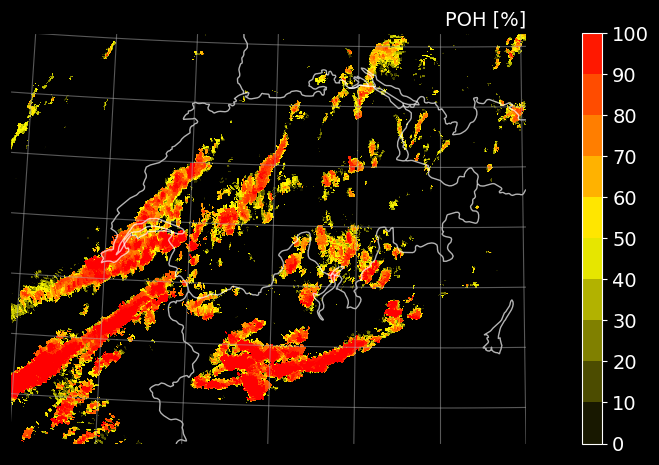

In [15]:
# Daily POH

projection = ccrs.epsg(3035)
# Create figure with one subplot (dBZC composite)
fig, ax = plt.subplots(figsize=(11.5, 5), subplot_kw={'projection': projection})

# Set background to black for the plot
fig.patch.set_facecolor('black')  # Set the overall figure background
ax.set_facecolor('black')  # Set axis background

# Plot dBZC composite
dBZC = np.ma.masked_less_equal(dBZC, 0)
cmap_dBZC = cmap_bzc
cmap_dBZC.set_bad(color='black')
p2 = ax.pcolormesh(clons, clats, dBZC, cmap=cmap_dBZC, transform=projection, vmin=0, vmax=100)

# Add a colorbar for the plot, capping it between 0 and 100
cbar2 = plt.colorbar(p2, ax=ax, extend='neither', cmap=cmap_dBZC, boundaries=np.linspace(0, 100, 11), ticks=np.linspace(0, 100, 11))
cbar2.outline.set_edgecolor('white')
cbar2.ax.yaxis.set_tick_params(color='white', labelsize=14)
plt.setp(plt.getp(cbar2.ax.axes, 'yticklabels'), color='white')
ax.set_title('POH [%]', color='white', loc='right', fontsize=14)

# Add Radar, Geneva, and Lausanne locations to the plot
# ax.plot(radar_lon, radar_lat, marker='x', color='yellow', markersize=12, transform=ccrs.PlateCarree(),
#         path_effects=[path_effects.withStroke(linewidth=2, foreground='black')])
# ax.plot(geneva_lon, geneva_lat, marker='o', color='white', markersize=8, markeredgecolor='black', markeredgewidth=2, transform=ccrs.PlateCarree())
# ax.plot(lausanne_lon, lausanne_lat, marker='o', color='white', markersize=8, markeredgecolor='black', markeredgewidth=2, transform=ccrs.PlateCarree())
ax.set_extent([5, 11, 44.7, 48], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.BORDERS, edgecolor='white', linestyle='-', alpha=0.7#, transform=ccrs.PlateCarree()
               )
ax.add_feature(cfeature.COASTLINE, edgecolor='white', alpha=0.7#, transform=ccrs.PlateCarree()
               )
ax.add_feature(cfeature.LAKES, edgecolor='white', facecolor='none', alpha=0.7#, transform=ccrs.PlateCarree()
               )
ax.gridlines(alpha=0.5)

# Adjust layout and display the plot
plt.tight_layout(rect=[0, 0, 1, 0.95])

# Save the figure (adjust this line to your desired path)
#plt.savefig("/users/fackerma/newproject1/figures/first_case/dailyPOH_2.png", facecolor='black', dpi=300)

plt.show()


In [ ]:
# Plot for 16:10 UTC

# Create figure with three subplots (Reflectivity, Velocity, and Dealiased Velocity)
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(11, 11), subplot_kw={'projection': ccrs.PlateCarree()})

# Set background to black for all subplots
for row in axs:  # axs is a 2D array, so iterate through rows
    for ax in row:  # Iterate through each subplot in the row
        fig.patch.set_facecolor('black')  # Set figure background
        ax.set_facecolor('black')  # Set axis background


# Plot Reflectivity composite
cmap_czc = plt.cm.inferno
cmap_czc.set_bad(color='grey')
p1 = axs[0,0].pcolormesh(clons, clats, czc, #vmin=0, vmax=12, 
                   cmap=cmap_czc, transform=ccrs.PlateCarree())
# Add a colorbar
cbar1 = plt.colorbar(p1, ax=axs[0,0], extend='both', cmap=cmap_czc, norm=czc_norm, boundaries=czc_levels, ticks=czc_levels
                     )
cbar1.outline.set_edgecolor('white')
cbar1.ax.yaxis.set_tick_params(color='white', labelsize=14)
plt.setp(plt.getp(cbar1.ax.axes, 'yticklabels'), color='white')
axs[0,0].set_title('Z Composite [dBZ]', color='white', loc='right', fontsize=14)


# Plot Dealiased Velocity
cmap_velocity = LinearSegmentedColormap.from_list("custom_cmap", ["blue", "white", "red"], N=256)
cmap_velocity.set_bad(color='black')
p2 = axs[0,1].pcolormesh(lons, lats, dv_velocity, cmap=cmap_velocity, norm=velocity_norm, transform=ccrs.PlateCarree())
cbar2 = plt.colorbar(p2, ax=axs[0,1], cmap=cmap_velocity, extend='both', boundaries=velocity_levels, ticks=velocity_levels)
cbar2.outline.set_edgecolor('white')
cbar2.ax.yaxis.set_tick_params(color='white', labelsize=14)
plt.setp(plt.getp(cbar2.ax.axes, 'yticklabels'), color='white')
axs[0,1].set_title('Velocity [m s⁻¹]', color='white', loc='right', fontsize=14)


# Plot Kdp
cmap_Kdp = LinearSegmentedColormap.from_list("custom_cmap", ["darkblue", "lightblue","yellow","orange","red"], N=256)
cmap_Kdp.set_bad(color='black')
p7 = axs[1,0].pcolormesh(lons, lats, Kdp, norm=Kdp_norm,
                   cmap=cmap_Kdp, transform=ccrs.PlateCarree())
# Add a colorbar
cbar7 = plt.colorbar(p7, ax=axs[1,0], extend='both', cmap=cmap_Kdp, boundaries=Kdp_levels, ticks=Kdp_levels
                     )
cbar7.outline.set_edgecolor('white')
cbar7.ax.yaxis.set_tick_params(color='white', labelsize=14)
plt.setp(plt.getp(cbar7.ax.axes, 'yticklabels'), color='white')
axs[1,0].set_title('Kdp [° km⁻¹]', color='white', loc='right', fontsize=14)


# Plot wge composite
# Set a mask
wge = np.ma.masked_less_equal(wge, 0)
cmap_wge = plt.cm.magma
cmap_wge.set_bad(color='black')
p12 = axs[1,1].pcolormesh(clons, clats, wge, #vmin=0, vmax=12, 
                   cmap=cmap_wge, transform=ccrs.PlateCarree())
# Add a colorbar
cbar12 = plt.colorbar(p12, ax=axs[1,1], extend='both', cmap=cmap_wge, norm=wge_norm, boundaries=wge_levels, ticks=wge_levels
                     )
cbar12.outline.set_edgecolor('white')
cbar12.ax.yaxis.set_tick_params(color='white', labelsize=14)
plt.setp(plt.getp(cbar12.ax.axes, 'yticklabels'), color='white')
axs[1,1].set_title('Max. Downdraft Velocity w [m s⁻¹]', color='white', loc='right', fontsize=14)

# (Plotting of wind barbs and other features remains the same)
# Add Radar, Geneva, and Lausanne locations to all plots
for row in axs:
    for ax in row:
            #ax.plot(radar_lon, radar_lat, marker='x', color='yellow', markersize=12, transform=ccrs.PlateCarree())  # Radar location
        ax.plot(radar_lon, radar_lat, marker='x', color='yellow', markersize=12, transform=ccrs.PlateCarree(),
        path_effects=[path_effects.withStroke(linewidth=2, foreground='black')])
        ax.plot(geneva_lon, geneva_lat, marker='o', color='white', markersize=8, markeredgecolor='black', markeredgewidth=2, transform=ccrs.PlateCarree())  # Geneva
        ax.plot(lausanne_lon, lausanne_lat, marker='o', color='white', markersize=8, markeredgecolor='black', markeredgewidth=2, transform=ccrs.PlateCarree())  # Lausanne
        ax.set_extent([5.7, 7.4, 45.5, 47.3], crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.BORDERS, edgecolor='white', linestyle='-', alpha=1)
        ax.add_feature(cfeature.COASTLINE, edgecolor='white', alpha=1)
        ax.add_feature(cfeature.LAKES, edgecolor='white', facecolor='none', alpha=1)
        # Add city names with a black outline for visibility
        geneva_text = ax.text(geneva_lon + 0.05, geneva_lat, 'Geneva', color='white', fontsize=14, transform=ccrs.PlateCarree())
        lausanne_text = ax.text(lausanne_lon - 0.15, lausanne_lat - 0.085, 'Lausanne', color='white', fontsize=14, transform=ccrs.PlateCarree())
        geneva_text.set_path_effects([path_effects.Stroke(linewidth=2, foreground='black'), path_effects.Normal()])
        lausanne_text.set_path_effects([path_effects.Stroke(linewidth=2, foreground='black'), path_effects.Normal()])



# Filter the data for the timestamp closest to 14:30 UTC (1430)
target_time = pd.Timestamp('2019-06-15 ' + valid_time2 + ':00')
filtered_df = stations_df[stations_df['time'] == target_time]
# Extract necessary columns (station ID, wind speed, wind direction)
wind_speeds = filtered_df['fkl010z0'].values
wind_directions = filtered_df['dkl010z0'].values
station_ids = filtered_df['stn'].values


# Extract lat/lon for the stations in the filtered data
# Swiss KM-coordinates for all stations
swiss_coords = {
    13: (577041, 147655),   # Château-d'Oex
    38: (567719, 155077),   # Le Moléson
    748: (571758, 167317),  # Marsens
    850: (555506, 158053),  # Oron
    32: (562131, 184611),   # Payerne
    309: (513821, 169387),  # Les Charbonnières
    308: (533458, 176567),  # Mathod
    762: (544198, 163651),  # Villars-Tiercelin
    77: (534225, 188081),   # Bullet / La Frétaz
    521: (573818, 137852),  # Col des Mosses
    37: (560405, 130713),   # Aigle
    268: (555264, 138175),  # Bouveret
    205: (552106, 146847),  # Vevey / Corseaux
    61: (540819, 151510),   # Pully
    331: (523549, 148525),  # St-Prex
    849: (515888, 153210),  # Bière
    31: (497998, 145539),   # Nyon / Changins
    517: (512005, 144552)   # Genf-Cointrin
}
# Transformation for Swiss KM to WGS84 lat/lon
transformer = Transformer.from_crs(21781, 4326, always_xy=True)
# Function to convert Swiss KM-coordinates to lat/lon
def convert_swiss_to_latlon(swiss_easting, swiss_northing):
    lon, lat = transformer.transform(swiss_easting, swiss_northing)
    return lat, lon
# List to store the lat/lon for stations
station_lats = []
station_lons = []
# Loop through the station coordinates to convert and store lat/lon
for stn_id, (swiss_x, swiss_y) in swiss_coords.items():
    lat, lon = convert_swiss_to_latlon(swiss_x, swiss_y)
    station_lats.append(lat)
    station_lons.append(lon)
# Convert lists to numpy arrays for easier indexing later
station_lats = np.array(station_lats)
station_lons = np.array(station_lons)

# Convert wind speeds from m/s to km/h
wind_speeds_kmh = wind_speeds * 3.6  # Multiply by 3.6 to convert to km/h
# Plot wind barbs on each subplot
for ax in np.ravel(axs):  # Ensure axs is flattened to loop over subplots
    # Loop through each station and plot the barbs
    for i in range(len(station_ids)):
        # Ensure we do not go out of bounds
        if i >= len(station_lats) or i >= len(station_lons):
            continue  # Skip if the index is out of bounds

        u_component = wind_speeds_kmh[i] * np.cos(np.radians(wind_directions[i]))  # U-component
        v_component = wind_speeds_kmh[i] * np.sin(np.radians(wind_directions[i]))  # V-component
        
        if wind_speeds_kmh[i] > 0:  # Only plot barbs for positive wind speeds
            # Plot black barbs first (for the outline)
            ax.barbs(station_lons[i], station_lats[i],
                     u_component, v_component,
                     length=7,  # Length of the barbs
                     linewidth=2,  # Thickness of the outline
                     color='black',  # Black color for outline
                     transform=ccrs.PlateCarree())

            # Plot cyan barbs on top
            ax.barbs(station_lons[i], station_lats[i],
                     u_component, v_component,
                     length=7,  # Length of the barbs
                     linewidth=1.0,  # Normal thickness for color
                     color='lime',  # Desired color for barbs
                     transform=ccrs.PlateCarree())
        else:
            print(f"Warning: Zero wind speed for station ID {station_ids[i]}. Skipping barb plotting.")







# Adjust layout and display the plot
plt.tight_layout(rect=[0, 0, 1, 0.95])

# Save the figure
#plt.savefig("/users/fackerma/newproject1/figures/first_case/Z_V_Kdp_w_1610.png", facecolor='black', dpi=300)

/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)
/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


## TRTC Plots

/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1600: UserWarning: The following kwargs were not used by contour: 'linestyle', 'linewidth'
  result = super().contour(*args, **kwargs)
/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1600: UserWarning: The following kwargs were not used by contour: 'linestyle', 'linewidth'
  result = super().contour(*args, **kwargs)
/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1600: UserWarning: The following kwargs were not used by contour: 'linestyle', 'linewidth'
  result = super().contour(*args, **kwargs)
/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1600: UserWarning: The following kwargs were not used by contour: 'linestyle', 'linewidth'
  result = super().contour(*args, **kwargs)
/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-pa

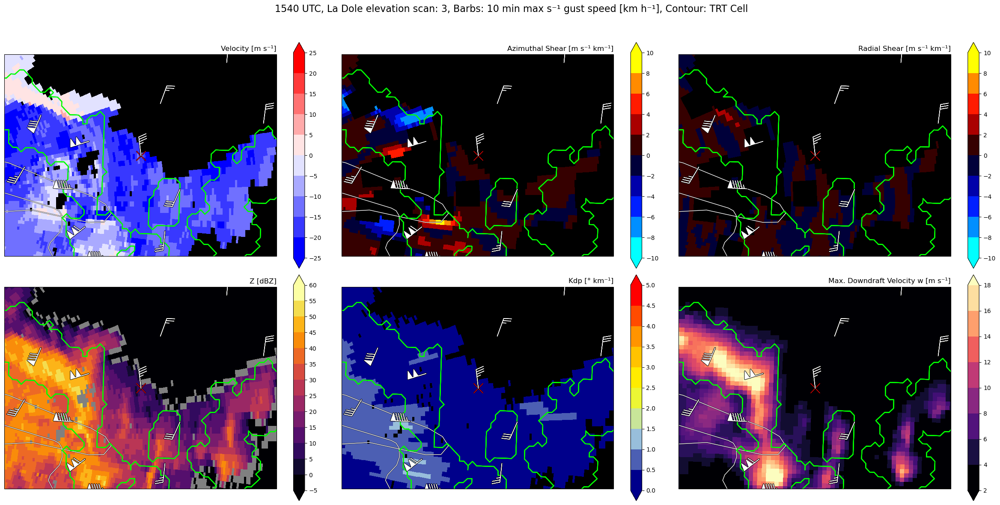

In [4]:
# Moléson 16:10
downburst_location = 'Moléson'
downburst_x = 567719
downburst_y = 155077
downburst_z = 1974

projection = ccrs.epsg(3035)
# Create figure with three subplots (Reflectivity, Velocity, and Dealiased Velocity)
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(24, 12), subplot_kw={'projection': projection})

# Set background to black for all subplots
for row in axs:  # axs is a 2D array, so iterate through rows
    for ax in row:  # Iterate through each subplot in the row
        fig.patch.set_facecolor('white')  # Set figure background
        ax.set_facecolor('white')  # Set axis background

edgecolor = 'black'

wgs84 = converter.LV03toWGS84(downburst_x, downburst_y, downburst_z)
downburst_lat = wgs84[0]
downburst_lon = wgs84[1]

# Plot Dealiased Velocity
cmap_velocity.set_bad(color='black')
p2 = axs[0,0].pcolormesh(lons, lats, dv_velocity, cmap=cmap_velocity, norm=velocity_norm, transform=ccrs.PlateCarree())
cbar2 = plt.colorbar(p2, ax=axs[0,0], cmap=cmap_velocity, extend='both', boundaries=velocity_levels, ticks=velocity_levels)
cbar2.outline.set_edgecolor(edgecolor)
cbar2.ax.yaxis.set_tick_params(color=edgecolor)
plt.setp(plt.getp(cbar2.ax.axes, 'yticklabels'), color=edgecolor)
axs[0,0].set_title('Velocity [m s⁻¹]', color=edgecolor, loc='right')

# Plot Azmiuthal shear
#cmap_specw.set_bad(color='black')
cmap_az_shear.set_bad(color='black')
p9 = axs[0,1].pcolormesh(lons, lats, llsd_vel[0], cmap=cmap_az_shear, norm=az_shear_norm, 
                         transform=ccrs.PlateCarree())
cbar9 = plt.colorbar(p9, ax=axs[0,1], cmap=cmap_az_shear, extend='both', boundaries=az_shear_levels, ticks=az_shear_levels
                     )
cbar9.outline.set_edgecolor(edgecolor)
cbar9.ax.yaxis.set_tick_params(color=edgecolor)
plt.setp(plt.getp(cbar9.ax.axes, 'yticklabels'), color=edgecolor)
axs[0,1].set_title('Azimuthal Shear [m s⁻¹ km⁻¹]', color=edgecolor, loc='right')

# Plot Radial shear
#cmap_specw.set_bad(color='black')
cmap_div_shear.set_bad(color='black')
p9 = axs[0,2].pcolormesh(lons, lats, llsd_vel[1], cmap=cmap_div_shear, norm=div_shear_norm, 
                         transform=ccrs.PlateCarree())
cbar9 = plt.colorbar(p9, ax=axs[0,2], cmap=cmap_div_shear, extend='both', boundaries=div_shear_levels, ticks=div_shear_levels
                     )
cbar9.outline.set_edgecolor(edgecolor)
cbar9.ax.yaxis.set_tick_params(color=edgecolor)
plt.setp(plt.getp(cbar9.ax.axes, 'yticklabels'), color=edgecolor)
axs[0,2].set_title('Radial Shear [m s⁻¹ km⁻¹]', color=edgecolor, loc='right')

# Plot Reflectivity composite
cmap_czc.set_bad(color='grey')
p1 = axs[1,0].pcolormesh(lons, lats, reflectivity, cmap=cmap_czc, norm=czc_norm, transform=ccrs.PlateCarree())
# Add a colorbar
cbar1 = plt.colorbar(p1, ax=axs[1,0], extend='both', cmap=cmap_czc, norm=czc_norm, boundaries=czc_levels, ticks=czc_levels
                     )
cbar1.outline.set_edgecolor(edgecolor)
cbar1.ax.yaxis.set_tick_params(color=edgecolor)
plt.setp(plt.getp(cbar1.ax.axes, 'yticklabels'), color=edgecolor)
axs[1,0].set_title('Z [dBZ]', color=edgecolor, loc='right')


# Plot Kdp
cmap_Kdp.set_bad(color='black')
p7 = axs[1,1].pcolormesh(lons, lats, Kdp, norm=Kdp_norm,
                   cmap=cmap_Kdp, transform=ccrs.PlateCarree())
# Add a colorbar
cbar7 = plt.colorbar(p7, ax=axs[1,1], extend='both', cmap=cmap_Kdp, boundaries=Kdp_levels, ticks=Kdp_levels
                     )
cbar7.outline.set_edgecolor(edgecolor)
cbar7.ax.yaxis.set_tick_params(color=edgecolor)
plt.setp(plt.getp(cbar7.ax.axes, 'yticklabels'), color=edgecolor)
axs[1,1].set_title('Kdp [° km⁻¹]', color=edgecolor, loc='right')


# Plot wge composite
# Set a mask
wge = np.ma.masked_less_equal(wge, 0)
cmap_wge.set_bad(color='black')
p12 = axs[1,2].pcolormesh(clons, clats, wge, vmax=18, 
                   cmap=cmap_wge, transform=projection)
# Add a colorbar
cbar12 = plt.colorbar(p12, ax=axs[1,2], extend='both', cmap=cmap_wge, norm=wge_norm, boundaries=wge_levels, ticks=wge_levels
                     )
cbar12.outline.set_edgecolor(edgecolor)
cbar12.ax.yaxis.set_tick_params(color=edgecolor)
plt.setp(plt.getp(cbar12.ax.axes, 'yticklabels'), color=edgecolor)
axs[1,2].set_title('Max. Downdraft Velocity w [m s⁻¹]', color=edgecolor, loc='right')


# Select a specific subplot for the wind barbs (e.g., the first subplot)
#ax = axs[0:3, 0:2]  # Adjust the index based on your layout preference


# (Plotting of wind barbs and other features remains the same)
# Add Radar, Geneva, and Lausanne locations to all plots
for row in axs:
    for ax in row:
        # Radar location or points of interest
        ax.plot(downburst_lon, downburst_lat, marker='x', color='red', markersize=16, 
            transform=ccrs.PlateCarree(), 
            path_effects=[path_effects.withStroke(linewidth=2, foreground='black')])
    
        # Set the spatial extent of the plot
        ax.set_extent([downburst_lon - 0.4, downburst_lon + 0.4, downburst_lat -0.2, downburst_lat + 0.2], 
                  crs=ccrs.PlateCarree())
    
        # Add geographic features
        ax.add_feature(cfeature.BORDERS, edgecolor='black', linestyle='-', alpha=0.8, linewidth=2)
        ax.add_feature(cfeature.COASTLINE, edgecolor='black', alpha=0.8, linewidth=2)
        ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='none', alpha=0.8, linewidth=2)
        ax.add_feature(cfeature.BORDERS, edgecolor='white', linestyle='-', alpha=1)
        ax.add_feature(cfeature.COASTLINE, edgecolor='white', alpha=1)
        ax.add_feature(cfeature.LAKES, edgecolor='white', facecolor='none', alpha=1)

from matplotlib.colors import to_rgba
lime_green_with_alpha = to_rgba("lime", alpha=0.5)

# Add TRT cells contour to every subplot
for row in axs:
    for ax in row:
        # Ensure cells, lons, and lats are aligned and properly scaled
        ax.contour(lon_trtc, lat_trtc, cells, levels=np.arange(0, 11), colors=[lime_green_with_alpha], alpha=0.5, transform=ccrs.PlateCarree(), linestyle='-', linewidth=0.5)

# Iterate over rows in the filtered dataframe
for _, row in filtered_df.iterrows():
    try:
        # Extract values directly without wrapping them in float or np.array
        longitude = row['LONGITUDE']
        latitude = row['LATITUDE']
        speed = row['101']  # Wind speed
        direction = row['197']  # Wind direction

        # Ensure the values are 1-dimensional arrays
        longitude = np.array([longitude])  # Wrap as 1D array
        latitude = np.array([latitude])    # Wrap as 1D array
        speed = np.array([speed])
        direction = np.array([direction])
        
        # Convert to wind components
        u = -speed * np.sin(np.radians(direction)) * 3.6
        v = -speed * np.cos(np.radians(direction)) * 3.6
        
        for row in axs:
            for ax in row:
        # Add a single wind barb
                ax.barbs(longitude, latitude, u, v, transform=ccrs.PlateCarree(), color='black', length=8, linewidth=2.5, zorder=10)
                ax.barbs(longitude, latitude, u, v, transform=ccrs.PlateCarree(), color='white', length=8, linewidth=1, zorder=11)
    except ValueError as e:
        print(f"Skipping row due to error: {e}")


# Set main title
plt.suptitle(valid_time3 + ' UTC, ' + radar_name + ' elevation scan: ' + elevation_scan + ', Barbs: 10 min max s⁻¹ gust speed [km h⁻¹], Contour: TRT Cell', color=edgecolor, fontsize=16, x=0.5)
# Adjust layout and display the plot
plt.tight_layout(rect=[0, 0, 1, 0.95])

#plt.savefig("/users/fackerma/newproject1/figures/first_case/TRT2/TRT_" + downburst_location + "_" + radar_station + "_" + valid_time3 + "_" + elevation_scan + "_1.png", dpi=300)

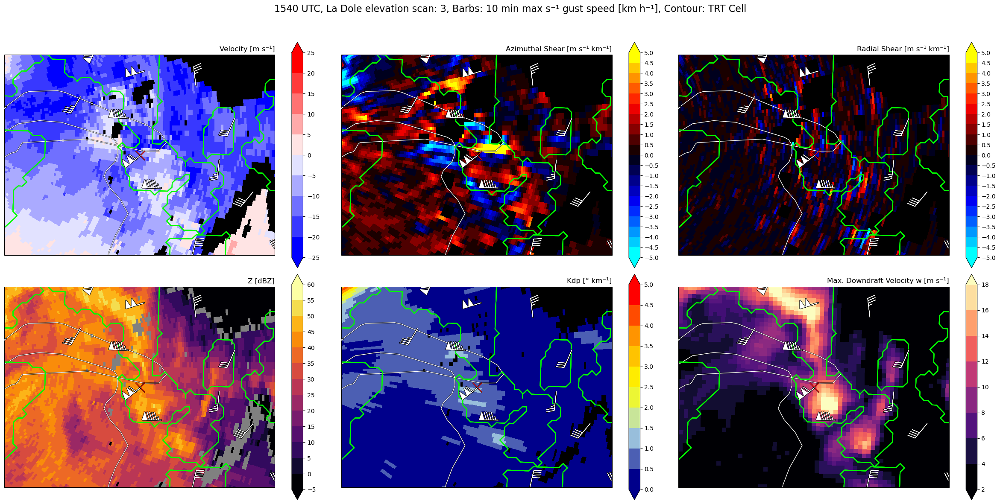

In [17]:
# Bouveret 15:40
downburst_location = 'Bouveret'
downburst_x = 555264
downburst_y = 138175
downburst_z = 374

llsd_vel = llsd(vel=dv_velocity, az_min=3, az_max=90, w_k=2, r_k=2, resolution=0.5)
az_shear_levels = np.arange(-5,5.5,0.5)
div_shear_levels = np.arange(-5,5.5,0.5)

projection = ccrs.epsg(3035)
# Create figure with three subplots (Reflectivity, Velocity, and Dealiased Velocity)
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(24, 12), subplot_kw={'projection': projection})

# Set background to black for all subplots
for row in axs:  # axs is a 2D array, so iterate through rows
    for ax in row:  # Iterate through each subplot in the row
        fig.patch.set_facecolor('white')  # Set figure background
        ax.set_facecolor('white')  # Set axis background

edgecolor = 'black'

wgs84 = converter.LV03toWGS84(downburst_x, downburst_y, downburst_z)
downburst_lat = wgs84[0]
downburst_lon = wgs84[1]

# Plot Dealiased Velocity
cmap_velocity.set_bad(color='black')
p2 = axs[0,0].pcolormesh(lons, lats, dv_velocity, cmap=cmap_velocity, norm=velocity_norm, transform=ccrs.PlateCarree())
cbar2 = plt.colorbar(p2, ax=axs[0,0], cmap=cmap_velocity, extend='both', boundaries=velocity_levels, ticks=velocity_levels)
cbar2.outline.set_edgecolor(edgecolor)
cbar2.ax.yaxis.set_tick_params(color=edgecolor)
plt.setp(plt.getp(cbar2.ax.axes, 'yticklabels'), color=edgecolor)
axs[0,0].set_title('Velocity [m s⁻¹]', color=edgecolor, loc='right')

# Plot Azmiuthal shear
#cmap_specw.set_bad(color='black')
cmap_az_shear.set_bad(color='black')
p9 = axs[0,1].pcolormesh(lons, lats, llsd_vel[0], cmap=cmap_az_shear, norm=az_shear_norm, 
                         transform=ccrs.PlateCarree())
cbar9 = plt.colorbar(p9, ax=axs[0,1], cmap=cmap_az_shear, extend='both', boundaries=az_shear_levels, ticks=az_shear_levels
                     )
cbar9.outline.set_edgecolor(edgecolor)
cbar9.ax.yaxis.set_tick_params(color=edgecolor)
plt.setp(plt.getp(cbar9.ax.axes, 'yticklabels'), color=edgecolor)
axs[0,1].set_title('Azimuthal Shear [m s⁻¹ km⁻¹]', color=edgecolor, loc='right')

# Plot Radial shear
#cmap_specw.set_bad(color='black')
cmap_div_shear.set_bad(color='black')
p9 = axs[0,2].pcolormesh(lons, lats, llsd_vel[1], cmap=cmap_div_shear, norm=div_shear_norm, 
                         transform=ccrs.PlateCarree())
cbar9 = plt.colorbar(p9, ax=axs[0,2], cmap=cmap_div_shear, extend='both', boundaries=div_shear_levels, ticks=div_shear_levels
                     )
cbar9.outline.set_edgecolor(edgecolor)
cbar9.ax.yaxis.set_tick_params(color=edgecolor)
plt.setp(plt.getp(cbar9.ax.axes, 'yticklabels'), color=edgecolor)
axs[0,2].set_title('Radial Shear [m s⁻¹ km⁻¹]', color=edgecolor, loc='right')

# Plot Reflectivity 
cmap_reflectivity.set_bad(color='grey')
p1 = axs[1,0].pcolormesh(lons, lats, reflectivity, cmap=cmap_reflectivity, norm=reflectivity_norm, transform=ccrs.PlateCarree())
# Add a colorbar
cbar1 = plt.colorbar(p1, ax=axs[1,0], extend='both', cmap=cmap_reflectivity, norm=reflectivity_norm, boundaries=reflectivity_levels, ticks=reflectivity_levels
                     )
cbar1.outline.set_edgecolor(edgecolor)
cbar1.ax.yaxis.set_tick_params(color=edgecolor)
plt.setp(plt.getp(cbar1.ax.axes, 'yticklabels'), color=edgecolor)
axs[1,0].set_title('Z [dBZ]', color=edgecolor, loc='right')


# Plot Kdp
cmap_Kdp.set_bad(color='black')
p7 = axs[1,1].pcolormesh(lons, lats, Kdp, norm=Kdp_norm,
                   cmap=cmap_Kdp, transform=ccrs.PlateCarree())
# Add a colorbar
cbar7 = plt.colorbar(p7, ax=axs[1,1], extend='both', cmap=cmap_Kdp, boundaries=Kdp_levels, ticks=Kdp_levels
                     )
cbar7.outline.set_edgecolor(edgecolor)
cbar7.ax.yaxis.set_tick_params(color=edgecolor)
plt.setp(plt.getp(cbar7.ax.axes, 'yticklabels'), color=edgecolor)
axs[1,1].set_title('Kdp [° km⁻¹]', color=edgecolor, loc='right')


# Plot wge composite
# Set a mask
wge = np.ma.masked_less_equal(wge, 0)
cmap_wge.set_bad(color='black')
p12 = axs[1,2].pcolormesh(clons, clats, wge, vmax=18, 
                   cmap=cmap_wge, transform=projection)
# Add a colorbar
cbar12 = plt.colorbar(p12, ax=axs[1,2], extend='both', cmap=cmap_wge, norm=wge_norm, boundaries=wge_levels, ticks=wge_levels
                     )
cbar12.outline.set_edgecolor(edgecolor)
cbar12.ax.yaxis.set_tick_params(color=edgecolor)
plt.setp(plt.getp(cbar12.ax.axes, 'yticklabels'), color=edgecolor)
axs[1,2].set_title('Max. Downdraft Velocity w [m s⁻¹]', color=edgecolor, loc='right')


# Select a specific subplot for the wind barbs (e.g., the first subplot)
#ax = axs[0:3, 0:2]  # Adjust the index based on your layout preference


# (Plotting of wind barbs and other features remains the same)
# Add Radar, Geneva, and Lausanne locations to all plots
for row in axs:
    for ax in row:
        # Radar location or points of interest
        ax.plot(downburst_lon, downburst_lat, marker='x', color='red', markersize=16, 
            transform=ccrs.PlateCarree(), 
            path_effects=[path_effects.withStroke(linewidth=2, foreground='black')])
    
        # Set the spatial extent of the plot
        ax.set_extent([downburst_lon - 0.4, downburst_lon + 0.4, downburst_lat -0.2, downburst_lat + 0.2], 
                  crs=ccrs.PlateCarree())
    
        # Add geographic features
        ax.add_feature(cfeature.BORDERS, edgecolor='black', linestyle='-', alpha=0.8, linewidth=2)
        ax.add_feature(cfeature.COASTLINE, edgecolor='black', alpha=0.8, linewidth=2)
        ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='none', alpha=0.8, linewidth=2)
        ax.add_feature(cfeature.BORDERS, edgecolor='white', linestyle='-', alpha=1)
        ax.add_feature(cfeature.COASTLINE, edgecolor='white', alpha=1)
        ax.add_feature(cfeature.LAKES, edgecolor='white', facecolor='none', alpha=1)

from matplotlib.colors import to_rgba
lime_green_with_alpha = to_rgba("lime", alpha=0.5)

# Add TRT cells contour to every subplot
for row in axs:
    for ax in row:
        # Ensure cells, lons, and lats are aligned and properly scaled
        ax.contour(lon_trtc, lat_trtc, cells, levels=np.arange(0, 11), colors=[lime_green_with_alpha], alpha=0.5, transform=ccrs.PlateCarree())

# Iterate over rows in the filtered dataframe
for _, row in filtered_df.iterrows():
    try:
        # Extract values directly without wrapping them in float or np.array
        longitude = row['LONGITUDE']
        latitude = row['LATITUDE']
        speed = row['101']  # Wind speed
        direction = row['197']  # Wind direction

        # Ensure the values are 1-dimensional arrays
        longitude = np.array([longitude])  # Wrap as 1D array
        latitude = np.array([latitude])    # Wrap as 1D array
        speed = np.array([speed])
        direction = np.array([direction])
        
        # Convert to wind components
        u = -speed * np.sin(np.radians(direction)) * 3.6
        v = -speed * np.cos(np.radians(direction)) * 3.6
        
        for row in axs:
            for ax in row:
        # Add a single wind barb
                ax.barbs(longitude, latitude, u, v, transform=ccrs.PlateCarree(), color='black', length=8, linewidth=2.5, zorder=10)
                ax.barbs(longitude, latitude, u, v, transform=ccrs.PlateCarree(), color='white', length=8, linewidth=1, zorder=11)
    except ValueError as e:
        print(f"Skipping row due to error: {e}")


# Set main title
plt.suptitle(valid_time3 + ' UTC, ' + radar_name + ' elevation scan: ' + elevation_scan + ', Barbs: 10 min max s⁻¹ gust speed [km h⁻¹], Contour: TRT Cell', color=edgecolor, fontsize=16, x=0.5)
# Adjust layout and display the plot
plt.tight_layout(rect=[0, 0, 1, 0.95])

#plt.savefig("/users/fackerma/newproject1/figures/first_case/TRT2/TRT_" + downburst_location + "_" + radar_station + "_" + valid_time3 + "_" + elevation_scan + "_2.png", dpi=300)

## RHI

[46.54620053012867, 7.017760746224894, 2024.97379732]
Azimuth angle to downburst occurrence: 78.87 degrees
Looking for files with time: 1555
Files found for time 1555: ['/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615550U.001', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615550U.002', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615550U.003', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615550U.004', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615550U.005', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615550U.006', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615550U.007', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615550U.008', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615550U.009', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615550U.010', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615550U.011', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615550U.012', '/scratch/mch/fackerma/orde

/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pyart/aux_io/metranet_reader.py:142: UserWarning: Invalid reader name or C library not available, using python (default) instead
  warn('Invalid reader name or C library not available,' +
/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pyart/aux_io/metranet_reader.py:925: UserWarning: Moment SNR not in file
  warn('Moment ' + momnames[i] + ' not in file')
/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pyart/correct/region_dealias.py:389: RuntimeWarning: overflow encountered in cast
  labels.astype('int32'), data.astype('float32'),
/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pyart/correct/region_dealias.py:389: RuntimeWarning: invalid value encountered in cast
  labels.astype('int32'), data.astype('float32'),
/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pyart/correct/region_dealias.py:227: RuntimeWa

Looking for files with time: 1600
Files found for time 1600: ['/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616000U.001', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616000U.002', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616000U.003', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616000U.004', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616000U.005', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616000U.006', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616000U.007', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616000U.008', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616000U.009', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616000U.010', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616000U.011', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616000U.012', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616000U.013', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616000U.014', 

/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pyart/core/transforms.py:221: UserWarning: dot_product is larger than one.
  warnings.warn("dot_product is larger than one.")


Looking for files with time: 1610
Files found for time 1610: ['/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616100U.001', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616100U.002', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616100U.003', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616100U.004', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616100U.005', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616100U.006', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616100U.007', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616100U.008', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616100U.009', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616100U.010', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616100U.011', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616100U.012', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616100U.013', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616100U.014', 

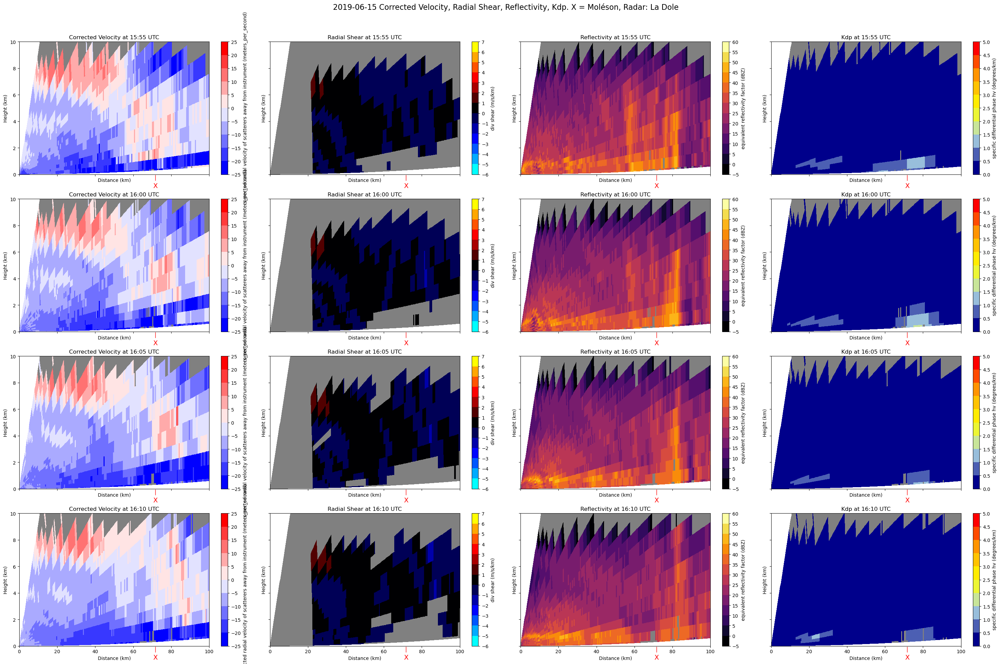

In [ ]:
# Moléson 1610
downburst_location = 'Moléson'
downburst_x = 567719
downburst_y = 155077
downburst_z = 1974

# Define time intervals: x minutes before, and the exact time
time_deltas = [-15, -10, -5, 0]  # minutes

wgs84 = converter.LV03toWGS84(downburst_x, downburst_y, downburst_z)
print(wgs84)
downburst_lat = wgs84[0]
downburst_lon = wgs84[1]

radar_coords = (radar_lat, radar_lon)
downburst_coords = (downburst_lat, downburst_lon)
downburst_distance = geopy.distance.geodesic(radar_coords, downburst_coords).km

# Calculate azimuth
azimuth_to_downburst = calculate_azimuth(radar_lat, radar_lon, downburst_lat, downburst_lon)
print(f"Azimuth angle to downburst occurrence: {azimuth_to_downburst:.2f} degrees")

# Convert valid_time3 to a datetime object
base_time = datetime.strptime(valid_time3, "%H%M")

div_shear_levels = np.arange(-5,5.5,0.5)
div_shear_norm = BoundaryNorm(boundaries=div_shear_levels, ncolors=256, clip=True)

# Set up the figure with 4 rows and 2 columns
fig, axes = plt.subplots(len(time_deltas), 4, sharex=True, sharey=True, figsize=(30, 20))
fig.suptitle("2019-06-15 Corrected Velocity, Radial Shear, Reflectivity, Kdp. X = " + downburst_location + ", Radar: " + radar_name, fontsize=16)

for row, delta in enumerate(time_deltas):
    # Calculate the time for this row
    current_time = (base_time + timedelta(minutes=delta)).strftime("%H%M")
    print(f"Looking for files with time: {current_time}")
    
    # Check what files are available in the directory
    files_rhi = sorted(glob.glob(f"{path}/MLD/ML{radar_station}19166{current_time}*"))
    print(f"Files found for time {current_time}: {files_rhi}")

    # Proceed only if files are found
    if not files_rhi:
        print(f"No files found for time {current_time}. Skipping.")
        continue

    # Merge radar data for the current time
    for i, f in enumerate(files_rhi):
        radar = pyart.aux_io.read_metranet(f)
        if i == 0:
            radar_merged = radar
        else:
            radar_merged = pyart.util.join_radar(radar_merged, radar)

    # Perform dealiasing
    corr_vel = pyart.correct.dealias_region_based(radar_merged)
    kdp = pyart.retrieve.kdp_vulpiani(radar_merged, psidp_field='uncorrected_differential_phase', band='C', parallel=True)

    #Add 'Kdp' field if it doesn't already exist
    # Add 'kdp' field if it doesn't already exist, wrapped in a dictionary with the 'data' key
    if 'kdp' not in radar_merged.fields:
        radar_merged.add_field('kdp', kdp[0])
    else:
        print(f"Field 'kdp' already exists for time {current_time}. Skipping addition.")
    
    # Add 'corrected_velocity' field if it doesn't already exist
    if 'corrected_velocity' not in radar_merged.fields:
        radar_merged.add_field('corrected_velocity', corr_vel)
    else:
        print(f"Field 'corrected_velocity' already exists for time {current_time}. Skipping addition.")


    div_shear = llsd(vel=radar_merged.fields['corrected_velocity']['data'], az_min=3, az_max=90, w_k=10, r_k=10, resolution=0.5)

    # Assuming div_shear is a NumPy array or similar
    div_shear_dict = {
        'data': div_shear[1],  # This should be the numerical array
        'units': 'm/s/km',  # You can adjust the units based on the actual meaning of div_shear
        'long_name': 'Divergence Shear',  # Add a descriptive name for the field
        'standard_name': 'div_shear',  # You can add any standard name
    }

    # Now, add the field to the radar object
    radar_merged.add_field('div_shear', div_shear_dict)


    # Create a pseudo RHI cross-section at azimuth 270 degrees
    pseudorhi = pyart.util.cross_section_ppi(radar_merged, [azimuth_to_downburst])
    display = pyart.graph.RadarDisplay(pseudorhi)

    # Define axes for corrected velocity (left) and reflectivity (right)
    ax_vel = axes[row, 0]
    ax_ref = axes[row, 2]
    ax_kdp = axes[row, 3]
    ax_div_shear = axes[row, 1] 

    # Plot 'corrected_velocity' with specified color limits
    cmap_velocity.set_bad(color='grey')
    display.plot_rhi('corrected_velocity', ax=ax_vel, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
    ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")
    # Customize the colorbar for velocity
    #cbar = plt.colorbar(display.plots[0], ax=ax_vel)
    #cbar.set_label('[m s⁻¹]', fontsize=12)

    # Plot 'reflectivity'
    cmap_czc.set_bad(color='grey')
    display.plot_rhi('reflectivity', ax=ax_ref, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
    ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC")
    # Customize the colorbar for reflectivity
    #cbar = plt.colorbar(display.plots[1], ax=ax_ref)
    #cbar.set_label('[dBZ]', fontsize=12)

    # Plot 'Kdp'
    cmap_Kdp.set_bad(color='grey')
    display.plot_rhi('kdp', ax=ax_kdp, ticks=Kdp_levels, norm=Kdp_norm, cmap=cmap_Kdp)
    ax_kdp.set_title(f"Kdp at {current_time[:2]}:{current_time[2:]} UTC")
    # Customize the colorbar for Kdp
    #cbar = plt.colorbar(display.plots[2], ax=ax_kdp)
    #cbar.set_label('[° km⁻¹]', fontsize=12)

    # Plot 'div_shear'
    cmap_div_shear.set_bad(color='grey')
    display.plot_rhi('div_shear', ax=ax_div_shear, ticks=div_shear_levels, norm=div_shear_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_div_shear)
    ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")
    # Customize the colorbar for divergence shear
    #cbar = plt.colorbar(display.plots[3], ax=ax_div_shear)
    #cbar.set_label('[m s⁻¹ km⁻¹]', fontsize=12)

    # Mark the downburst distance on the x-axis with an 'X'
    for axis in [ax_vel, ax_ref, ax_kdp, ax_div_shear]:
        axis.annotate('X', xy=(downburst_distance, 0), xytext=(downburst_distance, -1),
                      textcoords='data', ha='center', color='red', fontsize=14,
                      arrowprops=dict(arrowstyle='-', color='red'))

    # Set common axis labels and limits
    ax_vel.set_ylim([0, 10])   # Adjust height range as needed
    ax_vel.set_xlim([0, 100])  # Adjust distance range as needed
    for axis in [ax_vel, ax_ref, ax_kdp, ax_div_shear
                 ]:
        axis.set_xlabel('Distance (km)')
        axis.set_ylabel('Height (km)')


plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout for the title
#plt.savefig("/users/fackerma/newproject1/figures/first_case/" + radar_station + "RHI_" + valid_time3 + "_" + downburst_location + "_2.png", dpi=300)


[46.54620053012867, 7.017760746224894, 2024.97379732]
Azimuth angle to downburst occurrence: 78.87 degrees
Looking for files with time: 1555
Files found for time 1555: ['/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615550U.001', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615550U.002', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615550U.003', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615550U.004', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615550U.005', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615550U.006', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615550U.007', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615550U.008', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615550U.009', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615550U.010', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615550U.011', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615550U.012', '/scratch/mch/fackerma/orde

/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pyart/aux_io/metranet_reader.py:142: UserWarning: Invalid reader name or C library not available, using python (default) instead
  warn('Invalid reader name or C library not available,' +
/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pyart/aux_io/metranet_reader.py:925: UserWarning: Moment SNR not in file
  warn('Moment ' + momnames[i] + ' not in file')
/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pyart/correct/region_dealias.py:389: RuntimeWarning: overflow encountered in cast
  labels.astype('int32'), data.astype('float32'),
/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pyart/correct/region_dealias.py:389: RuntimeWarning: invalid value encountered in cast
  labels.astype('int32'), data.astype('float32'),
/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pyart/correct/region_dealias.py:227: RuntimeWa

Looking for files with time: 1600
Files found for time 1600: ['/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616000U.001', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616000U.002', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616000U.003', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616000U.004', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616000U.005', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616000U.006', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616000U.007', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616000U.008', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616000U.009', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616000U.010', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616000U.011', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616000U.012', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616000U.013', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616000U.014', 

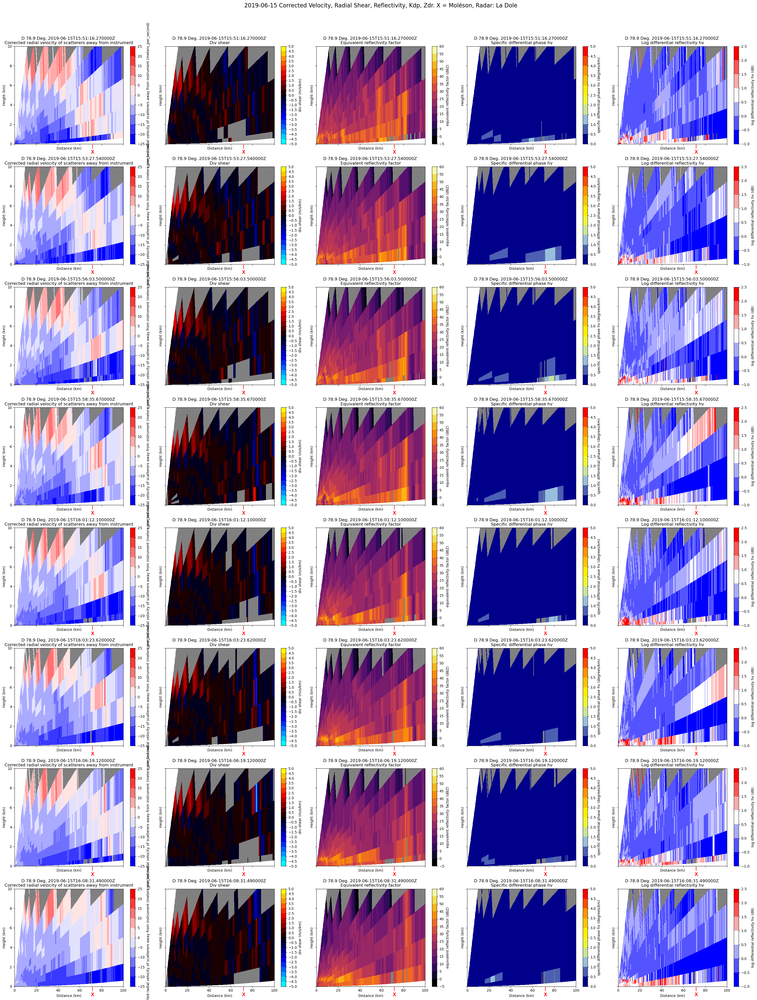

In [9]:
# Moléson 1610
downburst_location = 'Moléson'
downburst_x = 567719
downburst_y = 155077
downburst_z = 1974

if radar_station == 'D':
    rhi_close = 0
    rhi_distance = 100
else:
    rhi_distance = 150
    rhi_close = 0

# Define time intervals: x minutes before, and the exact time
time_deltas = [-15, -10, -5, 0]  # minutes
first_scan = ['001', '003', '005', '007', '009', '011', '013', '015', '017', '019']
second_scan = ['002', '004', '006', '008', '010', '012', '014', '016', '018', '020']

wgs84 = converter.LV03toWGS84(downburst_x, downburst_y, downburst_z)
print(wgs84)
downburst_lat = wgs84[0]
downburst_lon = wgs84[1]

radar_coords = (radar_lat, radar_lon)
downburst_coords = (downburst_lat, downburst_lon)
downburst_distance = geopy.distance.geodesic(radar_coords, downburst_coords).km

# Calculate azimuth
azimuth_to_downburst = calculate_azimuth(radar_lat, radar_lon, downburst_lat, downburst_lon)
print(f"Azimuth angle to downburst occurrence: {azimuth_to_downburst:.2f} degrees")

# Convert valid_time3 to a datetime object
base_time = datetime.strptime(valid_time3, "%H%M")

div_shear_levels = np.arange(-5,5.5,0.5)
div_shear_norm = BoundaryNorm(boundaries=div_shear_levels, ncolors=256, clip=True)

# Set up the figure with 4 rows and 4 columns
fig, axes = plt.subplots(8, 5, sharex=True, sharey=True, figsize=(30, 40))
fig.suptitle("2019-06-15 Corrected Velocity, Radial Shear, Reflectivity, Kdp, Zdr. X = " + downburst_location + ", Radar: " + radar_name, fontsize=16)

for row, delta in enumerate(time_deltas):
    # Calculate the time for this row
    current_time = (base_time + timedelta(minutes=delta)).strftime("%H%M")
    print(f"Looking for files with time: {current_time}")
    
    # Check what files are available in the directory
    files_rhi = sorted(glob.glob(f"{path}/MLD/ML{radar_station}19166{current_time}*"))
    print(f"Files found for time {current_time}: {files_rhi}")

    # Separate the files into two lists
    file_rhi_first_scan = []
    file_rhi_second_scan = []

    for file in files_rhi:
        # Extract the elevation scan number (last two digits before the file extension)
        elevation_scan = file.split('.')[-1]
    
        if elevation_scan in first_scan:
            file_rhi_first_scan.append(file)
        elif elevation_scan in second_scan:
            file_rhi_second_scan.append(file)

    # Merge radar data for the current time
    for i, f in enumerate(files_rhi):
        radar = pyart.aux_io.read_metranet(f)
        if i == 0:
            radar_merged = radar
        else:
            radar_merged = pyart.util.join_radar(radar_merged, radar)
    
    # Merge radar data for first scan
    radar_merged_first_scan = None
    for i, f in enumerate(file_rhi_first_scan):
        radar = pyart.aux_io.read_metranet(f)
        if i == 0:
            radar_merged_first_scan = radar
        else:
            radar_merged_first_scan = pyart.util.join_radar(radar_merged_first_scan, radar)

    # Merge radar data for second scan  
    radar_merged_second_scan = None
    for i, f in enumerate(file_rhi_second_scan):
        radar = pyart.aux_io.read_metranet(f)
        if i == 0:
            radar_merged_second_scan = radar
        else:
            radar_merged_second_scan = pyart.util.join_radar(radar_merged_second_scan, radar)

    # Perform dealiasing
    #corr_vel = pyart.correct.dealias_region_based(radar_merged)
    corr_vel_first_scan = pyart.correct.dealias_region_based(radar_merged_first_scan)
    corr_vel_second_scan = pyart.correct.dealias_region_based(radar_merged_second_scan)

    # Add 'corrected_velocity' field if it doesn't already exist
    #if 'corrected_velocity' not in radar_merged.fields:
        #radar_merged.add_field('corrected_velocity', corr_vel)
    #else:
        #print(f"Field 'corrected_velocity' already exists for time {current_time}. Skipping addition.")

    # Add 'corrected_velocity' field if it doesn't already exist
    if 'corrected_velocity' not in radar_merged_first_scan.fields:
        radar_merged_first_scan.add_field('corrected_velocity', corr_vel_first_scan)
    else:
        print(f"Field 'corrected_velocity_first_scan' already exists for time {current_time}. Skipping addition.")

    # Add 'corrected_velocity' field if it doesn't already exist
    if 'corrected_velocity' not in radar_merged_second_scan.fields:
        radar_merged_second_scan.add_field('corrected_velocity', corr_vel_second_scan)
    else:
        print(f"Field 'corrected_velocity_second_scan' already exists for time {current_time}. Skipping addition.")

    #div_shear = llsd(vel=radar_merged.fields['corrected_velocity']['data'], az_min=3, az_max=90, w_k=1.5, r_k=2, resolution=0.5)
    div_shear_first_scan = llsd(vel=radar_merged_first_scan.fields['corrected_velocity']['data'], az_min=3, az_max=10, w_k=5, r_k=5, resolution=0.5)
    div_shear_second_scan = llsd(vel=radar_merged_second_scan.fields['corrected_velocity']['data'], az_min=3, az_max=10, w_k=5, r_k=5, resolution=0.5)

    # Assuming div_shear is a NumPy array or similar
    div_shear_dict_first_scan = {
        'data': div_shear_first_scan[1],  # This should be the numerical array
        'units': 'm/s/km',  # You can adjust the units based on the actual meaning of div_shear
        'long_name': 'Divergence Shear',  # Add a descriptive name for the field
        'standard_name': 'div_shear',  # You can add any standard name
    }
    radar_merged_first_scan.add_field('div_shear', div_shear_dict_first_scan)
    # Assuming div_shear is a NumPy array or similar
    div_shear_dict_second_scan = {
        'data': div_shear_second_scan[1],  # This should be the numerical array
        'units': 'm/s/km',  # You can adjust the units based on the actual meaning of div_shear
        'long_name': 'Divergence Shear',  # Add a descriptive name for the field
        'standard_name': 'div_shear',  # You can add any standard name
    }
    radar_merged_second_scan.add_field('div_shear', div_shear_dict_second_scan)
    # Now, add the field to the radar object

    kdp = pyart.retrieve.kdp_vulpiani(radar_merged_first_scan, psidp_field='uncorrected_differential_phase', band='C', parallel=True)
    radar_merged_first_scan.add_field('kdp', kdp[0])

    kdp = pyart.retrieve.kdp_vulpiani(radar_merged_second_scan, psidp_field='uncorrected_differential_phase', band='C', parallel=True)
    radar_merged_second_scan.add_field('kdp', kdp[0])
 
    
    # Create a pseudo RHI cross-section at azimuth 270 degrees
    pseudorhi = pyart.util.cross_section_ppi(radar_merged, [azimuth_to_downburst])
    display = pyart.graph.RadarDisplay(pseudorhi)
    # Create a pseudo RHI cross-section at azimuth 270 degrees
    pseudorhi_first_scan = pyart.util.cross_section_ppi(radar_merged_first_scan, [azimuth_to_downburst])
    display_first_scan = pyart.graph.RadarDisplay(pseudorhi_first_scan)
    # Create a pseudo RHI cross-section at azimuth 270 degrees
    pseudorhi_second_scan = pyart.util.cross_section_ppi(radar_merged_second_scan, [azimuth_to_downburst])
    display_second_scan = pyart.graph.RadarDisplay(pseudorhi_second_scan)


    
        
    if delta == -15:
        ax_vel_first_scan = axes[0, 0]
        ax_ref_first_scan = axes[0, 2]
        ax_div_shear_first_scan = axes[0, 1]
        ax_kdp_first_scan = axes[0,3]
        ax_zdr_first_scan = axes[0,4]
        ax_vel_second_scan = axes[1, 0]
        ax_ref_second_scan = axes[1, 2]
        ax_div_shear_second_scan = axes[1, 1]
        ax_kdp_second_scan = axes[1,3]
        ax_zdr_second_scan = axes[1,4]

        # Plot 'corrected_velocity' with specified color limits
        cmap_velocity.set_bad(color='grey')
        display_first_scan.plot_rhi('corrected_velocity', ax=ax_vel_first_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_velocity.set_bad(color='grey')
        display_second_scan.plot_rhi('corrected_velocity', ax=ax_vel_second_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")
 
        cmap_div_shear.set_bad(color='grey')
        display_first_scan.plot_rhi('div_shear', ax=ax_div_shear_first_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_div_shear.set_bad(color='grey')
        display_second_scan.plot_rhi('div_shear', ax=ax_div_shear_second_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_first_scan.plot_rhi('reflectivity', ax=ax_ref_first_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC")  

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_second_scan.plot_rhi('reflectivity', ax=ax_ref_second_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC")

        # Plot KDP
        cmap_Kdp.set_bad(color='grey')
        display_first_scan.plot_rhi('kdp', ax=ax_kdp_first_scan, ticks=Kdp_levels, norm=Kdp_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_Kdp)
        
        # Plot KDP
        cmap_Kdp.set_bad(color='grey')
        display_second_scan.plot_rhi('kdp', ax=ax_kdp_second_scan, ticks=Kdp_levels, norm=Kdp_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_Kdp)
        
        # Plot KDP
        cmap_diff_reflectivity.set_bad(color='grey')
        display_first_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_first_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_diff_reflectivity)
        
        cmap_diff_reflectivity.set_bad(color='grey')
        display_second_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_second_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_diff_reflectivity)
        
    if delta == -10:
        ax_vel_first_scan = axes[2, 0]
        ax_ref_first_scan = axes[2, 2]
        ax_div_shear_first_scan = axes[2, 1]
        ax_kdp_first_scan = axes[2,3]
        ax_zdr_first_scan = axes[2,4]
        ax_vel_second_scan = axes[3, 0]
        ax_ref_second_scan = axes[3, 2]
        ax_div_shear_second_scan = axes[3, 1]
        ax_kdp_second_scan = axes[3,3]
        ax_zdr_second_scan = axes[3,4]

        # Plot 'corrected_velocity' with specified color limits
        cmap_velocity.set_bad(color='grey')
        display_first_scan.plot_rhi('corrected_velocity', ax=ax_vel_first_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_velocity.set_bad(color='grey')
        display_second_scan.plot_rhi('corrected_velocity', ax=ax_vel_second_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")
 
        cmap_div_shear.set_bad(color='grey')
        display_first_scan.plot_rhi('div_shear', ax=ax_div_shear_first_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_div_shear.set_bad(color='grey')
        display_second_scan.plot_rhi('div_shear', ax=ax_div_shear_second_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_first_scan.plot_rhi('reflectivity', ax=ax_ref_first_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC")  

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_second_scan.plot_rhi('reflectivity', ax=ax_ref_second_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC")

        # Plot KDP
        cmap_Kdp.set_bad(color='grey')
        display_first_scan.plot_rhi('kdp', ax=ax_kdp_first_scan, ticks=Kdp_levels, norm=Kdp_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_Kdp)
        
        # Plot KDP
        cmap_Kdp.set_bad(color='grey')
        display_second_scan.plot_rhi('kdp', ax=ax_kdp_second_scan, ticks=Kdp_levels, norm=Kdp_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_Kdp)
        
        # Plot Zdr
        cmap_diff_reflectivity.set_bad(color='grey')
        display_first_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_first_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_diff_reflectivity)
        
        cmap_diff_reflectivity.set_bad(color='grey')
        display_second_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_second_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_diff_reflectivity)
        
    if delta == -5:
        ax_vel_first_scan = axes[4, 0]
        ax_ref_first_scan = axes[4, 2]
        ax_div_shear_first_scan = axes[4, 1]
        ax_kdp_first_scan = axes[4,3]
        ax_zdr_first_scan = axes[4,4]
        ax_vel_second_scan = axes[5, 0]
        ax_ref_second_scan = axes[5, 2]
        ax_div_shear_second_scan = axes[5, 1]
        ax_kdp_second_scan = axes[5,3]
        ax_zdr_second_scan = axes[5,4]

        # Plot 'corrected_velocity' with specified color limits
        cmap_velocity.set_bad(color='grey')
        display_first_scan.plot_rhi('corrected_velocity', ax=ax_vel_first_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_velocity.set_bad(color='grey')
        display_second_scan.plot_rhi('corrected_velocity', ax=ax_vel_second_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")
 
        cmap_div_shear.set_bad(color='grey')
        display_first_scan.plot_rhi('div_shear', ax=ax_div_shear_first_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_div_shear.set_bad(color='grey')
        display_second_scan.plot_rhi('div_shear', ax=ax_div_shear_second_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_first_scan.plot_rhi('reflectivity', ax=ax_ref_first_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC")  

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_second_scan.plot_rhi('reflectivity', ax=ax_ref_second_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC") 

        # Plot KDP
        cmap_Kdp.set_bad(color='grey')
        display_first_scan.plot_rhi('kdp', ax=ax_kdp_first_scan, ticks=Kdp_levels, norm=Kdp_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_Kdp)
        
        # Plot KDP
        cmap_Kdp.set_bad(color='grey')
        display_second_scan.plot_rhi('kdp', ax=ax_kdp_second_scan, ticks=Kdp_levels, norm=Kdp_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_Kdp)
        
        # Plot Zdr
        cmap_diff_reflectivity.set_bad(color='grey')
        display_first_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_first_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_diff_reflectivity)
        
        cmap_diff_reflectivity.set_bad(color='grey')
        display_second_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_second_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_diff_reflectivity)
        
    if delta == 0:
        ax_vel_first_scan = axes[6, 0]
        ax_ref_first_scan = axes[6, 2]
        ax_div_shear_first_scan = axes[6, 1]
        ax_kdp_first_scan = axes[6,3]
        ax_zdr_first_scan = axes[6,4]
        ax_vel_second_scan = axes[7, 0]
        ax_ref_second_scan = axes[7, 2]
        ax_div_shear_second_scan = axes[7, 1]
        ax_kdp_second_scan = axes[7,3]
        ax_zdr_second_scan = axes[7,4]

        # Plot 'corrected_velocity' with specified color limits
        cmap_velocity.set_bad(color='grey')
        display_first_scan.plot_rhi('corrected_velocity', ax=ax_vel_first_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_velocity.set_bad(color='grey')
        display_second_scan.plot_rhi('corrected_velocity', ax=ax_vel_second_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")
 
        cmap_div_shear.set_bad(color='grey')
        display_first_scan.plot_rhi('div_shear', ax=ax_div_shear_first_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_div_shear.set_bad(color='grey')
        display_second_scan.plot_rhi('div_shear', ax=ax_div_shear_second_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_first_scan.plot_rhi('reflectivity', ax=ax_ref_first_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC")  

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_second_scan.plot_rhi('reflectivity', ax=ax_ref_second_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC")

        # Plot KDP
        cmap_Kdp.set_bad(color='grey')
        display_first_scan.plot_rhi('kdp', ax=ax_kdp_first_scan, ticks=Kdp_levels, norm=Kdp_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_Kdp)
        
        # Plot KDP
        cmap_Kdp.set_bad(color='grey')
        display_second_scan.plot_rhi('kdp', ax=ax_kdp_second_scan, ticks=Kdp_levels, norm=Kdp_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_Kdp)
        
        # Plot Zdr
        cmap_diff_reflectivity.set_bad(color='grey')
        display_first_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_first_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_diff_reflectivity)
        
        cmap_diff_reflectivity.set_bad(color='grey')
        display_second_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_second_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_diff_reflectivity)
    
# Loop over rows
for row in range(8):  # Adjust depending on the number of rows in your layout
    for col in range(5):  # Adjust depending on the number of columns
        ax_vel = axes[row, 0]  # Velocity plot
        ax_ref = axes[row, 2]  # Reflectivity plot
        ax_div_shear = axes[row, 1]  # Divergence/Shear plot
        ax_kdp = axes[row, 3]
        ax_zdr = axes[row, 4]

        # Annotate 'X' on the axes where needed
        for axis in [ax_vel, ax_ref, ax_div_shear, ax_kdp, ax_zdr]:
            axis.annotate('X', xy=(downburst_distance, 0), xytext=(downburst_distance, -1),
                          textcoords='data', ha='center', color='red', fontsize=14,
                          arrowprops=dict(arrowstyle='-', color='red'))

        # Set axis limits for each axis
        ax_vel.set_ylim([0, 10])   # Adjust height range as needed
        ax_vel.set_xlim([rhi_close, rhi_distance])  # Adjust distance range as needed

        # Set labels for all axes
        ax_vel.set_xlabel('Distance (km)')
        ax_vel.set_ylabel('Height (km)')
        
        ax_ref.set_xlabel('Distance (km)')
        ax_ref.set_ylabel('Height (km)')

        ax_div_shear.set_xlabel('Distance (km)')
        ax_div_shear.set_ylabel('Height (km)')

        ax_kdp.set_xlabel('Distance (km)')
        ax_kdp.set_ylabel('Height (km)')

        ax_zdr.set_xlabel('Distance (km)')
        ax_zdr.set_ylabel('Height (km)')



plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout for the title
plt.savefig("/users/fackerma/newproject1/figures/first_case/RHI3/" + radar_station + "RHIhightemp_" + valid_time3 + "_" + downburst_location + "_5.png", dpi=300)

[46.393444164005814, 6.857012004756828, 425.51339160000003]
Azimuth angle to downburst occurrence: 93.26 degrees
Looking for files with time: 1525
Files found for time 1525: ['/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615250U.001', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615250U.002', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615250U.003', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615250U.004', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615250U.005', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615250U.006', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615250U.007', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615250U.008', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615250U.009', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615250U.010', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615250U.011', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615250U.012', '/scratch/mch/fackerm

/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pyart/aux_io/metranet_reader.py:142: UserWarning: Invalid reader name or C library not available, using python (default) instead
  warn('Invalid reader name or C library not available,' +
/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pyart/aux_io/metranet_reader.py:925: UserWarning: Moment SNR not in file
  warn('Moment ' + momnames[i] + ' not in file')
Exception ignored in: <function _releaseLock at 0x146e4bc5bd80>
Traceback (most recent call last):
  File "/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/logging/__init__.py", line 243, in _releaseLock
    def _releaseLock():
    
KeyboardInterrupt: 


KeyboardInterrupt: 

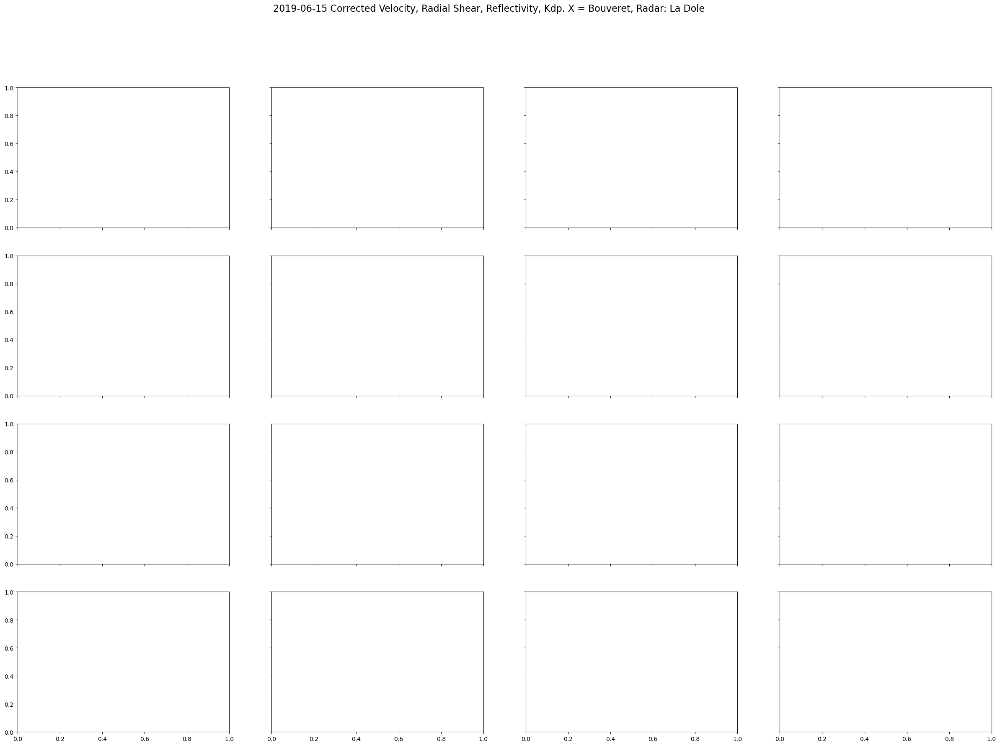

In [27]:
# Bouveret 1540
downburst_location = 'Bouveret'
downburst_x = 555264
downburst_y = 138175
downburst_z = 374

# Define time intervals: x minutes before, and the exact time
time_deltas = [-15, -10, -5, 0]  # minutes

wgs84 = converter.LV03toWGS84(downburst_x, downburst_y, downburst_z)
print(wgs84)
downburst_lat = wgs84[0]
downburst_lon = wgs84[1]

radar_coords = (radar_lat, radar_lon)
downburst_coords = (downburst_lat, downburst_lon)
downburst_distance = geopy.distance.geodesic(radar_coords, downburst_coords).km

# Calculate azimuth
azimuth_to_downburst = calculate_azimuth(radar_lat, radar_lon, downburst_lat, downburst_lon)
print(f"Azimuth angle to downburst occurrence: {azimuth_to_downburst:.2f} degrees")

# Convert valid_time3 to a datetime object
base_time = datetime.strptime(valid_time3, "%H%M")

# Set up the figure with 4 rows and 2 columns
fig, axes = plt.subplots(len(time_deltas), 4, sharex=True, sharey=True, figsize=(30, 20))
fig.suptitle("2019-06-15 Corrected Velocity, Radial Shear, Reflectivity, Kdp. X = " + downburst_location + ", Radar: " + radar_name, fontsize=16)

for row, delta in enumerate(time_deltas):
    # Calculate the time for this row
    current_time = (base_time + timedelta(minutes=delta)).strftime("%H%M")
    print(f"Looking for files with time: {current_time}")
    
    # Check what files are available in the directory
    files_rhi = sorted(glob.glob(f"{path}/MLD/ML{radar_station}19166{current_time}*"))
    print(f"Files found for time {current_time}: {files_rhi}")

    # Proceed only if files are found
    if not files_rhi:
        print(f"No files found for time {current_time}. Skipping.")
        continue

    # Merge radar data for the current time
    for i, f in enumerate(files_rhi):
        radar = pyart.aux_io.read_metranet(f)
        if i == 0:
            radar_merged = radar
        else:
            radar_merged = pyart.util.join_radar(radar_merged, radar)

    # Perform dealiasing
    corr_vel = pyart.correct.dealias_region_based(radar_merged)
    kdp = pyart.retrieve.kdp_vulpiani(radar_merged, psidp_field='uncorrected_differential_phase', band='C', parallel=True)

    #Add 'Kdp' field if it doesn't already exist
    # Add 'kdp' field if it doesn't already exist, wrapped in a dictionary with the 'data' key
    if 'kdp' not in radar_merged.fields:
        radar_merged.add_field('kdp', kdp[0])
    else:
        print(f"Field 'kdp' already exists for time {current_time}. Skipping addition.")

    # Add 'corrected_velocity' field if it doesn't already exist
    if 'corrected_velocity' not in radar_merged.fields:
        radar_merged.add_field('corrected_velocity', corr_vel)
    else:
        print(f"Field 'corrected_velocity' already exists for time {current_time}. Skipping addition.")

    div_shear = llsd(vel=radar_merged.fields['corrected_velocity']['data'], az_min=3, az_max=90, w_k=2, r_k=1.5, resolution=0.5)

    # Assuming div_shear is a NumPy array or similar
    div_shear_dict = {
        'data': div_shear[1],  # This should be the numerical array
        'units': 'm/s/km',  # You can adjust the units based on the actual meaning of div_shear
        'long_name': 'Divergence Shear',  # Add a descriptive name for the field
        'standard_name': 'div_shear',  # You can add any standard name
    }

    # Now, add the field to the radar object
    radar_merged.add_field('div_shear', div_shear_dict)

    # Create a pseudo RHI cross-section at azimuth 270 degrees
    pseudorhi = pyart.util.cross_section_ppi(radar_merged, [azimuth_to_downburst])
    display = pyart.graph.RadarDisplay(pseudorhi)

    # Define axes for corrected velocity (left) and reflectivity (right)
    ax_vel = axes[row, 0]
    ax_ref = axes[row, 2]
    ax_kdp = axes[row, 3]
    ax_div_shear = axes[row, 1] 

    # Plot 'corrected_velocity' with specified color limits
    cmap_velocity.set_bad(color='grey')
    display.plot_rhi('corrected_velocity', ax=ax_vel, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
    ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")
    # Customize the colorbar for velocity
    #cbar = plt.colorbar(display.plots[0], ax=ax_vel)
    #cbar.set_label('[m s⁻¹]', fontsize=12)

    # Plot 'reflectivity'
    cmap_czc.set_bad(color='grey')
    display.plot_rhi('reflectivity', ax=ax_ref, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
    ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC")
    # Customize the colorbar for reflectivity
    #cbar = plt.colorbar(display.plots[1], ax=ax_ref)
    #cbar.set_label('[dBZ]', fontsize=12)

    # Plot 'Kdp'
    cmap_Kdp.set_bad(color='grey')
    display.plot_rhi('kdp', ax=ax_kdp, ticks=Kdp_levels, norm=Kdp_norm, cmap=cmap_Kdp)
    ax_kdp.set_title(f"Kdp at {current_time[:2]}:{current_time[2:]} UTC")
    # Customize the colorbar for Kdp
    #cbar = plt.colorbar(display.plots[2], ax=ax_kdp)
    #cbar.set_label('[° km⁻¹]', fontsize=12)

    # Plot 'div_shear'
    cmap_div_shear.set_bad(color='grey')
    display.plot_rhi('div_shear', ax=ax_div_shear, ticks=div_shear_levels, norm=div_shear_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_div_shear)
    ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")
    # Customize the colorbar for divergence shear
    #cbar = plt.colorbar(display.plots[3], ax=ax_div_shear)
    #cbar.set_label('[m s⁻¹ km⁻¹]', fontsize=12)

    # Mark the downburst distance on the x-axis with an 'X'
    for axis in [ax_vel, ax_ref, ax_kdp, ax_div_shear]:
        axis.annotate('X', xy=(downburst_distance, 0), xytext=(downburst_distance, -1),
                      textcoords='data', ha='center', color='red', fontsize=14,
                      arrowprops=dict(arrowstyle='-', color='red'))

    # Set common axis labels and limits
    ax_vel.set_ylim([0, 10])   # Adjust height range as needed
    ax_vel.set_xlim([0, 100])  # Adjust distance range as needed
    for axis in [ax_vel, ax_ref, ax_kdp, ax_div_shear
                 ]:
        axis.set_xlabel('Distance (km)')
        axis.set_ylabel('Height (km)')

# Tighten the layout and show the plot
plt.tight_layout()
plt.show()



plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout for the title
#plt.savefig("/users/fackerma/newproject1/figures/first_case/" + radar_station + "RHI_" + valid_time3 + "_" + downburst_location + "_2.png", dpi=300)


[46.393444164005814, 6.857012004756828, 425.51339160000003]
Azimuth angle to downburst occurrence: 93.26 degrees
Looking for files with time: 1535
Files found for time 1535: ['/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615350U.001', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615350U.002', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615350U.003', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615350U.004', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615350U.005', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615350U.006', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615350U.007', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615350U.008', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615350U.009', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615350U.010', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615350U.011', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615350U.012', '/scratch/mch/fackerm

/tmp/ipykernel_33318/1617191193.py:517: RuntimeWarning: overflow encountered in multiply
  * ( u_k_r * (- np.sum(weights * d_theta * d_theta) * np.sum(weights) + np.sum(weights * d_theta) * np.sum(weights * d_theta)) \
/tmp/ipykernel_33318/1617191193.py:481: RuntimeWarning: overflow encountered in multiply
  + u_k_thet * ( - np.sum(weights * d_r * d_r) * np.sum(weights) + np.sum(weights * d_r) * np.sum(weights * d_r)) \
/tmp/ipykernel_33318/1617191193.py:518: RuntimeWarning: invalid value encountered in multiply
  + u_k_thet * (np.sum(weights * d_r * d_theta) * np.sum(weights) - np.sum(weights * d_theta) * np.sum(weights * d_r)) \


Looking for files with time: 1540
Files found for time 1540: ['/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615400U.001', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615400U.002', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615400U.003', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615400U.004', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615400U.005', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615400U.006', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615400U.007', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615400U.008', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615400U.009', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615400U.010', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615400U.011', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615400U.012', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615400U.013', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615400U.014', 

/tmp/ipykernel_33318/1617191193.py:519: RuntimeWarning: invalid value encountered in multiply
  + u_k * ( - np.sum(weights * d_r * d_theta) * np.sum(weights * d_theta) + np.sum(weights * d_r) * np.sum(weights * d_theta * d_theta)) )
/tmp/ipykernel_33318/1617191193.py:480: RuntimeWarning: invalid value encountered in add
  * ( u_k_r * (np.sum(weights * d_r * d_theta) * np.sum(weights) - np.sum(weights * d_theta) * np.sum(weights * d_r)) \
/tmp/ipykernel_33318/1617191193.py:482: RuntimeWarning: invalid value encountered in multiply
  + u_k * (np.sum(weights * d_r * d_r) * np.sum(weights * d_theta) - np.sum(weights * d_r) * np.sum(weights * d_r * d_theta)) )


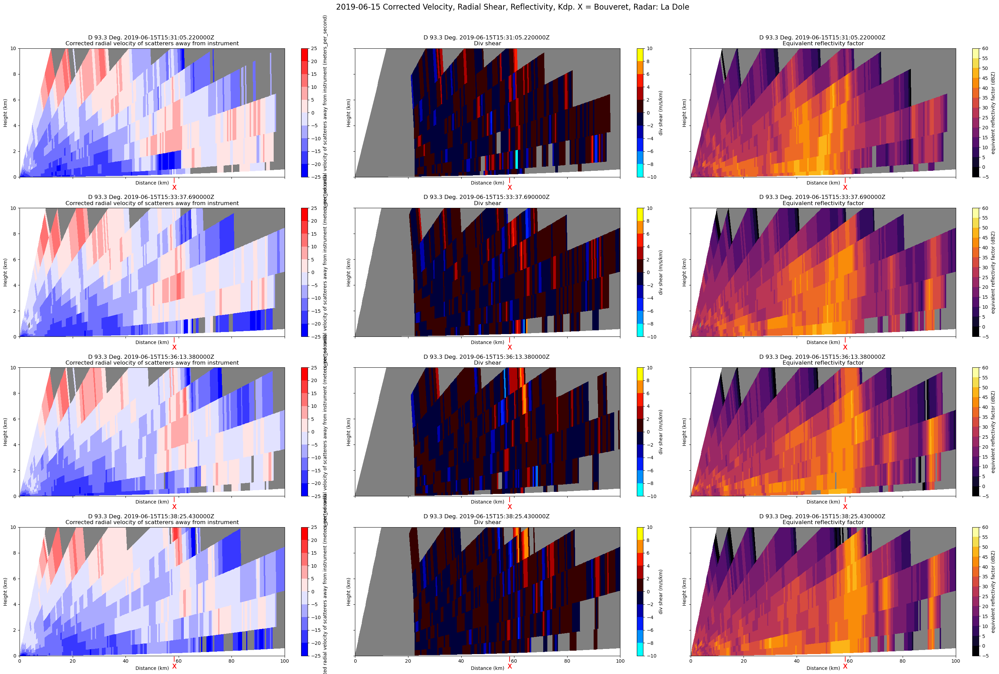

In [ ]:
# hightemp Bouveret 1540
downburst_location = 'Bouveret'
downburst_x = 555264
downburst_y = 138175
downburst_z = 374

# Define time intervals: x minutes before, and the exact time
time_deltas = [ -5, 0]  # minutes
first_scan = ['001', '003', '005', '007', '009', '011', '013', '015', '017', '019']
second_scan = ['002', '004', '006', '008', '010', '012', '014', '016', '018', '020']

wgs84 = converter.LV03toWGS84(downburst_x, downburst_y, downburst_z)
print(wgs84)
downburst_lat = wgs84[0]
downburst_lon = wgs84[1]

radar_coords = (radar_lat, radar_lon)
downburst_coords = (downburst_lat, downburst_lon)
downburst_distance = geopy.distance.geodesic(radar_coords, downburst_coords).km

# Calculate azimuth
azimuth_to_downburst = calculate_azimuth(radar_lat, radar_lon, downburst_lat, downburst_lon)
print(f"Azimuth angle to downburst occurrence: {azimuth_to_downburst:.2f} degrees")

# Convert valid_time3 to a datetime object
base_time = datetime.strptime(valid_time3, "%H%M")

# Set up the figure with 4 rows and 4 columns
fig, axes = plt.subplots(4, 3, sharex=True, sharey=True, figsize=(30, 20))
fig.suptitle("2019-06-15 Corrected Velocity, Radial Shear, Reflectivity, Kdp. X = " + downburst_location + ", Radar: " + radar_name, fontsize=16)

for row, delta in enumerate(time_deltas):
    # Calculate the time for this row
    current_time = (base_time + timedelta(minutes=delta)).strftime("%H%M")
    print(f"Looking for files with time: {current_time}")
    
    # Check what files are available in the directory
    files_rhi = sorted(glob.glob(f"{path}/MLD/ML{radar_station}19166{current_time}*"))
    print(f"Files found for time {current_time}: {files_rhi}")


    # Separate the files into two lists
    file_rhi_first_scan = []
    file_rhi_second_scan = []

    for file in files_rhi:
        # Extract the elevation scan number (last two digits before the file extension)
        elevation_scan = file.split('.')[-1]
    
        if elevation_scan in first_scan:
            file_rhi_first_scan.append(file)
        elif elevation_scan in second_scan:
            file_rhi_second_scan.append(file)

    # Merge radar data for the current time
    for i, f in enumerate(files_rhi):
        radar = pyart.aux_io.read_metranet(f)
        if i == 0:
            radar_merged = radar
        else:
            radar_merged = pyart.util.join_radar(radar_merged, radar)
    
    # Merge radar data for first scan
    radar_merged_first_scan = None
    for i, f in enumerate(file_rhi_first_scan):
        radar = pyart.aux_io.read_metranet(f)
        if i == 0:
            radar_merged_first_scan = radar
        else:
            radar_merged_first_scan = pyart.util.join_radar(radar_merged_first_scan, radar)

    # Merge radar data for second scan  
    radar_merged_second_scan = None
    for i, f in enumerate(file_rhi_second_scan):
        radar = pyart.aux_io.read_metranet(f)
        if i == 0:
            radar_merged_second_scan = radar
        else:
            radar_merged_second_scan = pyart.util.join_radar(radar_merged_second_scan, radar)

    # Perform dealiasing
    corr_vel = pyart.correct.dealias_region_based(radar_merged)
    corr_vel_first_scan = pyart.correct.dealias_region_based(radar_merged_first_scan)
    corr_vel_second_scan = pyart.correct.dealias_region_based(radar_merged_second_scan)

    # Add 'corrected_velocity' field if it doesn't already exist
    if 'corrected_velocity' not in radar_merged.fields:
        radar_merged.add_field('corrected_velocity', corr_vel)
    else:
        print(f"Field 'corrected_velocity' already exists for time {current_time}. Skipping addition.")

    # Add 'corrected_velocity' field if it doesn't already exist
    if 'corrected_velocity' not in radar_merged_first_scan.fields:
        radar_merged_first_scan.add_field('corrected_velocity', corr_vel_first_scan)
    else:
        print(f"Field 'corrected_velocity_first_scan' already exists for time {current_time}. Skipping addition.")

    # Add 'corrected_velocity' field if it doesn't already exist
    if 'corrected_velocity' not in radar_merged_second_scan.fields:
        radar_merged_second_scan.add_field('corrected_velocity', corr_vel_second_scan)
    else:
        print(f"Field 'corrected_velocity_second_scan' already exists for time {current_time}. Skipping addition.")

    div_shear = llsd(vel=radar_merged.fields['corrected_velocity']['data'], az_min=3, az_max=90, w_k=2, r_k=1.5, resolution=0.5)
    div_shear_first_scan = llsd(vel=radar_merged_first_scan.fields['corrected_velocity']['data'], az_min=3, az_max=90, w_k=2, r_k=1.5, resolution=0.5)
    div_shear_second_scan = llsd(vel=radar_merged_second_scan.fields['corrected_velocity']['data'], az_min=3, az_max=90, w_k=2, r_k=1.5, resolution=0.5)

    # Assuming div_shear is a NumPy array or similar
    div_shear_dict = {
        'data': div_shear[1],  # This should be the numerical array
        'units': 'm/s/km',  # You can adjust the units based on the actual meaning of div_shear
        'long_name': 'Divergence Shear',  # Add a descriptive name for the field
        'standard_name': 'div_shear',  # You can add any standard name
    }
    radar_merged.add_field('div_shear', div_shear_dict)
    # Assuming div_shear is a NumPy array or similar
    div_shear_dict_first_scan = {
        'data': div_shear_first_scan[1],  # This should be the numerical array
        'units': 'm/s/km',  # You can adjust the units based on the actual meaning of div_shear
        'long_name': 'Divergence Shear',  # Add a descriptive name for the field
        'standard_name': 'div_shear',  # You can add any standard name
    }
    radar_merged_first_scan.add_field('div_shear', div_shear_dict_first_scan)
    # Assuming div_shear is a NumPy array or similar
    div_shear_dict_second_scan = {
        'data': div_shear_second_scan[1],  # This should be the numerical array
        'units': 'm/s/km',  # You can adjust the units based on the actual meaning of div_shear
        'long_name': 'Divergence Shear',  # Add a descriptive name for the field
        'standard_name': 'div_shear',  # You can add any standard name
    }
    radar_merged_second_scan.add_field('div_shear', div_shear_dict_second_scan)
    # Now, add the field to the radar object
    
    # Create a pseudo RHI cross-section at azimuth 270 degrees
    pseudorhi = pyart.util.cross_section_ppi(radar_merged, [azimuth_to_downburst])
    display = pyart.graph.RadarDisplay(pseudorhi)
    # Create a pseudo RHI cross-section at azimuth 270 degrees
    pseudorhi_first_scan = pyart.util.cross_section_ppi(radar_merged_first_scan, [azimuth_to_downburst])
    display_first_scan = pyart.graph.RadarDisplay(pseudorhi_first_scan)
    # Create a pseudo RHI cross-section at azimuth 270 degrees
    pseudorhi_second_scan = pyart.util.cross_section_ppi(radar_merged_second_scan, [azimuth_to_downburst])
    display_second_scan = pyart.graph.RadarDisplay(pseudorhi_second_scan)

    if delta == -5:
        ax_vel_first_scan = axes[0, 0]
        ax_ref_first_scan = axes[0, 2]
        ax_div_shear_first_scan = axes[0, 1]
        ax_vel_second_scan = axes[1, 0]
        ax_ref_second_scan = axes[1, 2]
        ax_div_shear_second_scan = axes[1, 1]

        # Plot 'corrected_velocity' with specified color limits
        cmap_velocity.set_bad(color='grey')
        display_first_scan.plot_rhi('corrected_velocity', ax=ax_vel_first_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_velocity.set_bad(color='grey')
        display_second_scan.plot_rhi('corrected_velocity', ax=ax_vel_second_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")
 
        cmap_div_shear.set_bad(color='grey')
        display_first_scan.plot_rhi('div_shear', ax=ax_div_shear_first_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_div_shear.set_bad(color='grey')
        display_second_scan.plot_rhi('div_shear', ax=ax_div_shear_second_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_first_scan.plot_rhi('reflectivity', ax=ax_ref_first_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC")  

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_second_scan.plot_rhi('reflectivity', ax=ax_ref_second_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC") 
    if delta == 0:
        ax_vel_first_scan = axes[2, 0]
        ax_ref_first_scan = axes[2, 2]
        ax_div_shear_first_scan = axes[2, 1]
        ax_vel_second_scan = axes[3, 0]
        ax_ref_second_scan = axes[3, 2]
        ax_div_shear_second_scan = axes[3, 1]

        # Plot 'corrected_velocity' with specified color limits
        cmap_velocity.set_bad(color='grey')
        display_first_scan.plot_rhi('corrected_velocity', ax=ax_vel_first_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_velocity.set_bad(color='grey')
        display_second_scan.plot_rhi('corrected_velocity', ax=ax_vel_second_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")
 
        cmap_div_shear.set_bad(color='grey')
        display_first_scan.plot_rhi('div_shear', ax=ax_div_shear_first_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_div_shear.set_bad(color='grey')
        display_second_scan.plot_rhi('div_shear', ax=ax_div_shear_second_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_first_scan.plot_rhi('reflectivity', ax=ax_ref_first_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC")  

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_second_scan.plot_rhi('reflectivity', ax=ax_ref_second_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC")
    
# Loop over rows
for row in range(4):  # Adjust depending on the number of rows in your layout
    for col in range(3):  # Adjust depending on the number of columns
        ax_vel = axes[row, 0]  # Velocity plot
        ax_ref = axes[row, 2]  # Reflectivity plot
        ax_div_shear = axes[row, 1]  # Divergence/Shear plot

        # Annotate 'X' on the axes where needed
        for axis in [ax_vel, ax_ref, ax_div_shear]:
            axis.annotate('X', xy=(downburst_distance, 0), xytext=(downburst_distance, -1),
                          textcoords='data', ha='center', color='red', fontsize=14,
                          arrowprops=dict(arrowstyle='-', color='red'))

        # Set axis limits for each axis
        ax_vel.set_ylim([0, 10])   # Adjust height range as needed
        ax_vel.set_xlim([0, 100])  # Adjust distance range as needed

        # Set labels for all axes
        ax_vel.set_xlabel('Distance (km)')
        ax_vel.set_ylabel('Height (km)')
        
        ax_ref.set_xlabel('Distance (km)')
        ax_ref.set_ylabel('Height (km)')

        ax_div_shear.set_xlabel('Distance (km)')
        ax_div_shear.set_ylabel('Height (km)')

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout for the title
#plt.savefig("/users/fackerma/newproject1/figures/first_case/" + radar_station + "RHIhightemp_" + valid_time3 + "_" + downburst_location + "_2.png", dpi=300)



[46.393444164005814, 6.857012004756828, 425.51339160000003]
Azimuth angle to downburst occurrence: 93.26 degrees
Looking for files with time: 1520
Files found for time 1520: ['/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615200U.001', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615200U.002', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615200U.003', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615200U.004', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615200U.005', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615200U.006', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615200U.007', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615200U.008', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615200U.009', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615200U.010', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615200U.011', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615200U.012', '/scratch/mch/fackerm

/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pyart/aux_io/metranet_reader.py:142: UserWarning: Invalid reader name or C library not available, using python (default) instead
  warn('Invalid reader name or C library not available,' +
/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pyart/aux_io/metranet_reader.py:925: UserWarning: Moment SNR not in file
  warn('Moment ' + momnames[i] + ' not in file')


KeyboardInterrupt: 

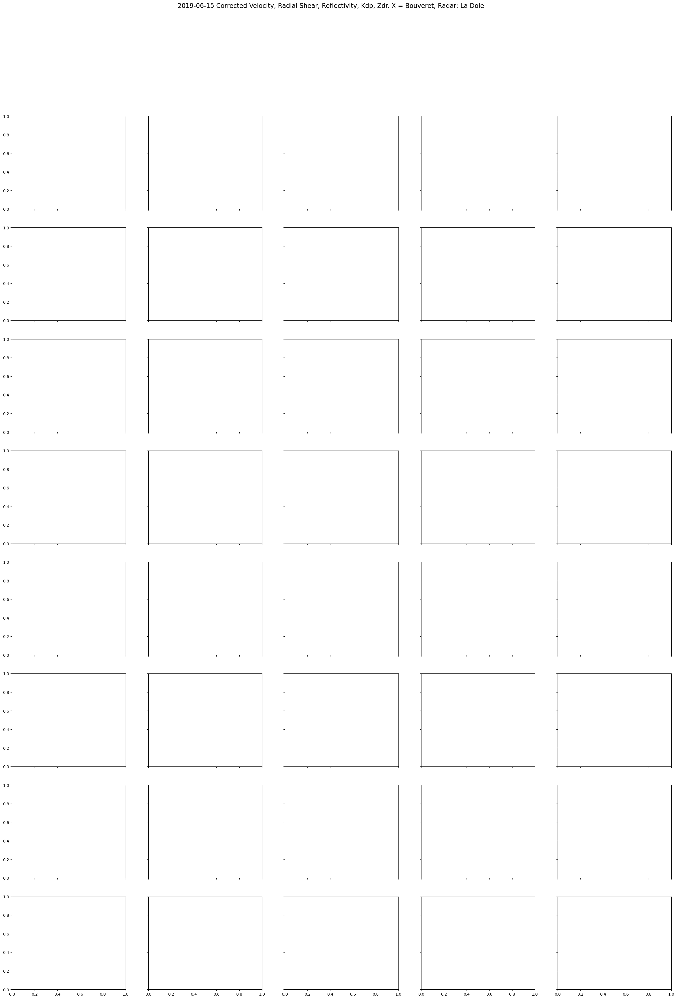

In [23]:
# hightemp Bouveret 1540
downburst_location = 'Bouveret'
downburst_x = 555264
downburst_y = 138175
downburst_z = 374

if radar_station == 'D':
    rhi_close = 0
    rhi_distance = 100
else:
    rhi_distance = 150
    rhi_close = 0

# Define time intervals: x minutes before, and the exact time
time_deltas = [-15, -10, -5, 0]  # minutes
first_scan = ['001', '003', '005', '007', '009', '011', '013', '015', '017', '019']
second_scan = ['002', '004', '006', '008', '010', '012', '014', '016', '018', '020']

wgs84 = converter.LV03toWGS84(downburst_x, downburst_y, downburst_z)
print(wgs84)
downburst_lat = wgs84[0]
downburst_lon = wgs84[1]

radar_coords = (radar_lat, radar_lon)
downburst_coords = (downburst_lat, downburst_lon)
downburst_distance = geopy.distance.geodesic(radar_coords, downburst_coords).km

# Calculate azimuth
azimuth_to_downburst = calculate_azimuth(radar_lat, radar_lon, downburst_lat, downburst_lon)
print(f"Azimuth angle to downburst occurrence: {azimuth_to_downburst:.2f} degrees")

# Convert valid_time3 to a datetime object
base_time = datetime.strptime(valid_time3, "%H%M")

div_shear_levels = np.arange(-5,5.5,0.5)
div_shear_norm = BoundaryNorm(boundaries=div_shear_levels, ncolors=256, clip=True)

# Set up the figure with 4 rows and 4 columns
fig, axes = plt.subplots(8, 5, sharex=True, sharey=True, figsize=(30, 40))
fig.suptitle("2019-06-15 Corrected Velocity, Radial Shear, Reflectivity, Kdp, Zdr. X = " + downburst_location + ", Radar: " + radar_name, fontsize=16)

for row, delta in enumerate(time_deltas):
    # Calculate the time for this row
    current_time = (base_time + timedelta(minutes=delta)).strftime("%H%M")
    print(f"Looking for files with time: {current_time}")
    
    # Check what files are available in the directory
    files_rhi = sorted(glob.glob(f"{path}/MLD/ML{radar_station}19166{current_time}*"))
    print(f"Files found for time {current_time}: {files_rhi}")

    # Separate the files into two lists
    file_rhi_first_scan = []
    file_rhi_second_scan = []

    for file in files_rhi:
        # Extract the elevation scan number (last two digits before the file extension)
        elevation_scan = file.split('.')[-1]
    
        if elevation_scan in first_scan:
            file_rhi_first_scan.append(file)
        elif elevation_scan in second_scan:
            file_rhi_second_scan.append(file)

    # Merge radar data for the current time
    for i, f in enumerate(files_rhi):
        radar = pyart.aux_io.read_metranet(f)
        if i == 0:
            radar_merged = radar
        else:
            radar_merged = pyart.util.join_radar(radar_merged, radar)
    
    # Merge radar data for first scan
    radar_merged_first_scan = None
    for i, f in enumerate(file_rhi_first_scan):
        radar = pyart.aux_io.read_metranet(f)
        if i == 0:
            radar_merged_first_scan = radar
        else:
            radar_merged_first_scan = pyart.util.join_radar(radar_merged_first_scan, radar)

    # Merge radar data for second scan  
    radar_merged_second_scan = None
    for i, f in enumerate(file_rhi_second_scan):
        radar = pyart.aux_io.read_metranet(f)
        if i == 0:
            radar_merged_second_scan = radar
        else:
            radar_merged_second_scan = pyart.util.join_radar(radar_merged_second_scan, radar)

    # Perform dealiasing
    #corr_vel = pyart.correct.dealias_region_based(radar_merged)
    corr_vel_first_scan = pyart.correct.dealias_region_based(radar_merged_first_scan)
    corr_vel_second_scan = pyart.correct.dealias_region_based(radar_merged_second_scan)

    # Add 'corrected_velocity' field if it doesn't already exist
    #if 'corrected_velocity' not in radar_merged.fields:
        #radar_merged.add_field('corrected_velocity', corr_vel)
    #else:
        #print(f"Field 'corrected_velocity' already exists for time {current_time}. Skipping addition.")

    # Add 'corrected_velocity' field if it doesn't already exist
    if 'corrected_velocity' not in radar_merged_first_scan.fields:
        radar_merged_first_scan.add_field('corrected_velocity', corr_vel_first_scan)
    else:
        print(f"Field 'corrected_velocity_first_scan' already exists for time {current_time}. Skipping addition.")

    # Add 'corrected_velocity' field if it doesn't already exist
    if 'corrected_velocity' not in radar_merged_second_scan.fields:
        radar_merged_second_scan.add_field('corrected_velocity', corr_vel_second_scan)
    else:
        print(f"Field 'corrected_velocity_second_scan' already exists for time {current_time}. Skipping addition.")

    #div_shear = llsd(vel=radar_merged.fields['corrected_velocity']['data'], az_min=3, az_max=90, w_k=1.5, r_k=2, resolution=0.5)
    div_shear_first_scan = llsd(vel=radar_merged_first_scan.fields['corrected_velocity']['data'], az_min=3, az_max=10, w_k=5, r_k=5, resolution=0.5)
    div_shear_second_scan = llsd(vel=radar_merged_second_scan.fields['corrected_velocity']['data'], az_min=3, az_max=10, w_k=5, r_k=5, resolution=0.5)

    # Assuming div_shear is a NumPy array or similar
    div_shear_dict_first_scan = {
        'data': div_shear_first_scan[1],  # This should be the numerical array
        'units': 'm/s/km',  # You can adjust the units based on the actual meaning of div_shear
        'long_name': 'Divergence Shear',  # Add a descriptive name for the field
        'standard_name': 'div_shear',  # You can add any standard name
    }
    radar_merged_first_scan.add_field('div_shear', div_shear_dict_first_scan)
    # Assuming div_shear is a NumPy array or similar
    div_shear_dict_second_scan = {
        'data': div_shear_second_scan[1],  # This should be the numerical array
        'units': 'm/s/km',  # You can adjust the units based on the actual meaning of div_shear
        'long_name': 'Divergence Shear',  # Add a descriptive name for the field
        'standard_name': 'div_shear',  # You can add any standard name
    }
    radar_merged_second_scan.add_field('div_shear', div_shear_dict_second_scan)
    # Now, add the field to the radar object

    kdp = pyart.retrieve.kdp_vulpiani(radar_merged_first_scan, psidp_field='uncorrected_differential_phase', band='C', parallel=True)
    radar_merged_first_scan.add_field('kdp', kdp[0])

    kdp = pyart.retrieve.kdp_vulpiani(radar_merged_second_scan, psidp_field='uncorrected_differential_phase', band='C', parallel=True)
    radar_merged_second_scan.add_field('kdp', kdp[0])
 
    
    # Create a pseudo RHI cross-section at azimuth 270 degrees
    pseudorhi = pyart.util.cross_section_ppi(radar_merged, [azimuth_to_downburst])
    display = pyart.graph.RadarDisplay(pseudorhi)
    # Create a pseudo RHI cross-section at azimuth 270 degrees
    pseudorhi_first_scan = pyart.util.cross_section_ppi(radar_merged_first_scan, [azimuth_to_downburst])
    display_first_scan = pyart.graph.RadarDisplay(pseudorhi_first_scan)
    # Create a pseudo RHI cross-section at azimuth 270 degrees
    pseudorhi_second_scan = pyart.util.cross_section_ppi(radar_merged_second_scan, [azimuth_to_downburst])
    display_second_scan = pyart.graph.RadarDisplay(pseudorhi_second_scan)


    
        
    if delta == -15:
        ax_vel_first_scan = axes[0, 0]
        ax_ref_first_scan = axes[0, 2]
        ax_div_shear_first_scan = axes[0, 1]
        ax_kdp_first_scan = axes[0,3]
        ax_zdr_first_scan = axes[0,4]
        ax_vel_second_scan = axes[1, 0]
        ax_ref_second_scan = axes[1, 2]
        ax_div_shear_second_scan = axes[1, 1]
        ax_kdp_second_scan = axes[1,3]
        ax_zdr_second_scan = axes[1,4]

        # Plot 'corrected_velocity' with specified color limits
        cmap_velocity.set_bad(color='grey')
        display_first_scan.plot_rhi('corrected_velocity', ax=ax_vel_first_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_velocity.set_bad(color='grey')
        display_second_scan.plot_rhi('corrected_velocity', ax=ax_vel_second_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")
 
        cmap_div_shear.set_bad(color='grey')
        display_first_scan.plot_rhi('div_shear', ax=ax_div_shear_first_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_div_shear.set_bad(color='grey')
        display_second_scan.plot_rhi('div_shear', ax=ax_div_shear_second_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_first_scan.plot_rhi('reflectivity', ax=ax_ref_first_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC")  

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_second_scan.plot_rhi('reflectivity', ax=ax_ref_second_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC")

        # Plot KDP
        cmap_Kdp.set_bad(color='grey')
        display_first_scan.plot_rhi('kdp', ax=ax_kdp_first_scan, ticks=Kdp_levels, norm=Kdp_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_Kdp)
        
        # Plot KDP
        cmap_Kdp.set_bad(color='grey')
        display_second_scan.plot_rhi('kdp', ax=ax_kdp_second_scan, ticks=Kdp_levels, norm=Kdp_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_Kdp)
        
        # Plot KDP
        cmap_diff_reflectivity.set_bad(color='grey')
        display_first_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_first_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_diff_reflectivity)
        
        cmap_diff_reflectivity.set_bad(color='grey')
        display_second_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_second_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_diff_reflectivity)
        
    if delta == -10:
        ax_vel_first_scan = axes[2, 0]
        ax_ref_first_scan = axes[2, 2]
        ax_div_shear_first_scan = axes[2, 1]
        ax_kdp_first_scan = axes[2,3]
        ax_zdr_first_scan = axes[2,4]
        ax_vel_second_scan = axes[3, 0]
        ax_ref_second_scan = axes[3, 2]
        ax_div_shear_second_scan = axes[3, 1]
        ax_kdp_second_scan = axes[3,3]
        ax_zdr_second_scan = axes[3,4]

        # Plot 'corrected_velocity' with specified color limits
        cmap_velocity.set_bad(color='grey')
        display_first_scan.plot_rhi('corrected_velocity', ax=ax_vel_first_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_velocity.set_bad(color='grey')
        display_second_scan.plot_rhi('corrected_velocity', ax=ax_vel_second_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")
 
        cmap_div_shear.set_bad(color='grey')
        display_first_scan.plot_rhi('div_shear', ax=ax_div_shear_first_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_div_shear.set_bad(color='grey')
        display_second_scan.plot_rhi('div_shear', ax=ax_div_shear_second_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_first_scan.plot_rhi('reflectivity', ax=ax_ref_first_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC")  

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_second_scan.plot_rhi('reflectivity', ax=ax_ref_second_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC")

        # Plot KDP
        cmap_Kdp.set_bad(color='grey')
        display_first_scan.plot_rhi('kdp', ax=ax_kdp_first_scan, ticks=Kdp_levels, norm=Kdp_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_Kdp)
        
        # Plot KDP
        cmap_Kdp.set_bad(color='grey')
        display_second_scan.plot_rhi('kdp', ax=ax_kdp_second_scan, ticks=Kdp_levels, norm=Kdp_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_Kdp)
        
        # Plot Zdr
        cmap_diff_reflectivity.set_bad(color='grey')
        display_first_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_first_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_diff_reflectivity)
        
        cmap_diff_reflectivity.set_bad(color='grey')
        display_second_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_second_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_diff_reflectivity)
        
    if delta == -5:
        ax_vel_first_scan = axes[4, 0]
        ax_ref_first_scan = axes[4, 2]
        ax_div_shear_first_scan = axes[4, 1]
        ax_kdp_first_scan = axes[4,3]
        ax_zdr_first_scan = axes[4,4]
        ax_vel_second_scan = axes[5, 0]
        ax_ref_second_scan = axes[5, 2]
        ax_div_shear_second_scan = axes[5, 1]
        ax_kdp_second_scan = axes[5,3]
        ax_zdr_second_scan = axes[5,4]

        # Plot 'corrected_velocity' with specified color limits
        cmap_velocity.set_bad(color='grey')
        display_first_scan.plot_rhi('corrected_velocity', ax=ax_vel_first_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_velocity.set_bad(color='grey')
        display_second_scan.plot_rhi('corrected_velocity', ax=ax_vel_second_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")
 
        cmap_div_shear.set_bad(color='grey')
        display_first_scan.plot_rhi('div_shear', ax=ax_div_shear_first_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_div_shear.set_bad(color='grey')
        display_second_scan.plot_rhi('div_shear', ax=ax_div_shear_second_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_first_scan.plot_rhi('reflectivity', ax=ax_ref_first_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC")  

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_second_scan.plot_rhi('reflectivity', ax=ax_ref_second_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC") 

        # Plot KDP
        cmap_Kdp.set_bad(color='grey')
        display_first_scan.plot_rhi('kdp', ax=ax_kdp_first_scan, ticks=Kdp_levels, norm=Kdp_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_Kdp)
        
        # Plot KDP
        cmap_Kdp.set_bad(color='grey')
        display_second_scan.plot_rhi('kdp', ax=ax_kdp_second_scan, ticks=Kdp_levels, norm=Kdp_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_Kdp)
        
        # Plot Zdr
        cmap_diff_reflectivity.set_bad(color='grey')
        display_first_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_first_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_diff_reflectivity)
        
        cmap_diff_reflectivity.set_bad(color='grey')
        display_second_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_second_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_diff_reflectivity)
        
    if delta == 0:
        ax_vel_first_scan = axes[6, 0]
        ax_ref_first_scan = axes[6, 2]
        ax_div_shear_first_scan = axes[6, 1]
        ax_kdp_first_scan = axes[6,3]
        ax_zdr_first_scan = axes[6,4]
        ax_vel_second_scan = axes[7, 0]
        ax_ref_second_scan = axes[7, 2]
        ax_div_shear_second_scan = axes[7, 1]
        ax_kdp_second_scan = axes[7,3]
        ax_zdr_second_scan = axes[7,4]

        # Plot 'corrected_velocity' with specified color limits
        cmap_velocity.set_bad(color='grey')
        display_first_scan.plot_rhi('corrected_velocity', ax=ax_vel_first_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_velocity.set_bad(color='grey')
        display_second_scan.plot_rhi('corrected_velocity', ax=ax_vel_second_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")
 
        cmap_div_shear.set_bad(color='grey')
        display_first_scan.plot_rhi('div_shear', ax=ax_div_shear_first_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_div_shear.set_bad(color='grey')
        display_second_scan.plot_rhi('div_shear', ax=ax_div_shear_second_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_first_scan.plot_rhi('reflectivity', ax=ax_ref_first_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC")  

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_second_scan.plot_rhi('reflectivity', ax=ax_ref_second_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC")

        # Plot KDP
        cmap_Kdp.set_bad(color='grey')
        display_first_scan.plot_rhi('kdp', ax=ax_kdp_first_scan, ticks=Kdp_levels, norm=Kdp_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_Kdp)
        
        # Plot KDP
        cmap_Kdp.set_bad(color='grey')
        display_second_scan.plot_rhi('kdp', ax=ax_kdp_second_scan, ticks=Kdp_levels, norm=Kdp_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_Kdp)
        
        # Plot Zdr
        cmap_diff_reflectivity.set_bad(color='grey')
        display_first_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_first_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_diff_reflectivity)
        
        cmap_diff_reflectivity.set_bad(color='grey')
        display_second_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_second_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_diff_reflectivity)
    
# Loop over rows
for row in range(8):  # Adjust depending on the number of rows in your layout
    for col in range(5):  # Adjust depending on the number of columns
        ax_vel = axes[row, 0]  # Velocity plot
        ax_ref = axes[row, 2]  # Reflectivity plot
        ax_div_shear = axes[row, 1]  # Divergence/Shear plot
        ax_kdp = axes[row, 3]
        ax_zdr = axes[row, 4]

        # Annotate 'X' on the axes where needed
        for axis in [ax_vel, ax_ref, ax_div_shear, ax_kdp, ax_zdr]:
            axis.annotate('X', xy=(downburst_distance, 0), xytext=(downburst_distance, -1),
                          textcoords='data', ha='center', color='red', fontsize=14,
                          arrowprops=dict(arrowstyle='-', color='red'))

        # Set axis limits for each axis
        ax_vel.set_ylim([0, 10])   # Adjust height range as needed
        ax_vel.set_xlim([rhi_close, rhi_distance])  # Adjust distance range as needed

        # Set labels for all axes
        ax_vel.set_xlabel('Distance (km)')
        ax_vel.set_ylabel('Height (km)')
        
        ax_ref.set_xlabel('Distance (km)')
        ax_ref.set_ylabel('Height (km)')

        ax_div_shear.set_xlabel('Distance (km)')
        ax_div_shear.set_ylabel('Height (km)')

        ax_kdp.set_xlabel('Distance (km)')
        ax_kdp.set_ylabel('Height (km)')

        ax_zdr.set_xlabel('Distance (km)')
        ax_zdr.set_ylabel('Height (km)')



plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout for the title
#plt.savefig("/users/fackerma/newproject1/figures/first_case/RHI3/" + radar_station + "RHIhightemp_" + valid_time3 + "_" + downburst_location + "_5.png", dpi=300)

[46.47123377689653, 6.815059841190157, 456.35684832000004]
Azimuth angle to downburst occurrence: 84.46 degrees
Looking for files with time: 1515
Files found for time 1515: ['/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615150U.001', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615150U.002', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615150U.003', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615150U.004', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615150U.005', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615150U.006', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615150U.007', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615150U.008', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615150U.009', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615150U.010', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615150U.011', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615150U.012', '/scratch/mch/fackerma

/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pyart/aux_io/metranet_reader.py:142: UserWarning: Invalid reader name or C library not available, using python (default) instead
  warn('Invalid reader name or C library not available,' +
/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pyart/aux_io/metranet_reader.py:925: UserWarning: Moment SNR not in file
  warn('Moment ' + momnames[i] + ' not in file')
/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pyart/correct/region_dealias.py:389: RuntimeWarning: overflow encountered in cast
  labels.astype('int32'), data.astype('float32'),
/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pyart/correct/region_dealias.py:389: RuntimeWarning: invalid value encountered in cast
  labels.astype('int32'), data.astype('float32'),
/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pyart/correct/region_dealias.py:227: RuntimeWa

Looking for files with time: 1520
Files found for time 1520: ['/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615200U.001', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615200U.002', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615200U.003', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615200U.004', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615200U.005', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615200U.006', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615200U.007', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615200U.008', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615200U.009', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615200U.010', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615200U.011', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615200U.012', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615200U.013', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615200U.014', 

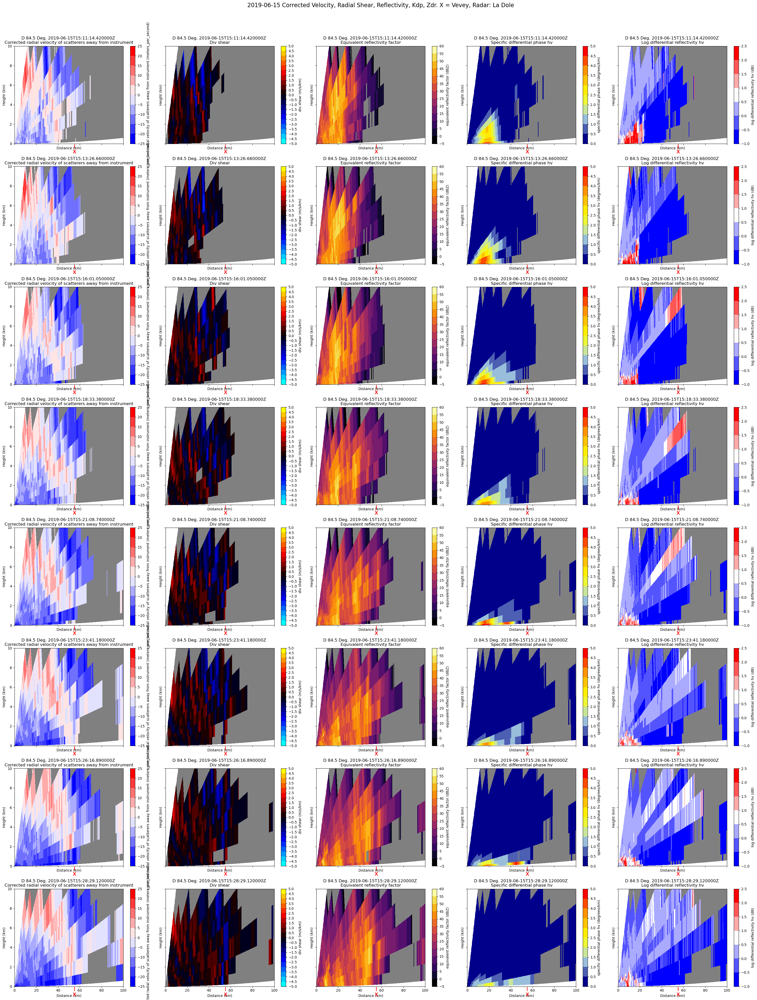

In [12]:
# hightemp Vevey 1530
downburst_location = 'Vevey'
downburst_x = 552106
downburst_y = 146847
downburst_z = 405

if radar_station == 'D':
    rhi_close = 0
    rhi_distance = 100
else:
    rhi_distance = 150
    rhi_close = 0

# Define time intervals: x minutes before, and the exact time
time_deltas = [-15, -10, -5, 0]  # minutes
first_scan = ['001', '003', '005', '007', '009', '011', '013', '015', '017', '019']
second_scan = ['002', '004', '006', '008', '010', '012', '014', '016', '018', '020']

wgs84 = converter.LV03toWGS84(downburst_x, downburst_y, downburst_z)
print(wgs84)
downburst_lat = wgs84[0]
downburst_lon = wgs84[1]

radar_coords = (radar_lat, radar_lon)
downburst_coords = (downburst_lat, downburst_lon)
downburst_distance = geopy.distance.geodesic(radar_coords, downburst_coords).km

# Calculate azimuth
azimuth_to_downburst = calculate_azimuth(radar_lat, radar_lon, downburst_lat, downburst_lon)
print(f"Azimuth angle to downburst occurrence: {azimuth_to_downburst:.2f} degrees")

# Convert valid_time3 to a datetime object
base_time = datetime.strptime(valid_time3, "%H%M")

div_shear_levels = np.arange(-5,5.5,0.5)
div_shear_norm = BoundaryNorm(boundaries=div_shear_levels, ncolors=256, clip=True)

# Set up the figure with 4 rows and 4 columns
fig, axes = plt.subplots(8, 5, sharex=True, sharey=True, figsize=(30, 40))
fig.suptitle("2019-06-15 Corrected Velocity, Radial Shear, Reflectivity, Kdp, Zdr. X = " + downburst_location + ", Radar: " + radar_name, fontsize=16)

for row, delta in enumerate(time_deltas):
    # Calculate the time for this row
    current_time = (base_time + timedelta(minutes=delta)).strftime("%H%M")
    print(f"Looking for files with time: {current_time}")
    
    # Check what files are available in the directory
    files_rhi = sorted(glob.glob(f"{path}/MLD/ML{radar_station}19166{current_time}*"))
    print(f"Files found for time {current_time}: {files_rhi}")

    # Separate the files into two lists
    file_rhi_first_scan = []
    file_rhi_second_scan = []

    for file in files_rhi:
        # Extract the elevation scan number (last two digits before the file extension)
        elevation_scan = file.split('.')[-1]
    
        if elevation_scan in first_scan:
            file_rhi_first_scan.append(file)
        elif elevation_scan in second_scan:
            file_rhi_second_scan.append(file)

    # Merge radar data for the current time
    for i, f in enumerate(files_rhi):
        radar = pyart.aux_io.read_metranet(f)
        if i == 0:
            radar_merged = radar
        else:
            radar_merged = pyart.util.join_radar(radar_merged, radar)
    
    # Merge radar data for first scan
    radar_merged_first_scan = None
    for i, f in enumerate(file_rhi_first_scan):
        radar = pyart.aux_io.read_metranet(f)
        if i == 0:
            radar_merged_first_scan = radar
        else:
            radar_merged_first_scan = pyart.util.join_radar(radar_merged_first_scan, radar)

    # Merge radar data for second scan  
    radar_merged_second_scan = None
    for i, f in enumerate(file_rhi_second_scan):
        radar = pyart.aux_io.read_metranet(f)
        if i == 0:
            radar_merged_second_scan = radar
        else:
            radar_merged_second_scan = pyart.util.join_radar(radar_merged_second_scan, radar)

    # Perform dealiasing
    #corr_vel = pyart.correct.dealias_region_based(radar_merged)
    corr_vel_first_scan = pyart.correct.dealias_region_based(radar_merged_first_scan)
    corr_vel_second_scan = pyart.correct.dealias_region_based(radar_merged_second_scan)

    # Add 'corrected_velocity' field if it doesn't already exist
    #if 'corrected_velocity' not in radar_merged.fields:
        #radar_merged.add_field('corrected_velocity', corr_vel)
    #else:
        #print(f"Field 'corrected_velocity' already exists for time {current_time}. Skipping addition.")

    # Add 'corrected_velocity' field if it doesn't already exist
    if 'corrected_velocity' not in radar_merged_first_scan.fields:
        radar_merged_first_scan.add_field('corrected_velocity', corr_vel_first_scan)
    else:
        print(f"Field 'corrected_velocity_first_scan' already exists for time {current_time}. Skipping addition.")

    # Add 'corrected_velocity' field if it doesn't already exist
    if 'corrected_velocity' not in radar_merged_second_scan.fields:
        radar_merged_second_scan.add_field('corrected_velocity', corr_vel_second_scan)
    else:
        print(f"Field 'corrected_velocity_second_scan' already exists for time {current_time}. Skipping addition.")

    #div_shear = llsd(vel=radar_merged.fields['corrected_velocity']['data'], az_min=3, az_max=90, w_k=1.5, r_k=2, resolution=0.5)
    div_shear_first_scan = llsd(vel=radar_merged_first_scan.fields['corrected_velocity']['data'], az_min=3, az_max=10, w_k=5, r_k=5, resolution=0.5)
    div_shear_second_scan = llsd(vel=radar_merged_second_scan.fields['corrected_velocity']['data'], az_min=3, az_max=10, w_k=5, r_k=5, resolution=0.5)

    # Assuming div_shear is a NumPy array or similar
    div_shear_dict_first_scan = {
        'data': div_shear_first_scan[1],  # This should be the numerical array
        'units': 'm/s/km',  # You can adjust the units based on the actual meaning of div_shear
        'long_name': 'Divergence Shear',  # Add a descriptive name for the field
        'standard_name': 'div_shear',  # You can add any standard name
    }
    radar_merged_first_scan.add_field('div_shear', div_shear_dict_first_scan)
    # Assuming div_shear is a NumPy array or similar
    div_shear_dict_second_scan = {
        'data': div_shear_second_scan[1],  # This should be the numerical array
        'units': 'm/s/km',  # You can adjust the units based on the actual meaning of div_shear
        'long_name': 'Divergence Shear',  # Add a descriptive name for the field
        'standard_name': 'div_shear',  # You can add any standard name
    }
    radar_merged_second_scan.add_field('div_shear', div_shear_dict_second_scan)
    # Now, add the field to the radar object

    kdp = pyart.retrieve.kdp_vulpiani(radar_merged_first_scan, psidp_field='uncorrected_differential_phase', band='C', parallel=True)
    radar_merged_first_scan.add_field('kdp', kdp[0])

    kdp = pyart.retrieve.kdp_vulpiani(radar_merged_second_scan, psidp_field='uncorrected_differential_phase', band='C', parallel=True)
    radar_merged_second_scan.add_field('kdp', kdp[0])
 
    
    # Create a pseudo RHI cross-section at azimuth 270 degrees
    pseudorhi = pyart.util.cross_section_ppi(radar_merged, [azimuth_to_downburst])
    display = pyart.graph.RadarDisplay(pseudorhi)
    # Create a pseudo RHI cross-section at azimuth 270 degrees
    pseudorhi_first_scan = pyart.util.cross_section_ppi(radar_merged_first_scan, [azimuth_to_downburst])
    display_first_scan = pyart.graph.RadarDisplay(pseudorhi_first_scan)
    # Create a pseudo RHI cross-section at azimuth 270 degrees
    pseudorhi_second_scan = pyart.util.cross_section_ppi(radar_merged_second_scan, [azimuth_to_downburst])
    display_second_scan = pyart.graph.RadarDisplay(pseudorhi_second_scan)


    
        
    if delta == -15:
        ax_vel_first_scan = axes[0, 0]
        ax_ref_first_scan = axes[0, 2]
        ax_div_shear_first_scan = axes[0, 1]
        ax_kdp_first_scan = axes[0,3]
        ax_zdr_first_scan = axes[0,4]
        ax_vel_second_scan = axes[1, 0]
        ax_ref_second_scan = axes[1, 2]
        ax_div_shear_second_scan = axes[1, 1]
        ax_kdp_second_scan = axes[1,3]
        ax_zdr_second_scan = axes[1,4]

        # Plot 'corrected_velocity' with specified color limits
        cmap_velocity.set_bad(color='grey')
        display_first_scan.plot_rhi('corrected_velocity', ax=ax_vel_first_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_velocity.set_bad(color='grey')
        display_second_scan.plot_rhi('corrected_velocity', ax=ax_vel_second_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")
 
        cmap_div_shear.set_bad(color='grey')
        display_first_scan.plot_rhi('div_shear', ax=ax_div_shear_first_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_div_shear.set_bad(color='grey')
        display_second_scan.plot_rhi('div_shear', ax=ax_div_shear_second_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_first_scan.plot_rhi('reflectivity', ax=ax_ref_first_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC")  

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_second_scan.plot_rhi('reflectivity', ax=ax_ref_second_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC")

        # Plot KDP
        cmap_Kdp.set_bad(color='grey')
        display_first_scan.plot_rhi('kdp', ax=ax_kdp_first_scan, ticks=Kdp_levels, norm=Kdp_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_Kdp)
        
        # Plot KDP
        cmap_Kdp.set_bad(color='grey')
        display_second_scan.plot_rhi('kdp', ax=ax_kdp_second_scan, ticks=Kdp_levels, norm=Kdp_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_Kdp)
        
        # Plot KDP
        cmap_diff_reflectivity.set_bad(color='grey')
        display_first_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_first_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_diff_reflectivity)
        
        cmap_diff_reflectivity.set_bad(color='grey')
        display_second_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_second_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_diff_reflectivity)
        
    if delta == -10:
        ax_vel_first_scan = axes[2, 0]
        ax_ref_first_scan = axes[2, 2]
        ax_div_shear_first_scan = axes[2, 1]
        ax_kdp_first_scan = axes[2,3]
        ax_zdr_first_scan = axes[2,4]
        ax_vel_second_scan = axes[3, 0]
        ax_ref_second_scan = axes[3, 2]
        ax_div_shear_second_scan = axes[3, 1]
        ax_kdp_second_scan = axes[3,3]
        ax_zdr_second_scan = axes[3,4]

        # Plot 'corrected_velocity' with specified color limits
        cmap_velocity.set_bad(color='grey')
        display_first_scan.plot_rhi('corrected_velocity', ax=ax_vel_first_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_velocity.set_bad(color='grey')
        display_second_scan.plot_rhi('corrected_velocity', ax=ax_vel_second_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")
 
        cmap_div_shear.set_bad(color='grey')
        display_first_scan.plot_rhi('div_shear', ax=ax_div_shear_first_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_div_shear.set_bad(color='grey')
        display_second_scan.plot_rhi('div_shear', ax=ax_div_shear_second_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_first_scan.plot_rhi('reflectivity', ax=ax_ref_first_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC")  

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_second_scan.plot_rhi('reflectivity', ax=ax_ref_second_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC")

        # Plot KDP
        cmap_Kdp.set_bad(color='grey')
        display_first_scan.plot_rhi('kdp', ax=ax_kdp_first_scan, ticks=Kdp_levels, norm=Kdp_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_Kdp)
        
        # Plot KDP
        cmap_Kdp.set_bad(color='grey')
        display_second_scan.plot_rhi('kdp', ax=ax_kdp_second_scan, ticks=Kdp_levels, norm=Kdp_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_Kdp)
        
        # Plot Zdr
        cmap_diff_reflectivity.set_bad(color='grey')
        display_first_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_first_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_diff_reflectivity)
        
        cmap_diff_reflectivity.set_bad(color='grey')
        display_second_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_second_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_diff_reflectivity)
        
    if delta == -5:
        ax_vel_first_scan = axes[4, 0]
        ax_ref_first_scan = axes[4, 2]
        ax_div_shear_first_scan = axes[4, 1]
        ax_kdp_first_scan = axes[4,3]
        ax_zdr_first_scan = axes[4,4]
        ax_vel_second_scan = axes[5, 0]
        ax_ref_second_scan = axes[5, 2]
        ax_div_shear_second_scan = axes[5, 1]
        ax_kdp_second_scan = axes[5,3]
        ax_zdr_second_scan = axes[5,4]

        # Plot 'corrected_velocity' with specified color limits
        cmap_velocity.set_bad(color='grey')
        display_first_scan.plot_rhi('corrected_velocity', ax=ax_vel_first_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_velocity.set_bad(color='grey')
        display_second_scan.plot_rhi('corrected_velocity', ax=ax_vel_second_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")
 
        cmap_div_shear.set_bad(color='grey')
        display_first_scan.plot_rhi('div_shear', ax=ax_div_shear_first_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_div_shear.set_bad(color='grey')
        display_second_scan.plot_rhi('div_shear', ax=ax_div_shear_second_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_first_scan.plot_rhi('reflectivity', ax=ax_ref_first_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC")  

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_second_scan.plot_rhi('reflectivity', ax=ax_ref_second_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC") 

        # Plot KDP
        cmap_Kdp.set_bad(color='grey')
        display_first_scan.plot_rhi('kdp', ax=ax_kdp_first_scan, ticks=Kdp_levels, norm=Kdp_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_Kdp)
        
        # Plot KDP
        cmap_Kdp.set_bad(color='grey')
        display_second_scan.plot_rhi('kdp', ax=ax_kdp_second_scan, ticks=Kdp_levels, norm=Kdp_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_Kdp)
        
        # Plot Zdr
        cmap_diff_reflectivity.set_bad(color='grey')
        display_first_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_first_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_diff_reflectivity)
        
        cmap_diff_reflectivity.set_bad(color='grey')
        display_second_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_second_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_diff_reflectivity)
        
    if delta == 0:
        ax_vel_first_scan = axes[6, 0]
        ax_ref_first_scan = axes[6, 2]
        ax_div_shear_first_scan = axes[6, 1]
        ax_kdp_first_scan = axes[6,3]
        ax_zdr_first_scan = axes[6,4]
        ax_vel_second_scan = axes[7, 0]
        ax_ref_second_scan = axes[7, 2]
        ax_div_shear_second_scan = axes[7, 1]
        ax_kdp_second_scan = axes[7,3]
        ax_zdr_second_scan = axes[7,4]

        # Plot 'corrected_velocity' with specified color limits
        cmap_velocity.set_bad(color='grey')
        display_first_scan.plot_rhi('corrected_velocity', ax=ax_vel_first_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_velocity.set_bad(color='grey')
        display_second_scan.plot_rhi('corrected_velocity', ax=ax_vel_second_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")
 
        cmap_div_shear.set_bad(color='grey')
        display_first_scan.plot_rhi('div_shear', ax=ax_div_shear_first_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_div_shear.set_bad(color='grey')
        display_second_scan.plot_rhi('div_shear', ax=ax_div_shear_second_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_first_scan.plot_rhi('reflectivity', ax=ax_ref_first_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC")  

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_second_scan.plot_rhi('reflectivity', ax=ax_ref_second_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC")

        # Plot KDP
        cmap_Kdp.set_bad(color='grey')
        display_first_scan.plot_rhi('kdp', ax=ax_kdp_first_scan, ticks=Kdp_levels, norm=Kdp_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_Kdp)
        
        # Plot KDP
        cmap_Kdp.set_bad(color='grey')
        display_second_scan.plot_rhi('kdp', ax=ax_kdp_second_scan, ticks=Kdp_levels, norm=Kdp_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_Kdp)
        
        # Plot Zdr
        cmap_diff_reflectivity.set_bad(color='grey')
        display_first_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_first_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_diff_reflectivity)
        
        cmap_diff_reflectivity.set_bad(color='grey')
        display_second_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_second_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_diff_reflectivity)
    
# Loop over rows
for row in range(8):  # Adjust depending on the number of rows in your layout
    for col in range(5):  # Adjust depending on the number of columns
        ax_vel = axes[row, 0]  # Velocity plot
        ax_ref = axes[row, 2]  # Reflectivity plot
        ax_div_shear = axes[row, 1]  # Divergence/Shear plot
        ax_kdp = axes[row, 3]
        ax_zdr = axes[row, 4]

        # Annotate 'X' on the axes where needed
        for axis in [ax_vel, ax_ref, ax_div_shear, ax_kdp, ax_zdr]:
            axis.annotate('X', xy=(downburst_distance, 0), xytext=(downburst_distance, -1),
                          textcoords='data', ha='center', color='red', fontsize=14,
                          arrowprops=dict(arrowstyle='-', color='red'))

        # Set axis limits for each axis
        ax_vel.set_ylim([0, 10])   # Adjust height range as needed
        ax_vel.set_xlim([rhi_close, rhi_distance])  # Adjust distance range as needed

        # Set labels for all axes
        ax_vel.set_xlabel('Distance (km)')
        ax_vel.set_ylabel('Height (km)')
        
        ax_ref.set_xlabel('Distance (km)')
        ax_ref.set_ylabel('Height (km)')

        ax_div_shear.set_xlabel('Distance (km)')
        ax_div_shear.set_ylabel('Height (km)')

        ax_kdp.set_xlabel('Distance (km)')
        ax_kdp.set_ylabel('Height (km)')

        ax_zdr.set_xlabel('Distance (km)')
        ax_zdr.set_ylabel('Height (km)')



plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout for the title
plt.savefig("/users/fackerma/newproject1/figures/first_case/RHI3/" + radar_station + "RHIhightemp_" + valid_time3 + "_" + downburst_location + "_5.png", dpi=300)

[46.47123377689653, 6.815059841190157, 456.35684832000004]
Azimuth angle to downburst occurrence: 84.46 degrees
Looking for files with time: 1515
Files found for time 1515: ['/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615150U.001', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615150U.002', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615150U.003', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615150U.004', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615150U.005', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615150U.006', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615150U.007', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615150U.008', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615150U.009', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615150U.010', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615150U.011', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615150U.012', '/scratch/mch/fackerma

/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pyart/aux_io/metranet_python.py:613: UserWarning: [Errno 21] Is a directory: '/'
  warn(str(ee))


AttributeError: 'NoneType' object has no attribute 'data'

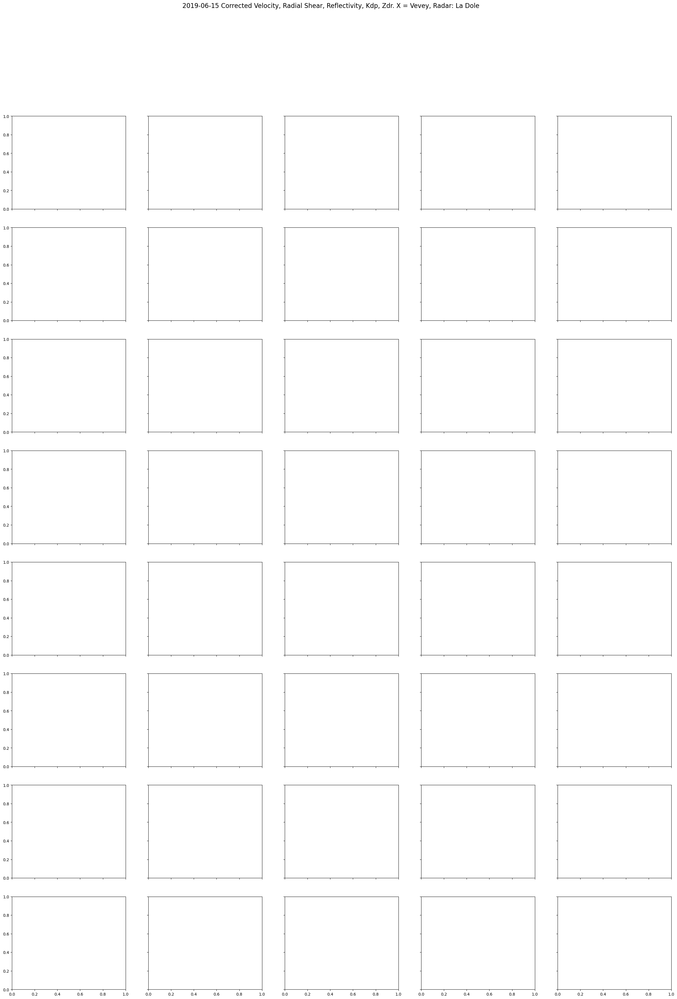

In [ ]:
# hightemp Vevey 1530
downburst_location = 'Vevey'
downburst_x = 552106
downburst_y = 146847
downburst_z = 405

if radar_station == 'D':
    rhi_close = 0
    rhi_distance = 100
else:
    rhi_distance = 150
    rhi_close = 0

# Define time intervals: x minutes before, and the exact time
time_deltas = [-15, -10, -5, 0]  # minutes
first_scan = ['001', '003', '005', '007', '009', '011', '013', '015', '017', '019']
second_scan = ['002', '004', '006', '008', '010', '012', '014', '016', '018', '020']
first_scan_dv = ['801', '803', '805', '807', '809', '811', '813', '815', '817', '819']
second_scan_dv = ['802', '804', '806', '808', '810', '812', '814', '816', '818', '820']

wgs84 = converter.LV03toWGS84(downburst_x, downburst_y, downburst_z)
print(wgs84)
downburst_lat = wgs84[0]
downburst_lon = wgs84[1]

radar_coords = (radar_lat, radar_lon)
downburst_coords = (downburst_lat, downburst_lon)
downburst_distance = geopy.distance.geodesic(radar_coords, downburst_coords).km

# Calculate azimuth
azimuth_to_downburst = calculate_azimuth(radar_lat, radar_lon, downburst_lat, downburst_lon)
print(f"Azimuth angle to downburst occurrence: {azimuth_to_downburst:.2f} degrees")

# Convert valid_time3 to a datetime object
base_time = datetime.strptime(valid_time3, "%H%M")

div_shear_levels = np.arange(-5,5.5,0.5)
div_shear_norm = BoundaryNorm(boundaries=div_shear_levels, ncolors=256, clip=True)

# Set up the figure with 4 rows and 4 columns
fig, axes = plt.subplots(8, 5, sharex=True, sharey=True, figsize=(30, 40))
fig.suptitle("2019-06-15 Corrected Velocity, Radial Shear, Reflectivity, Kdp, Zdr. X = " + downburst_location + ", Radar: " + radar_name, fontsize=16)

for row, delta in enumerate(time_deltas):
    # Calculate the time for this row
    current_time = (base_time + timedelta(minutes=delta)).strftime("%H%M")
    print(f"Looking for files with time: {current_time}")
    
    # Check what files are available in the directory
    files_rhi = sorted(glob.glob(f"{path}/MLD/ML{radar_station}19166{current_time}*"))
    print(f"Files found for time {current_time}: {files_rhi}")
    #files_dv = sorted(glob.glob(f"{path}/MLD/ML{radar_station}19166{current_time}*"))
    files_dv = sorted(glob.glob(f"{path}/DVD/srn/data/tmp/mof/DV{radar_station}/DV{radar_station}19166{current_time}*"))
    print(f"Files found for time {current_time}: {files_dv}")
    #glob.glob(path +'/DVD/srn/data/tmp/mof/DV' + radar_station + '/DV' + radar_station + '19166' + valid_time3 + '7L.80' + elevation_scan)

    #file = glob.glob(path + '/MLD/ML' + radar_station + '19166' + valid_time3 + '0U.00' + elevation_scan) # ML data 
    #file2 = glob.glob(path +'/DVD/srn/data/tmp/mof/DV' + radar_station + '/DV' + radar_station + '19166' + valid_time3 + '7L.80' + elevation_scan)

    # Separate the files into two lists
    file_rhi_first_scan = []
    file_rhi_second_scan = []
    file_rhi_first_dv = []
    file_rhi_second_dv = []

    for file in files_rhi:
        # Extract the elevation scan number (last two digits before the file extension)
        elevation_scan = file.split('.')[-1]
    
        if elevation_scan in first_scan:
            file_rhi_first_scan.append(file)
        elif elevation_scan in second_scan:
            file_rhi_second_scan.append(file)

    for file in files_dv:
        # Extract the elevation scan number (last two digits before the file extension)
        elevation_scan = file.split('.')[-1]
    
        if elevation_scan in first_scan_dv:
            file_rhi_first_dv.append(file)
        elif elevation_scan in second_scan_dv:
            file_rhi_second_dv.append(file)
    
    # Merge radar data for first scan
    radar_merged_first_scan = None
    for i, f in enumerate(file_rhi_first_scan):
        radar = pyart.aux_io.read_metranet(f)
        if i == 0:
            radar_merged_first_scan = radar
        else:
            radar_merged_first_scan = pyart.util.join_radar(radar_merged_first_scan, radar)

    # Merge radar data for second scan  
    radar_merged_second_scan = None
    for i, f in enumerate(file_rhi_second_scan):
        radar = pyart.aux_io.read_metranet(f)
        if i == 0:
            radar_merged_second_scan = radar
        else:
            radar_merged_second_scan = pyart.util.join_radar(radar_merged_second_scan, radar)

     # Merge radar data for first scan
    #radar_merged_first_dv = None
    #for i, f in enumerate(file_rhi_first_dv):
        #radar_dv = pyart.aux_io.read_file_py(f)
        #dv_digital = radar_dv.data
        #dv_header = radar_dv.header
        #nyq = float(dv_header['nyquist'])
        #radar_dv = transform_from_digital(radar_dv, nyq)
        #if i == 0:
            #radar_merged_first_dv = radar_dv
        #else:
            #radar_merged_first_dv = pyart.util.join_radar(radar_merged_first_dv, radar_dv)
            

    # Perform dealiasing
    #corr_vel = pyart.correct.dealias_region_based(radar_merged)
    corr_vel_first_scan = pyart.correct.dealias_region_based(radar_merged_first_scan)
    #corr_vel_first_scan = radar_merged_first_dv
    corr_vel_second_scan = pyart.correct.dealias_region_based(radar_merged_second_scan)

    # Add 'corrected_velocity' field if it doesn't already exist
    if 'corrected_velocity' not in radar_merged_first_scan.fields:
        radar_merged_first_scan.add_field('corrected_velocity', corr_vel_first_scan)
    else:
        print(f"Field 'corrected_velocity_first_scan' already exists for time {current_time}. Skipping addition.")

    # Add 'corrected_velocity' field if it doesn't already exist
    if 'corrected_velocity' not in radar_merged_second_scan.fields:
        radar_merged_second_scan.add_field('corrected_velocity', corr_vel_second_scan)
    else:
        print(f"Field 'corrected_velocity_second_scan' already exists for time {current_time}. Skipping addition.")

    #div_shear = llsd(vel=radar_merged.fields['corrected_velocity']['data'], az_min=3, az_max=90, w_k=1.5, r_k=2, resolution=0.5)
    div_shear_first_scan = llsd(vel=radar_merged_first_scan.fields['corrected_velocity']['data'], az_min=3, az_max=10, w_k=5, r_k=5, resolution=0.5)
    div_shear_second_scan = llsd(vel=radar_merged_second_scan.fields['corrected_velocity']['data'], az_min=3, az_max=10, w_k=5, r_k=5, resolution=0.5)

    # Assuming div_shear is a NumPy array or similar
    div_shear_dict_first_scan = {
        'data': div_shear_first_scan[1],  # This should be the numerical array
        'units': 'm/s/km',  # You can adjust the units based on the actual meaning of div_shear
        'long_name': 'Divergence Shear',  # Add a descriptive name for the field
        'standard_name': 'div_shear',  # You can add any standard name
    }
    radar_merged_first_scan.add_field('div_shear', div_shear_dict_first_scan)
    # Assuming div_shear is a NumPy array or similar
    div_shear_dict_second_scan = {
        'data': div_shear_second_scan[1],  # This should be the numerical array
        'units': 'm/s/km',  # You can adjust the units based on the actual meaning of div_shear
        'long_name': 'Divergence Shear',  # Add a descriptive name for the field
        'standard_name': 'div_shear',  # You can add any standard name
    }
    radar_merged_second_scan.add_field('div_shear', div_shear_dict_second_scan)
    # Now, add the field to the radar object

    kdp = pyart.retrieve.kdp_vulpiani(radar_merged_first_scan, psidp_field='uncorrected_differential_phase', band='C', parallel=True)
    radar_merged_first_scan.add_field('kdp', kdp[0])

    kdp = pyart.retrieve.kdp_vulpiani(radar_merged_second_scan, psidp_field='uncorrected_differential_phase', band='C', parallel=True)
    radar_merged_second_scan.add_field('kdp', kdp[0])
 
    
    # Create a pseudo RHI cross-section at azimuth 270 degrees
    pseudorhi = pyart.util.cross_section_ppi(radar_merged, [azimuth_to_downburst])
    display = pyart.graph.RadarDisplay(pseudorhi)
    # Create a pseudo RHI cross-section at azimuth 270 degrees
    pseudorhi_first_scan = pyart.util.cross_section_ppi(radar_merged_first_scan, [azimuth_to_downburst])
    display_first_scan = pyart.graph.RadarDisplay(pseudorhi_first_scan)
    # Create a pseudo RHI cross-section at azimuth 270 degrees
    pseudorhi_second_scan = pyart.util.cross_section_ppi(radar_merged_second_scan, [azimuth_to_downburst])
    display_second_scan = pyart.graph.RadarDisplay(pseudorhi_second_scan)


    
        
    if delta == -15:
        ax_vel_first_scan = axes[0, 0]
        ax_ref_first_scan = axes[0, 2]
        ax_div_shear_first_scan = axes[0, 1]
        ax_kdp_first_scan = axes[0,3]
        ax_zdr_first_scan = axes[0,4]
        ax_vel_second_scan = axes[1, 0]
        ax_ref_second_scan = axes[1, 2]
        ax_div_shear_second_scan = axes[1, 1]
        ax_kdp_second_scan = axes[1,3]
        ax_zdr_second_scan = axes[1,4]

        # Plot 'corrected_velocity' with specified color limits
        cmap_velocity.set_bad(color='grey')
        display_first_scan.plot_rhi('corrected_velocity', ax=ax_vel_first_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_velocity.set_bad(color='grey')
        display_second_scan.plot_rhi('corrected_velocity', ax=ax_vel_second_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")
 
        cmap_div_shear.set_bad(color='grey')
        display_first_scan.plot_rhi('div_shear', ax=ax_div_shear_first_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_div_shear.set_bad(color='grey')
        display_second_scan.plot_rhi('div_shear', ax=ax_div_shear_second_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_first_scan.plot_rhi('reflectivity', ax=ax_ref_first_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC")  

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_second_scan.plot_rhi('reflectivity', ax=ax_ref_second_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC")

        # Plot KDP
        cmap_Kdp.set_bad(color='grey')
        display_first_scan.plot_rhi('kdp', ax=ax_kdp_first_scan, ticks=Kdp_levels, norm=Kdp_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_Kdp)
        
        # Plot KDP
        cmap_Kdp.set_bad(color='grey')
        display_second_scan.plot_rhi('kdp', ax=ax_kdp_second_scan, ticks=Kdp_levels, norm=Kdp_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_Kdp)
        
        # Plot KDP
        cmap_diff_reflectivity.set_bad(color='grey')
        display_first_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_first_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_diff_reflectivity)
        
        cmap_diff_reflectivity.set_bad(color='grey')
        display_second_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_second_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_diff_reflectivity)
        
    if delta == -10:
        ax_vel_first_scan = axes[2, 0]
        ax_ref_first_scan = axes[2, 2]
        ax_div_shear_first_scan = axes[2, 1]
        ax_kdp_first_scan = axes[2,3]
        ax_zdr_first_scan = axes[2,4]
        ax_vel_second_scan = axes[3, 0]
        ax_ref_second_scan = axes[3, 2]
        ax_div_shear_second_scan = axes[3, 1]
        ax_kdp_second_scan = axes[3,3]
        ax_zdr_second_scan = axes[3,4]

        # Plot 'corrected_velocity' with specified color limits
        cmap_velocity.set_bad(color='grey')
        display_first_scan.plot_rhi('corrected_velocity', ax=ax_vel_first_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_velocity.set_bad(color='grey')
        display_second_scan.plot_rhi('corrected_velocity', ax=ax_vel_second_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")
 
        cmap_div_shear.set_bad(color='grey')
        display_first_scan.plot_rhi('div_shear', ax=ax_div_shear_first_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_div_shear.set_bad(color='grey')
        display_second_scan.plot_rhi('div_shear', ax=ax_div_shear_second_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_first_scan.plot_rhi('reflectivity', ax=ax_ref_first_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC")  

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_second_scan.plot_rhi('reflectivity', ax=ax_ref_second_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC")

        # Plot KDP
        cmap_Kdp.set_bad(color='grey')
        display_first_scan.plot_rhi('kdp', ax=ax_kdp_first_scan, ticks=Kdp_levels, norm=Kdp_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_Kdp)
        
        # Plot KDP
        cmap_Kdp.set_bad(color='grey')
        display_second_scan.plot_rhi('kdp', ax=ax_kdp_second_scan, ticks=Kdp_levels, norm=Kdp_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_Kdp)
        
        # Plot Zdr
        cmap_diff_reflectivity.set_bad(color='grey')
        display_first_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_first_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_diff_reflectivity)
        
        cmap_diff_reflectivity.set_bad(color='grey')
        display_second_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_second_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_diff_reflectivity)
        
    if delta == -5:
        ax_vel_first_scan = axes[4, 0]
        ax_ref_first_scan = axes[4, 2]
        ax_div_shear_first_scan = axes[4, 1]
        ax_kdp_first_scan = axes[4,3]
        ax_zdr_first_scan = axes[4,4]
        ax_vel_second_scan = axes[5, 0]
        ax_ref_second_scan = axes[5, 2]
        ax_div_shear_second_scan = axes[5, 1]
        ax_kdp_second_scan = axes[5,3]
        ax_zdr_second_scan = axes[5,4]

        # Plot 'corrected_velocity' with specified color limits
        cmap_velocity.set_bad(color='grey')
        display_first_scan.plot_rhi('corrected_velocity', ax=ax_vel_first_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_velocity.set_bad(color='grey')
        display_second_scan.plot_rhi('corrected_velocity', ax=ax_vel_second_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")
 
        cmap_div_shear.set_bad(color='grey')
        display_first_scan.plot_rhi('div_shear', ax=ax_div_shear_first_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_div_shear.set_bad(color='grey')
        display_second_scan.plot_rhi('div_shear', ax=ax_div_shear_second_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_first_scan.plot_rhi('reflectivity', ax=ax_ref_first_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC")  

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_second_scan.plot_rhi('reflectivity', ax=ax_ref_second_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC") 

        # Plot KDP
        cmap_Kdp.set_bad(color='grey')
        display_first_scan.plot_rhi('kdp', ax=ax_kdp_first_scan, ticks=Kdp_levels, norm=Kdp_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_Kdp)
        
        # Plot KDP
        cmap_Kdp.set_bad(color='grey')
        display_second_scan.plot_rhi('kdp', ax=ax_kdp_second_scan, ticks=Kdp_levels, norm=Kdp_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_Kdp)
        
        # Plot Zdr
        cmap_diff_reflectivity.set_bad(color='grey')
        display_first_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_first_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_diff_reflectivity)
        
        cmap_diff_reflectivity.set_bad(color='grey')
        display_second_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_second_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_diff_reflectivity)
        
    if delta == 0:
        ax_vel_first_scan = axes[6, 0]
        ax_ref_first_scan = axes[6, 2]
        ax_div_shear_first_scan = axes[6, 1]
        ax_kdp_first_scan = axes[6,3]
        ax_zdr_first_scan = axes[6,4]
        ax_vel_second_scan = axes[7, 0]
        ax_ref_second_scan = axes[7, 2]
        ax_div_shear_second_scan = axes[7, 1]
        ax_kdp_second_scan = axes[7,3]
        ax_zdr_second_scan = axes[7,4]

        # Plot 'corrected_velocity' with specified color limits
        cmap_velocity.set_bad(color='grey')
        display_first_scan.plot_rhi('corrected_velocity', ax=ax_vel_first_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_velocity.set_bad(color='grey')
        display_second_scan.plot_rhi('corrected_velocity', ax=ax_vel_second_scan, vmin=-30, vmax=30, ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity)
        #ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")
 
        cmap_div_shear.set_bad(color='grey')
        display_first_scan.plot_rhi('div_shear', ax=ax_div_shear_first_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        cmap_div_shear.set_bad(color='grey')
        display_second_scan.plot_rhi('div_shear', ax=ax_div_shear_second_scan, ticks=div_shear_levels, norm=div_shear_norm, 
        #vmin=-20, vmax=70,
            cmap=cmap_div_shear)
        #ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_first_scan.plot_rhi('reflectivity', ax=ax_ref_first_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC")  

        # Plot 'reflectivity'
        cmap_czc.set_bad(color='grey')
        display_second_scan.plot_rhi('reflectivity', ax=ax_ref_second_scan, ticks=czc_levels, norm=czc_norm, 
                     vmin=-20, vmax=70,
                     cmap=cmap_czc)
        #ax_ref.set_title(f"Reflectivity at {current_time[:2]}:{current_time[2:]} UTC")

        # Plot KDP
        cmap_Kdp.set_bad(color='grey')
        display_first_scan.plot_rhi('kdp', ax=ax_kdp_first_scan, ticks=Kdp_levels, norm=Kdp_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_Kdp)
        
        # Plot KDP
        cmap_Kdp.set_bad(color='grey')
        display_second_scan.plot_rhi('kdp', ax=ax_kdp_second_scan, ticks=Kdp_levels, norm=Kdp_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_Kdp)
        
        # Plot Zdr
        cmap_diff_reflectivity.set_bad(color='grey')
        display_first_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_first_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_diff_reflectivity)
        
        cmap_diff_reflectivity.set_bad(color='grey')
        display_second_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_second_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                     #vmin=-20, vmax=70,
                     cmap=cmap_diff_reflectivity)
    
# Loop over rows
for row in range(8):  # Adjust depending on the number of rows in your layout
    for col in range(5):  # Adjust depending on the number of columns
        ax_vel = axes[row, 0]  # Velocity plot
        ax_ref = axes[row, 2]  # Reflectivity plot
        ax_div_shear = axes[row, 1]  # Divergence/Shear plot
        ax_kdp = axes[row, 3]
        ax_zdr = axes[row, 4]

        # Annotate 'X' on the axes where needed
        for axis in [ax_vel, ax_ref, ax_div_shear, ax_kdp, ax_zdr]:
            axis.annotate('X', xy=(downburst_distance, 0), xytext=(downburst_distance, -1),
                          textcoords='data', ha='center', color='red', fontsize=14,
                          arrowprops=dict(arrowstyle='-', color='red'))

        # Set axis limits for each axis
        ax_vel.set_ylim([0, 10])   # Adjust height range as needed
        ax_vel.set_xlim([rhi_close, rhi_distance])  # Adjust distance range as needed

        # Set labels for all axes
        ax_vel.set_xlabel('Distance (km)')
        ax_vel.set_ylabel('Height (km)')
        
        ax_ref.set_xlabel('Distance (km)')
        ax_ref.set_ylabel('Height (km)')

        ax_div_shear.set_xlabel('Distance (km)')
        ax_div_shear.set_ylabel('Height (km)')

        ax_kdp.set_xlabel('Distance (km)')
        ax_kdp.set_ylabel('Height (km)')

        ax_zdr.set_xlabel('Distance (km)')
        ax_zdr.set_ylabel('Height (km)')



plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout for the title
#plt.savefig("/users/fackerma/newproject1/figures/first_case/RHI3/" + radar_station + "RHIhightemp_" + valid_time3 + "_" + downburst_location + "_6.png", dpi=300)

## CAPPI

In [ ]:
# Assess CAPPI files
files_rhi = sorted(glob.glob(path + '/MLD/ML' + radar_station + '19166' + valid_time3 + '*')) # Read all elevations for rhi
for i,f in enumerate(files_rhi):
    radar = pyart.aux_io.read_metranet(f)
    
    if i == 0:
        radar_merged = radar
    else:
        radar_merged = pyart.util.join_radar(radar_merged, 
                                       radar)
corr_vel = pyart.correct.dealias_region_based(radar_merged)
radar_merged.add_field('corrected_velocity', corr_vel)


div_shear = llsd(vel=radar_merged.fields['corrected_velocity']['data'], az_min=3, az_max=90, w_k=2, r_k=1.5, resolution=0.5)

# Assuming div_shear is a NumPy array or similar
div_shear_dict = {
    'data': div_shear[1],  # This should be the numerical array
    'units': 'm/s/km',  # You can adjust the units based on the actual meaning of div_shear
    'long_name': 'Divergence Shear',  # Add a descriptive name for the field
    'standard_name': 'div_shear',  # You can add any standard name
}

# Now, add the field to the radar object
radar_merged.add_field('div_shear', div_shear_dict)



/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pyart/aux_io/metranet_reader.py:142: UserWarning: Invalid reader name or C library not available, using python (default) instead
  warn('Invalid reader name or C library not available,' +
/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pyart/aux_io/metranet_reader.py:925: UserWarning: Moment SNR not in file
  warn('Moment ' + momnames[i] + ' not in file')
/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pyart/correct/region_dealias.py:389: RuntimeWarning: overflow encountered in cast
  labels.astype('int32'), data.astype('float32'),


In [45]:
# Set definitions
zmin = 500
zmax = 8000
ymin= xmin = -100000
ymax = xmax = 100000
lat = float(radar.latitude['data'])
lon = float(radar.longitude['data'])
alt = float(radar.altitude['data'])
# number of grid points in cappi
cappi_res_h = 500
cappi_res_v = 500
ny = int((ymax-ymin)/cappi_res_h)+1
nx = int((xmax-xmin)/cappi_res_h)+1
nz = int((zmax-zmin)/cappi_res_v)+1

cappi_zh = pyart.map.grid_from_radars(radar_merged, grid_shape=(nz, ny, nx),
        grid_limits=((zmin, zmax), (ymin, ymax),
                     (xmin, xmax)),
        fields=['reflectivity', 'corrected_velocity', 'div_shear'])

display = pyart.graph.GridMapDisplay(cappi_zh)

/tmp/ipykernel_89320/169830237.py:6: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  lat = float(radar.latitude['data'])
/tmp/ipykernel_89320/169830237.py:7: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  lon = float(radar.longitude['data'])
/tmp/ipykernel_89320/169830237.py:8: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  alt = float(radar.altitude['data'])
/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pyart/map/gates_to_grid.py:168: Runt

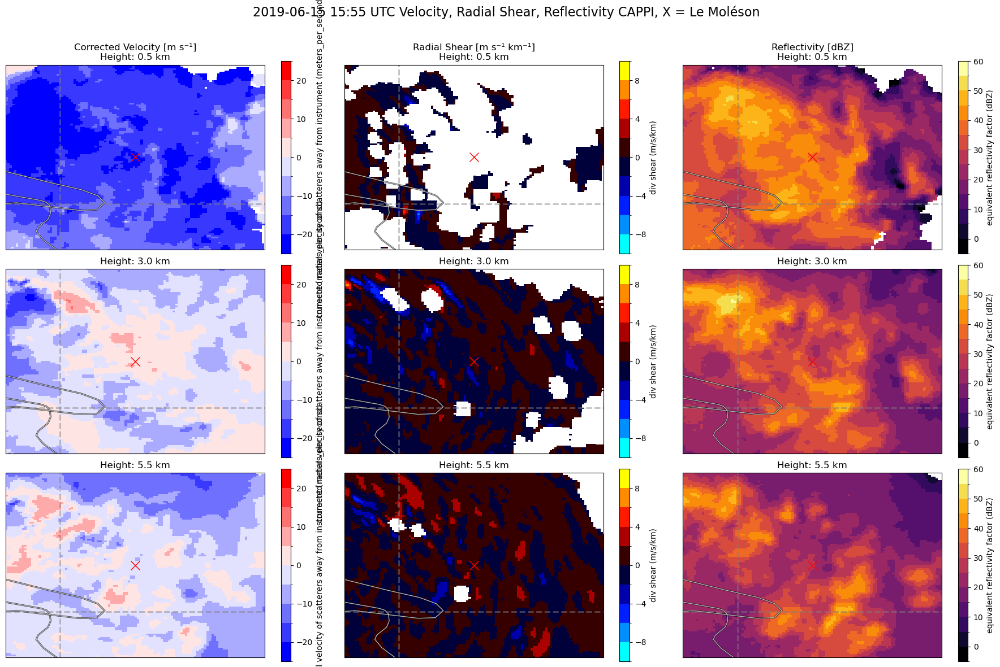

In [ ]:
# Moléson 1610
downburst_location = 'Moléson'
downburst_x = 567719
downburst_y = 155077
downburst_z = 1974

# Define the projection
projection = ccrs.epsg(3035)

# Convert Swiss coordinates to WGS84
wgs84 = converter.LV03toWGS84(downburst_x, downburst_y, downburst_z)
downburst_lat = wgs84[0]
downburst_lon = wgs84[1]

# Create the figure and subplots
fig = plt.figure(figsize=(18, 12))  # Increase figure height to accommodate three rows

# Define variable configurations: names, colormaps, levels, norms, and titles
variables = [
    ('corrected_velocity', cmap_velocity, velocity_levels, velocity_norm, 'Corrected Velocity [m s⁻¹]'),
    ('div_shear', cmap_div_shear, div_shear_levels, div_shear_norm, 'Radial Shear [m s⁻¹ km⁻¹]'),
    ('reflectivity', cmap_czc, czc_levels, czc_norm, 'Reflectivity [dBZ]')
]

# Define the levels for each row
levels = [0, 5, 10]

# Loop through rows and variables to create subplots
for row_idx, level in enumerate(levels):
    cappi_height = cappi_zh.z['data'][level] / 1000  # Convert height to km
    for col_idx, (var, cmap, levs, norm, title) in enumerate(variables):
        # Calculate subplot index
        subplot_idx = row_idx * len(variables) + col_idx + 1
        
        # Create subplot
        ax = plt.subplot(len(levels), len(variables), subplot_idx, projection=projection)
        
        # Plot the grid data
        display.plot_grid(
            var, level=level, ax=ax, projection=projection,
            cmap=cmap, norm=norm, vmin=levs[0], vmax=levs[-1],
            title=f"{title}\nHeight: {cappi_height:.1f} km" if row_idx == 0 else f"Height: {cappi_height:.1f} km"
        )
        
        # Highlight the downburst location
        ax.plot(downburst_lon, downburst_lat, marker='x', color='red', markersize=12, transform=ccrs.PlateCarree())
        
        # Set the map extent for all plots
        ax.set_extent([ downburst_lon-0.35 , downburst_lon+0.35, downburst_lat+0.25, downburst_lat-0.25], crs=ccrs.PlateCarree())
        
        # Add geographic features
        ax.add_feature(cfeature.BORDERS, edgecolor='black', linestyle='-', alpha=0.8, linewidth=2)
        ax.add_feature(cfeature.COASTLINE, edgecolor='black', alpha=0.8, linewidth=2)
        ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='none', alpha=0.8, linewidth=2)
        ax.add_feature(cfeature.BORDERS, edgecolor='white', linestyle='-', alpha=0.7)
        ax.add_feature(cfeature.COASTLINE, edgecolor='white', alpha=0.7)
        ax.add_feature(cfeature.LAKES, edgecolor='white', facecolor='none', alpha=0.7)
        
        # Remove axis labels and grid lines
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_yticklabels([])
        ax.set_xticklabels([])
        ax.set_xlabel('')
        ax.set_ylabel('')
        ax.grid(linestyle='-', color='black', alpha=0)




fig.suptitle("2019-06-15 " + valid_time3 + " UTC Velocity, Radial Shear, Reflectivity CAPPI, X = " + downburst_location, fontsize=16, ha='center')

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout for the title
#plt.savefig("/users/fackerma/newproject1/figures/first_case/" + radar_station + "CAPPI_" + valid_time3 + "_"+ downburst_location+ "_1.png", dpi=300)


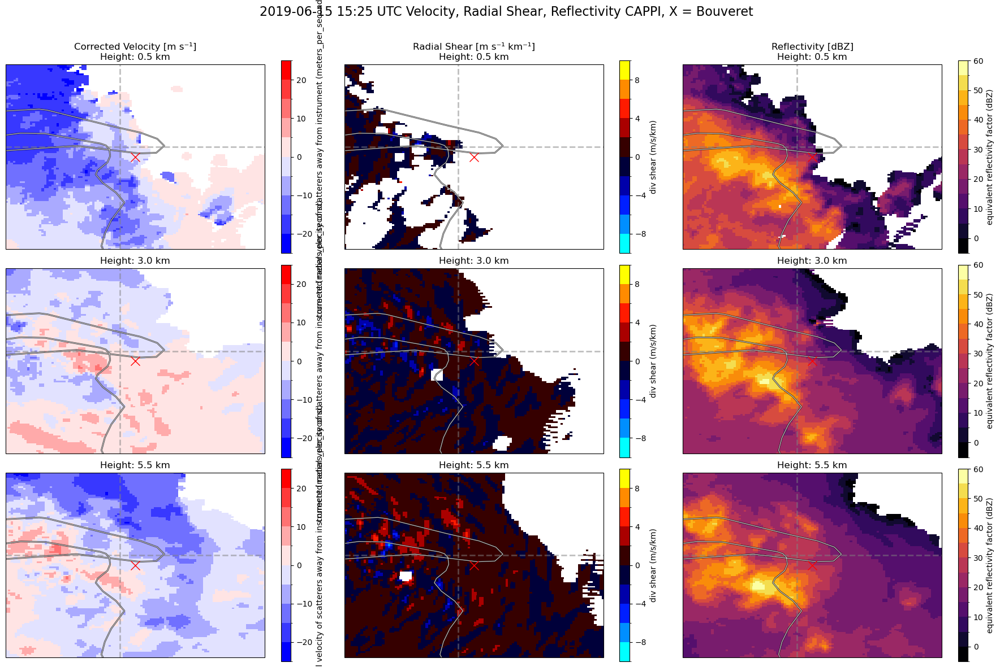

In [ ]:
# Bouveret 1540
downburst_location = 'Bouveret'
downburst_x = 555264
downburst_y = 138175
downburst_z = 374

# Define the projection
projection = ccrs.epsg(3035)

# Convert Swiss coordinates to WGS84
wgs84 = converter.LV03toWGS84(downburst_x, downburst_y, downburst_z)
downburst_lat = wgs84[0]
downburst_lon = wgs84[1]

# Create the figure and subplots
fig = plt.figure(figsize=(18, 12))  # Increase figure height to accommodate three rows

# Define variable configurations: names, colormaps, levels, norms, and titles
variables = [
    ('corrected_velocity', cmap_velocity, velocity_levels, velocity_norm, 'Corrected Velocity [m s⁻¹]'),
    ('div_shear', cmap_div_shear, div_shear_levels, div_shear_norm, 'Radial Shear [m s⁻¹ km⁻¹]'),
    ('reflectivity', cmap_czc, czc_levels, czc_norm, 'Reflectivity [dBZ]')
]

# Define the levels for each row
levels = [0, 5, 10]

# Loop through rows and variables to create subplots
for row_idx, level in enumerate(levels):
    cappi_height = cappi_zh.z['data'][level] / 1000  # Convert height to km
    for col_idx, (var, cmap, levs, norm, title) in enumerate(variables):
        # Calculate subplot index
        subplot_idx = row_idx * len(variables) + col_idx + 1
        
        # Create subplot
        ax = plt.subplot(len(levels), len(variables), subplot_idx, projection=projection)
        
        # Plot the grid data
        display.plot_grid(
            var, level=level, ax=ax, projection=projection,
            cmap=cmap, norm=norm, vmin=levs[0], vmax=levs[-1],
            title=f"{title}\nHeight: {cappi_height:.1f} km" if row_idx == 0 else f"Height: {cappi_height:.1f} km"
        )
        
        # Highlight the downburst location
        ax.plot(downburst_lon, downburst_lat, marker='x', color='red', markersize=12, transform=ccrs.PlateCarree())
        
        # Set the map extent for all plots
        ax.set_extent([ downburst_lon-0.35 , downburst_lon+0.35, downburst_lat+0.25, downburst_lat-0.25], crs=ccrs.PlateCarree())
        
        # Add geographic features
        ax.add_feature(cfeature.BORDERS, edgecolor='black', linestyle='-', alpha=0.8, linewidth=2)
        ax.add_feature(cfeature.COASTLINE, edgecolor='black', alpha=0.8, linewidth=2)
        ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='none', alpha=0.8, linewidth=2)
        ax.add_feature(cfeature.BORDERS, edgecolor='white', linestyle='-', alpha=0.7)
        ax.add_feature(cfeature.COASTLINE, edgecolor='white', alpha=0.7)
        ax.add_feature(cfeature.LAKES, edgecolor='white', facecolor='none', alpha=0.7)
        
        # Remove axis labels and grid lines
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_yticklabels([])
        ax.set_xticklabels([])
        ax.set_xlabel('')
        ax.set_ylabel('')
        ax.grid(linestyle='-', color='black', alpha=0)




fig.suptitle("2019-06-15 " + valid_time3 + " UTC Velocity, Radial Shear, Reflectivity CAPPI, X = " + downburst_location, fontsize=16, ha='center')

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout for the title
#plt.savefig("/users/fackerma/newproject1/figures/first_case/" + radar_station + "CAPPI_" + valid_time3 + "_"+ downburst_location+ "_1.png", dpi=300)


## Optical Flow

/scratch/mch/fackerma/orders/case_150619/CZC/CZC191661510VL.801
/scratch/mch/fackerma/orders/case_150619/CZC/CZC191661515VL.801
/scratch/mch/fackerma/orders/case_150619/CZC/CZC191661520VL.801
/scratch/mch/fackerma/orders/case_150619/CZC/CZC191661525VL.801
/scratch/mch/fackerma/orders/case_150619/CZC/CZC191661530VL.801
/scratch/mch/fackerma/orders/case_150619/CZC/CZC191661535VL.801
/scratch/mch/fackerma/orders/case_150619/CZC/CZC191661540VL.801
/scratch/mch/fackerma/orders/case_150619/CZC/CZC191661545VL.801
/scratch/mch/fackerma/orders/case_150619/CZC/CZC191661550VL.801
/scratch/mch/fackerma/orders/case_150619/CZC/CZC191661555VL.801
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0


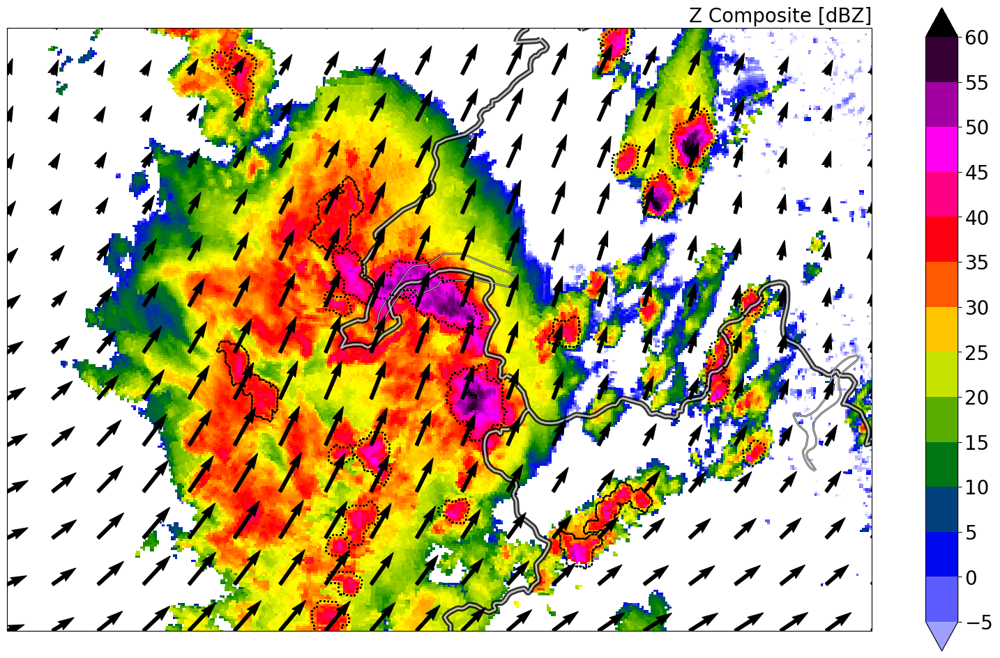

In [8]:
# Parameters for generating file paths
start_hour = int(valid_time3[:2])  # Extract the first two characters as the hour
start_time = int(valid_time3[2:])  # Extract the last two characters as the minutes
time_interval = 5  # Time interval between files in minutes
num_files = 10 

# Generate file paths dynamically based on the starting time and interval
file_paths = []
current_hour = start_hour
current_minute = start_time

for i in range(num_files):
    # Append the file path for the current time
    file_paths.append(
        f'/scratch/mch/fackerma/orders/case_150619/CZC/CZC19166{str(current_hour).zfill(2)}{str(current_minute).zfill(2)}VL.801'
    )
    # Update minutes and handle rollover to the next hour
    current_minute += time_interval
    if current_minute >= 60:
        current_minute -= 60
        current_hour += 1
        if current_hour >= 24:  # Handle 24-hour format rollover
            current_hour = 0

# Print file paths to verify
for path in file_paths:
    print(path)

# Initialize an empty list to hold the data arrays
czc_data_list = []

# Read the radar data and extract the data arrays
for file_path in file_paths:
    czc_data = radlib.read_file(file_path, physic_value=True)
    czc_data_list.append(czc_data.data)

# Stack the data into a 3D array with shape (t, x, y)
input_images = np.stack(czc_data_list, axis=0)
input_images = np.nan_to_num(input_images, nan=0.0, posinf=0.0, neginf=0.0)


# Compute motion field using Lucas-Kanade optical flow
#oflow = motion.lucaskanade.dense_lucaskanade(input_images)
oflow = motion.darts.DARTS(input_images, lsq_method=1)
#oflow = motion.proesmans.proesmans(input_images)

# Set the projection to EPSG:3035
projection = ccrs.epsg(3035)


# Extract u (horizontal) and v (vertical) motion components
u = oflow[0]
v = oflow[1]


# Create a figure with a single subplot
fig, ax = plt.subplots(figsize=(20, 12), subplot_kw={'projection': projection})

# Set background to black for the subplot
fig.patch.set_facecolor('white')  # Set figure background color
ax.set_facecolor('white')  # Set axis background color
edgecolor = 'black'

# Plot Reflectivity composite (czc)
cmap_czc = LinearSegmentedColormap.from_list("custom_cmap", ["white", "blue", "green", "yellow","red","magenta","black"], N=256)
#cmap_czc = plt.cm.inferno
#cmap_czc = plt.get_cmap('pyart_NWSRef')
cmap_czc.set_bad(color='grey')
p1 = ax.pcolormesh(clons, clats, czc, vmin=-10, vmax=60, 
                   cmap=cmap_czc, transform=projection)

# Add a colorbar
cbar1 = plt.colorbar(p1, ax=ax, extend='both', cmap=cmap_czc, norm=czc_norm, boundaries=czc_levels, ticks=czc_levels
                     )
cbar1.outline.set_edgecolor(edgecolor)
cbar1.ax.yaxis.set_tick_params(color=edgecolor)
plt.setp(plt.getp(cbar1.ax.axes, 'yticklabels'), color=edgecolor, fontsize=20)

# Set title for the plot
ax.set_title('Z Composite [dBZ]', color=edgecolor, loc='right', fontsize=20)
LakeGenevaLarge_extent = [4.2, 8.9, 45.1, 47.3]
ax.set_extent(LakeGenevaLarge_extent, crs=ccrs.PlateCarree())

# Add borders, coastlines, and lakes with custom contour lines
ax.add_feature(cfeature.BORDERS, edgecolor='black', linestyle='-', alpha=0.8, linewidth=6)
ax.add_feature(cfeature.COASTLINE, edgecolor='black', alpha=0.8, linewidth=2)
ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='none', alpha=0.8, linewidth=2)
ax.add_feature(cfeature.BORDERS, edgecolor='white', linestyle='-', alpha=0.7, linewidth=2)
ax.add_feature(cfeature.COASTLINE, edgecolor='white', alpha=0.7)
ax.add_feature(cfeature.LAKES, edgecolor='white', facecolor='none', alpha=0.7)

clons_adj = clons[:-1, :-1]
clats_adj = clats[:-1, :-1]

step = 20  # Adjust to reduce density of barbs
clons_down = clons_adj[::step, ::step]
clats_down = clats_adj[::step, ::step]
u_down = u[::step, ::step]
v_down = v[::step, ::step]

u_down = u_down
v_down = -v_down


#crs_proj = ccrs.epsg(3035)
#crs_target = ccrs.PlateCarree()
#u_down, v_down = crs_target.transform_vectors(crs_proj, clons_down, clats_down, u_down, v_down)


barbs = ax.quiver(
    clons_down, clats_down, u_down, v_down,
    transform=projection, 
    color='black', alpha=1, edgecolor='black', linewidth=1, zorder=20,
    #length=7, linewidth=1, 
    regrid_shape=14  # Adjust length and regrid_shape
)

from matplotlib.colors import to_rgba
lime_green_with_alpha = to_rgba("lime", alpha=0.5)
ax.contour(lon_trtc, lat_trtc, cells, levels=np.arange(0, 11), #colors=[lime_green_with_alpha],
           colors='black',
            alpha=1, linestyles='dotted', transform=ccrs.PlateCarree())



plt.savefig("/users/fackerma/newproject1/figures/first_case/OF/OF_" + valid_time3 + "_12" ".png", dpi=300)




## Custom plots

/scratch/mch/fackerma/orders/case_150619/CZC/CZC191661535VL.801
/scratch/mch/fackerma/orders/case_150619/CZC/CZC191661540VL.801
/scratch/mch/fackerma/orders/case_150619/CZC/CZC191661545VL.801
/scratch/mch/fackerma/orders/case_150619/CZC/CZC191661550VL.801
/scratch/mch/fackerma/orders/case_150619/CZC/CZC191661555VL.801
/scratch/mch/fackerma/orders/case_150619/CZC/CZC191661600VL.801
/scratch/mch/fackerma/orders/case_150619/CZC/CZC191661605VL.801
/scratch/mch/fackerma/orders/case_150619/CZC/CZC191661610VL.801
/scratch/mch/fackerma/orders/case_150619/CZC/CZC191661615VL.801
/scratch/mch/fackerma/orders/case_150619/CZC/CZC191661620VL.801
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0


/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pyart/aux_io/metranet_reader.py:925: UserWarning: Moment SNR not in file
  warn('Moment ' + momnames[i] + ' not in file')
/tmp/ipykernel_50046/3471013963.py:236: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers=pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_50046/3471013963.py:240: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n,'traj_ID']=int(t[0].values)
/tmp/ipykernel_50046/3471013963.py:241: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a

[46.47123377689653, 6.815059841190157, 456.35684832000004]


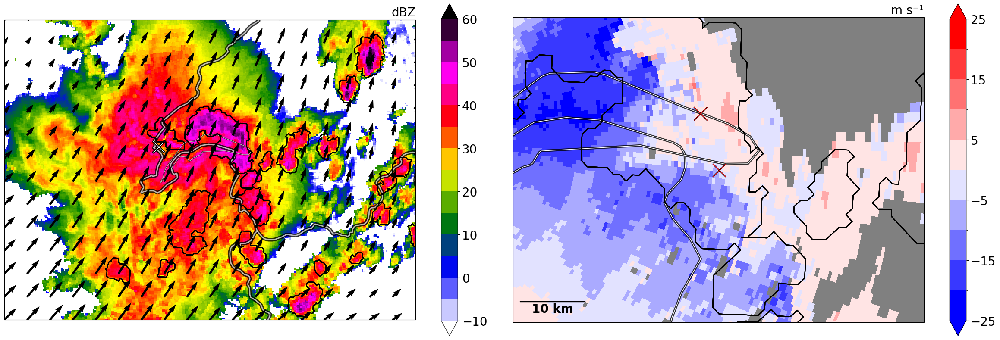

In [13]:
# Optical flow and divergence signature at 1535
cmap_czc = LinearSegmentedColormap.from_list("custom_cmap", ["white", "blue", "green", "yellow","red","magenta","black"], N=256)
czc_levels = np.arange(-10, 65, 5)  # Steps of 2 for Reflectivity
czc_norm = BoundaryNorm(boundaries=czc_levels, ncolors=256, clip=True)



# Parameters for generating file paths
start_hour = int(valid_time3[:2])  # Extract the first two characters as the hour
start_time = int(valid_time3[2:])  # Extract the last two characters as the minutes
time_interval = 5  # Time interval between files in minutes
num_files = 10 

# Generate file paths dynamically based on the starting time and interval
file_paths = []
current_hour = start_hour
current_minute = start_time

for i in range(num_files):
    # Append the file path for the current time
    file_paths.append(
        f'/scratch/mch/fackerma/orders/case_150619/CZC/CZC19166{str(current_hour).zfill(2)}{str(current_minute).zfill(2)}VL.801'
    )
    # Update minutes and handle rollover to the next hour
    current_minute += time_interval
    if current_minute >= 60:
        current_minute -= 60
        current_hour += 1
        if current_hour >= 24:  # Handle 24-hour format rollover
            current_hour = 0

# Print file paths to verify
for path in file_paths:
    print(path)

# Initialize an empty list to hold the data arrays
czc_data_list = []

# Read the radar data and extract the data arrays
for file_path in file_paths:
    czc_data = radlib.read_file(file_path, physic_value=True)
    czc_data_list.append(czc_data.data)

# Stack the data into a 3D array with shape (t, x, y)
input_images = np.stack(czc_data_list, axis=0)
input_images = np.nan_to_num(input_images, nan=0.0, posinf=0.0, neginf=0.0)


# Compute motion field using Lucas-Kanade optical flow
#oflow = motion.lucaskanade.dense_lucaskanade(input_images)
oflow = motion.darts.DARTS(input_images, lsq_method=1)
#oflow = motion.proesmans.proesmans(input_images)

# Set the projection to EPSG:3035
projection = ccrs.epsg(3035)


# Extract u (horizontal) and v (vertical) motion components
u = oflow[0]
v = oflow[1]


# Create a figure with a single subplot
fig, axes = plt.subplots(1,2, figsize=(24, 8), subplot_kw={'projection': projection})

ax = axes[0]
# Set background to black for the subplot
fig.patch.set_facecolor('white')  # Set figure background color
ax.set_facecolor('white')  # Set axis background color
edgecolor = 'black'

# Plot Reflectivity composite (czc)
cmap_czc = LinearSegmentedColormap.from_list("custom_cmap", ["white", "blue", "green", "yellow","red","magenta","black"], N=256)
#cmap_czc = plt.cm.inferno
#cmap_czc = plt.get_cmap('pyart_NWSRef')
cmap_czc.set_bad(color='grey')
p1 = ax.pcolormesh(clons, clats, czc, vmin=-10, vmax=60, 
                   cmap=cmap_czc, transform=projection, #norm=czc_norm 
                   )

# Add a colorbar
cbar1 = plt.colorbar(p1, ax=ax, extend='both', cmap=cmap_czc, norm=czc_norm, boundaries=czc_levels, ticks=czc_levels
                     , orientation='vertical')
cbar1.outline.set_edgecolor(edgecolor)
cbar1.ax.yaxis.set_tick_params(color=edgecolor)
plt.setp(plt.getp(cbar1.ax.axes, 'yticklabels'), color=edgecolor, fontsize=20)
cbar1.ax.tick_params(labelsize=20) 
ticks = cbar1.get_ticks()  # Get all ticks
cbar1.set_ticks(ticks[::2])
#cbar1.set_label("dBZ", fontsize=20)
# Set title for the plot
ax.set_title('dBZ', color=edgecolor, loc='right', fontsize=20)
LakeGenevaLarge_extent = [4.2+0.6, 8.9-0.5, 45.1+0.3, 47.3-0.13]
ax.set_extent(LakeGenevaLarge_extent, crs=ccrs.PlateCarree())
ax.plot(radar_lon, radar_lat, marker='x', color='white', markersize=20, transform=ccrs.PlateCarree(), path_effects=[path_effects.withStroke(linewidth=4, foreground='black')])
# Add borders, coastlines, and lakes with custom contour lines
ax.add_feature(cfeature.BORDERS, edgecolor='black', linestyle='-', alpha=0.8, linewidth=6)
ax.add_feature(cfeature.COASTLINE, edgecolor='black', alpha=0.8, linewidth=2)
ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='none', alpha=0.8, linewidth=2)
ax.add_feature(cfeature.BORDERS, edgecolor='white', linestyle='-', alpha=0.7, linewidth=2)
ax.add_feature(cfeature.COASTLINE, edgecolor='white', alpha=0.7)
ax.add_feature(cfeature.LAKES, edgecolor='white', facecolor='none', alpha=0.7)

clons_adj = clons[:-1, :-1]
clats_adj = clats[:-1, :-1]

step = 20  # Adjust to reduce density of barbs
clons_down = clons_adj[::step, ::step]
clats_down = clats_adj[::step, ::step]
u_down = u[::step, ::step]
v_down = v[::step, ::step]

u_down = u_down
v_down = -v_down


#crs_proj = ccrs.epsg(3035)
#crs_target = ccrs.PlateCarree()
#u_down, v_down = crs_target.transform_vectors(crs_proj, clons_down, clats_down, u_down, v_down)


barbs = ax.quiver(
    clons_down, clats_down, u_down, v_down,
    transform=projection, 
    color='black', alpha=1, edgecolor='black', linewidth=1, zorder=20,
    #length=7, linewidth=1, 
    regrid_shape=14  # Adjust length and regrid_shape
)


ax.contour(lon_trtc, lat_trtc, cells, levels=np.arange(0, 11), #colors=[lime_green_with_alpha],
           colors='black',
            alpha=1, #linestyles='dotted', 
            transform=ccrs.PlateCarree())





# Velocity at 15:35
valid_time3 = '1535'
elevation_scan = '3'
radar_station = 'D'
radar_name = 'La Dole'

# Load radar data
path = '/scratch/mch/fackerma/orders/case_150619'
file = glob.glob(path + '/MLD/ML' + radar_station + '19166' + valid_time3 + '0U.00' + elevation_scan) # ML data 
file2 = glob.glob(path +'/DVD/srn/data/tmp/mof/DV' + radar_station + '/DV' + radar_station + '19166' + valid_time3 + '7L.80' + elevation_scan) # Dealiased velocity
file3 = glob.glob(path +'/HZC/HZC19166' + valid_time3 + 'VL.801') # Freezing level height composite
file4 = glob.glob(path +'/VAD/VA' + radar_station + '19166' + valid_time3 + '7U.019') # Vertical wind profile above radar
file5 = glob.glob(path +'/BZC/BZC19166' + valid_time3 + 'VL.845') # POH
file6 = glob.glob(path +'/MZC/MZC19166' + valid_time3 + 'VL.850') # MESH
file7 = glob.glob(path +'/TRTC/CZC19166' + valid_time3 + '0T.trt') # Thunderstorm radar tracking; or .rdt .trt

# Read the data for the plots
data = pyart.aux_io.read_metranet(file[0], reader='python')
velocity = data.get_field(0, 'velocity').data
reflectivity = data.get_field(0, 'reflectivity').data
dv_data = pyart.aux_io.read_file_py(file2[0], physic_value=False)
dv_digital = dv_data.data
dv_header = dv_data.header
nyq = float(dv_header['nyquist'])
dv_velocity = transform_from_digital(dv_digital, nyq)


path_trtc = {"lomdata": "/scratch/mch/fackerma/orders/case_150619/"}  # Replace with your actual path
trt_df, cells_list, timelist = read_TRT(path_trtc, ttime=valid_time3)
# Extract the first element from the list of cells
cells = cells_list[0]
# Define Swiss CH1903 to WGS84 transformer
transformer_trtc = Transformer.from_crs("epsg:21781", "epsg:4326", always_xy=True)
# Grid dimensions and origin
o_x, o_y = 255000, -160000  # Origin in Swiss coordinates
lx, ly = 710, 640           # Grid size (width x height)
cell_size = 1000            # 1 km grid spacing
# Create Swiss grid (CH1903 coordinates)
x_coords = np.linspace(o_x, o_x + (lx - 1) * cell_size, lx)
y_coords = np.linspace(o_y, o_y + (ly - 1) * cell_size, ly)
x_grid, y_grid = np.meshgrid(x_coords, y_coords)
# Convert grid to WGS84 (longitude, latitude)
lon_trtc, lat_trtc = transformer_trtc.transform(x_grid, y_grid)
llsd_vel = llsd(vel=dv_velocity, az_min=3, az_max=90, w_k=2, r_k=2, resolution=0.5)

# Convergence line on 15:35, La Dole 3rd elevation scan
downburst_location = 'Bouveret'
downburst_x = 555264
downburst_y = 138175
downburst_z = 374

wgs84 = converter.LV03toWGS84(downburst_x, downburst_y, downburst_z)
downburst_lat = wgs84[0]
downburst_lon = wgs84[1]

# hightemp Vevey 1530
downburst_location = 'Vevey'
downburst_x = 552106
downburst_y = 146847
downburst_z = 405

wgs84 = converter.LV03toWGS84(downburst_x, downburst_y, downburst_z)
print(wgs84)
vevey_lat = wgs84[0]
vevey_lon = wgs84[1]

edgecolor = 'black'

# Convergence line
ax = axes[1]
ax.set_facecolor('white')  # Set axis background
ax.set_extent([downburst_lon - 0.4, downburst_lon + 0.4, downburst_lat -0.2, downburst_lat + 0.2], 
                  crs=ccrs.PlateCarree())
cmap_velocity.set_bad(color='grey')
p2 = ax.pcolormesh(lons, lats, dv_velocity, cmap=cmap_velocity, norm=velocity_norm, transform=ccrs.PlateCarree())
cbar2 = plt.colorbar(p2, ax=ax, cmap=cmap_velocity, extend='both', boundaries=velocity_levels, ticks=velocity_levels, orientation='vertical')
cbar2.outline.set_edgecolor(edgecolor)
cbar2.ax.yaxis.set_tick_params(color=edgecolor)
cbar2.ax.tick_params(labelsize=20) 
plt.setp(plt.getp(cbar2.ax.axes, 'yticklabels'), color=edgecolor)
ax.set_title('m s⁻¹', color=edgecolor, loc='right', fontsize=20)
ax.plot(downburst_lon, downburst_lat, marker='x', color='red', markersize=22, transform=ccrs.PlateCarree(), path_effects=[path_effects.withStroke(linewidth=2, foreground='black')])
ax.plot(vevey_lon, vevey_lat, marker='x', color='red', markersize=22, transform=ccrs.PlateCarree(), path_effects=[path_effects.withStroke(linewidth=2, foreground='black')])
ax.add_feature(cfeature.BORDERS, edgecolor='black', linestyle='-', alpha=0.8, linewidth=4)
ax.add_feature(cfeature.COASTLINE, edgecolor='black', alpha=0.8, linewidth=4)
ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='none', alpha=0.8, linewidth=4)
ax.add_feature(cfeature.BORDERS, edgecolor='white', linestyle='-', alpha=1)
ax.add_feature(cfeature.COASTLINE, edgecolor='white', alpha=1)
ax.add_feature(cfeature.LAKES, edgecolor='white', facecolor='none', alpha=1)
ax.contour(lon_trtc, lat_trtc, cells, levels=np.arange(0, 11), #colors=[lime_green_with_alpha],
           colors='black',
            alpha=1, #linestyles='dotted', 
            transform=ccrs.PlateCarree())

ticks = cbar2.get_ticks()  # Get all ticks
cbar2.set_ticks(ticks[::2])
#cbar2.set_label("[m s⁻¹]", fontsize=20)

from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.font_manager as fm

# Define the size of the size bar (in map units, e.g., meters)
size_bar_length = 10000  # 10 km in meters (adjust as needed)
size_bar_text = '10 km'  # Text to display next to the size bar

# Create the size bar font
size_bar_font = fm.FontProperties(size=20, weight='bold')

# Add size bar to the first plot
size_bar_ax1 = AnchoredSizeBar(
    axes[1].transData,  # Transformation for positioning
    size_bar_length,    # Length of the size bar
    size_bar_text,      # Label for the size bar
    loc='lower left',   # Location on the plot
    pad=0.5,            # Padding around the bar
    color='black',      # Color of the size bar
    frameon=False,      # No frame around the bar
    size_vertical=50,   # Thickness of the bar
    fontproperties=size_bar_font  # Font properties for the label
)
axes[1].add_artist(size_bar_ax1)  # Add the size bar to the first axis

plt.tight_layout()

#plt.savefig("/users/fackerma/newproject1/figures/first_case/Z_OF_Vel_" + valid_time3 + "_15" ".png", dpi=300)




/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pyart/aux_io/metranet_reader.py:925: UserWarning: Moment SNR not in file
  warn('Moment ' + momnames[i] + ' not in file')


py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
swap product table data ......
py_decoder DBG verb=0
py_decoder DBG verbl=0


/tmp/ipykernel_119772/3471013963.py:236: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers=pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_119772/3471013963.py:240: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n,'traj_ID']=int(t[0].values)
/tmp/ipykernel_119772/3471013963.py:241: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n,'time']=int(t[1].values)
/tmp/ipykernel_119772/3471013963.py:261: DeprecationWarning: Co

py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
swap product table data ......
py_decoder DBG verb=0
py_decoder DBG verbl=0


/tmp/ipykernel_119772/3471013963.py:236: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers=pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_119772/3471013963.py:240: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n,'traj_ID']=int(t[0].values)
/tmp/ipykernel_119772/3471013963.py:241: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n,'time']=int(t[1].values)
/tmp/ipykernel_119772/3471013963.py:261: DeprecationWarning: Co

py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
swap product table data ......
py_decoder DBG verb=0
py_decoder DBG verbl=0


/tmp/ipykernel_119772/3471013963.py:236: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers=pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_119772/3471013963.py:240: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n,'traj_ID']=int(t[0].values)
/tmp/ipykernel_119772/3471013963.py:241: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n,'time']=int(t[1].values)
/tmp/ipykernel_119772/3471013963.py:261: DeprecationWarning: Co

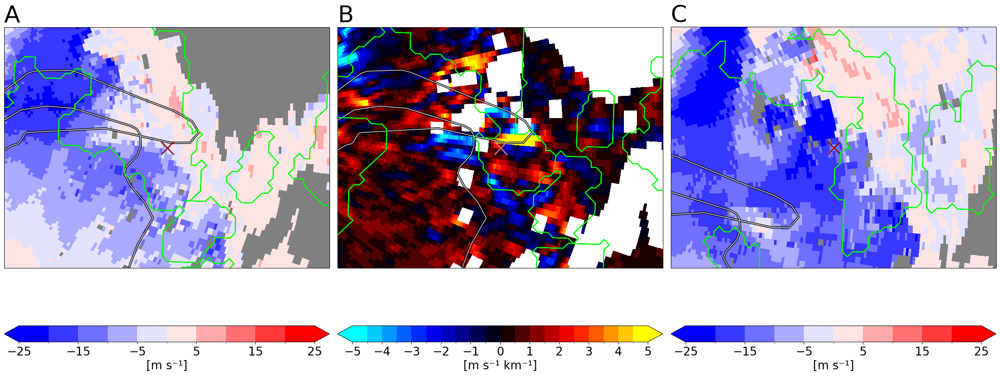

In [ ]:
# 1535 vel, 1540 azimuthal shear, 1540 vel 
projection = ccrs.epsg(3035)
fig, axes = plt.subplots(1, 3, subplot_kw={'projection': projection}, figsize=(24, 9.5))
from matplotlib.colors import to_rgba
lime_green_with_alpha = to_rgba("lime", alpha=0.5)

# Velocity at 15:35
valid_time3 = '1535'
elevation_scan = '3'
radar_station = 'D'
radar_name = 'La Dole'

# Load radar data
path = '/scratch/mch/fackerma/orders/case_150619'
file = glob.glob(path + '/MLD/ML' + radar_station + '19166' + valid_time3 + '0U.00' + elevation_scan) # ML data 
file2 = glob.glob(path +'/DVD/srn/data/tmp/mof/DV' + radar_station + '/DV' + radar_station + '19166' + valid_time3 + '7L.80' + elevation_scan) # Dealiased velocity
file3 = glob.glob(path +'/HZC/HZC19166' + valid_time3 + 'VL.801') # Freezing level height composite
file4 = glob.glob(path +'/VAD/VA' + radar_station + '19166' + valid_time3 + '7U.019') # Vertical wind profile above radar
file5 = glob.glob(path +'/BZC/BZC19166' + valid_time3 + 'VL.845') # POH
file6 = glob.glob(path +'/MZC/MZC19166' + valid_time3 + 'VL.850') # MESH
file7 = glob.glob(path +'/TRTC/CZC19166' + valid_time3 + '0T.trt') # Thunderstorm radar tracking; or .rdt .trt
file8 = glob.glob(path +'/CZC/CZC19166' + valid_time3 + 'VL.801') # Reflectivity composite
file9 = glob.glob(path +'/LZC/LZC19166' + valid_time3 + 'VL.801') # VIL composite
file10 = glob.glob(path +'/EZC/EZC19166' + valid_time3 + 'VL.820') # Echotops composite: 815, 820, 845, 850
file11 = glob.glob(path +'/OZC/OZC19166' + valid_time3 + 'VL.830') # CAPPI composite, ranging from 810 to 980 in steps of 10

# Read the data for the plots
data = pyart.aux_io.read_metranet(file[0], reader='python')
velocity = data.get_field(0, 'velocity').data
reflectivity = data.get_field(0, 'reflectivity').data
dv_data = pyart.aux_io.read_file_py(file2[0], physic_value=False)
dv_digital = dv_data.data
dv_header = dv_data.header
nyq = float(dv_header['nyquist'])
dv_velocity = transform_from_digital(dv_digital, nyq)
hzc_data = radlib.read_file(file3[0],physic_value=True)
hzc=hzc_data.data
dARC_data = radlib.read_file(file12[0],physic_value=True)
dARC=dARC_data.data
dBZC_data = radlib.read_file(file13[0],physic_value=True)
dBZC=dBZC_data.data
dRZC_data = radlib.read_file(file14[0],physic_value=True)
dRZC=dRZC_data.data
dCZC_data = radlib.read_file(file15[0],physic_value=True)
dCZC=dCZC_data.data
diff_reflectivity = data.get_field(0, 'differential_reflectivity').data
diff_phase = data.get_field(0, 'uncorrected_differential_phase').data
cc_ratio = data.get_field(0, 'uncorrected_cross_correlation_ratio').data
mzc_data = radlib.read_file(file6[0],physic_value=True)
mzc=mzc_data.data
bzc_data = radlib.read_file(file5[0],physic_value=True)
bzc=bzc_data.data
specw = data.get_field(0, 'spectrum_width').data
czc_data = radlib.read_file(file8[0],physic_value=True)
czc=czc_data.data
lzc_data = radlib.read_file(file9[0],physic_value=True)
lzc=lzc_data.data
ezc_data = radlib.read_file(file10[0],physic_value=True)
ezc=ezc_data.data
ozc_data = radlib.read_file(file11[0],physic_value=True)
ozc=ozc_data.data


path_trtc = {"lomdata": "/scratch/mch/fackerma/orders/case_150619/"}  # Replace with your actual path
trt_df, cells_list, timelist = read_TRT(path_trtc, ttime=valid_time3)
# Extract the first element from the list of cells
cells = cells_list[0]
# Define Swiss CH1903 to WGS84 transformer
transformer_trtc = Transformer.from_crs("epsg:21781", "epsg:4326", always_xy=True)
# Grid dimensions and origin
o_x, o_y = 255000, -160000  # Origin in Swiss coordinates
lx, ly = 710, 640           # Grid size (width x height)
cell_size = 1000            # 1 km grid spacing
# Create Swiss grid (CH1903 coordinates)
x_coords = np.linspace(o_x, o_x + (lx - 1) * cell_size, lx)
y_coords = np.linspace(o_y, o_y + (ly - 1) * cell_size, ly)
x_grid, y_grid = np.meshgrid(x_coords, y_coords)
# Convert grid to WGS84 (longitude, latitude)
lon_trtc, lat_trtc = transformer_trtc.transform(x_grid, y_grid)
llsd_vel = llsd(vel=dv_velocity, az_min=3, az_max=90, w_k=2, r_k=2, resolution=0.5)

# Convergence line on 15:35, La Dole 3rd elevation scan
downburst_location = 'Bouveret'
downburst_x = 555264
downburst_y = 138175
downburst_z = 374
edgecolor = 'black'
wgs84 = converter.LV03toWGS84(downburst_x, downburst_y, downburst_z)
downburst_lat = wgs84[0]
downburst_lon = wgs84[1]


# Convergence line
ax = axes[0]
ax.set_facecolor('white')  # Set axis background
ax.set_extent([downburst_lon - 0.4, downburst_lon + 0.4, downburst_lat -0.2, downburst_lat + 0.2], 
                  crs=ccrs.PlateCarree())
cmap_velocity.set_bad(color='grey')
p2 = ax.pcolormesh(lons, lats, dv_velocity, cmap=cmap_velocity, norm=velocity_norm, transform=ccrs.PlateCarree())
cbar2 = plt.colorbar(p2, ax=ax, cmap=cmap_velocity, extend='both', boundaries=velocity_levels, ticks=velocity_levels, orientation='horizontal')
cbar2.outline.set_edgecolor(edgecolor)
cbar2.ax.yaxis.set_tick_params(color=edgecolor)
cbar2.ax.tick_params(labelsize=20) 
plt.setp(plt.getp(cbar2.ax.axes, 'yticklabels'), color=edgecolor)
ax.set_title('A', color=edgecolor, loc='left', fontsize=40)
ax.plot(downburst_lon, downburst_lat, marker='x', color='red', markersize=22, transform=ccrs.PlateCarree(), path_effects=[path_effects.withStroke(linewidth=2, foreground='black')])
ax.add_feature(cfeature.BORDERS, edgecolor='black', linestyle='-', alpha=0.8, linewidth=4)
ax.add_feature(cfeature.COASTLINE, edgecolor='black', alpha=0.8, linewidth=4)
ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='none', alpha=0.8, linewidth=4)
ax.add_feature(cfeature.BORDERS, edgecolor='white', linestyle='-', alpha=1)
ax.add_feature(cfeature.COASTLINE, edgecolor='white', alpha=1)
ax.add_feature(cfeature.LAKES, edgecolor='white', facecolor='none', alpha=1)
ax.contour(lon_trtc, lat_trtc, cells, levels=np.arange(0, 11), colors=[lime_green_with_alpha], alpha=0.5, transform=ccrs.PlateCarree())
ticks = cbar2.get_ticks()  # Get all ticks
cbar2.set_ticks(ticks[::2])
cbar2.set_label("[m s⁻¹]", fontsize=20)

# Azimuthal shear at 15:40
valid_time3 = '1540'
elevation_scan = '3'
radar_station = 'D'
radar_name = 'La Dole'

# Load radar data
path = '/scratch/mch/fackerma/orders/case_150619'
file = glob.glob(path + '/MLD/ML' + radar_station + '19166' + valid_time3 + '0U.00' + elevation_scan) # ML data 
file2 = glob.glob(path +'/DVD/srn/data/tmp/mof/DV' + radar_station + '/DV' + radar_station + '19166' + valid_time3 + '7L.80' + elevation_scan) # Dealiased velocity
file3 = glob.glob(path +'/HZC/HZC19166' + valid_time3 + 'VL.801') # Freezing level height composite
file4 = glob.glob(path +'/VAD/VA' + radar_station + '19166' + valid_time3 + '7U.019') # Vertical wind profile above radar
file5 = glob.glob(path +'/BZC/BZC19166' + valid_time3 + 'VL.845') # POH
file6 = glob.glob(path +'/MZC/MZC19166' + valid_time3 + 'VL.850') # MESH
file7 = glob.glob(path +'/TRTC/CZC19166' + valid_time3 + '0T.trt') # Thunderstorm radar tracking; or .rdt .trt
file8 = glob.glob(path +'/CZC/CZC19166' + valid_time3 + 'VL.801') # Reflectivity composite
file9 = glob.glob(path +'/LZC/LZC19166' + valid_time3 + 'VL.801') # VIL composite
file10 = glob.glob(path +'/EZC/EZC19166' + valid_time3 + 'VL.820') # Echotops composite: 815, 820, 845, 850
file11 = glob.glob(path +'/OZC/OZC19166' + valid_time3 + 'VL.830') # CAPPI composite, ranging from 810 to 980 in steps of 10


# Read the data for the plots
data = pyart.aux_io.read_metranet(file[0], reader='python')
velocity = data.get_field(0, 'velocity').data
reflectivity = data.get_field(0, 'reflectivity').data
dv_data = pyart.aux_io.read_file_py(file2[0], physic_value=False)
dv_digital = dv_data.data
dv_header = dv_data.header
nyq = float(dv_header['nyquist'])
dv_velocity = transform_from_digital(dv_digital, nyq)
hzc_data = radlib.read_file(file3[0],physic_value=True)
hzc=hzc_data.data
dARC_data = radlib.read_file(file12[0],physic_value=True)
dARC=dARC_data.data
dBZC_data = radlib.read_file(file13[0],physic_value=True)
dBZC=dBZC_data.data
dRZC_data = radlib.read_file(file14[0],physic_value=True)
dRZC=dRZC_data.data
dCZC_data = radlib.read_file(file15[0],physic_value=True)
dCZC=dCZC_data.data
diff_reflectivity = data.get_field(0, 'differential_reflectivity').data
diff_phase = data.get_field(0, 'uncorrected_differential_phase').data
cc_ratio = data.get_field(0, 'uncorrected_cross_correlation_ratio').data
mzc_data = radlib.read_file(file6[0],physic_value=True)
mzc=mzc_data.data
bzc_data = radlib.read_file(file5[0],physic_value=True)
bzc=bzc_data.data
specw = data.get_field(0, 'spectrum_width').data
czc_data = radlib.read_file(file8[0],physic_value=True)
czc=czc_data.data
lzc_data = radlib.read_file(file9[0],physic_value=True)
lzc=lzc_data.data
ezc_data = radlib.read_file(file10[0],physic_value=True)
ezc=ezc_data.data
ozc_data = radlib.read_file(file11[0],physic_value=True)
ozc=ozc_data.data


path_trtc = {"lomdata": "/scratch/mch/fackerma/orders/case_150619/"}  # Replace with your actual path
trt_df, cells_list, timelist = read_TRT(path_trtc, ttime=valid_time3)
# Extract the first element from the list of cells
cells = cells_list[0]
# Define Swiss CH1903 to WGS84 transformer
transformer_trtc = Transformer.from_crs("epsg:21781", "epsg:4326", always_xy=True)
# Grid dimensions and origin
o_x, o_y = 255000, -160000  # Origin in Swiss coordinates
lx, ly = 710, 640           # Grid size (width x height)
cell_size = 1000            # 1 km grid spacing
# Create Swiss grid (CH1903 coordinates)
x_coords = np.linspace(o_x, o_x + (lx - 1) * cell_size, lx)
y_coords = np.linspace(o_y, o_y + (ly - 1) * cell_size, ly)
x_grid, y_grid = np.meshgrid(x_coords, y_coords)
# Convert grid to WGS84 (longitude, latitude)
lon_trtc, lat_trtc = transformer_trtc.transform(x_grid, y_grid)
llsd_vel = llsd(vel=dv_velocity, az_min=3, az_max=90, w_k=2, r_k=2, resolution=0.5)


# Convergence line
ax = axes[1]
ax.set_facecolor('white')  # Set axis background
ax.set_extent([downburst_lon - 0.4, downburst_lon + 0.4, downburst_lat -0.2, downburst_lat + 0.2], 
                  crs=ccrs.PlateCarree())
cmap_velocity.set_bad(color='grey')
p2 = ax.pcolormesh(lons, lats, llsd_vel[0], cmap=cmap_az_shear, norm=az_shear_norm, transform=ccrs.PlateCarree())
cbar2 = plt.colorbar(p2, ax=ax, cmap=cmap_az_shear, extend='both', boundaries=az_shear_levels, ticks=az_shear_levels, orientation='horizontal')
cbar2.outline.set_edgecolor(edgecolor)
cbar2.ax.yaxis.set_tick_params(color=edgecolor)
cbar2.ax.tick_params(labelsize=20) 
plt.setp(plt.getp(cbar2.ax.axes, 'yticklabels'), color=edgecolor)
ax.set_title('B', color=edgecolor, loc='left', fontsize=40)
ax.plot(downburst_lon, downburst_lat, marker='x', color='red', markersize=22, transform=ccrs.PlateCarree(), path_effects=[path_effects.withStroke(linewidth=2, foreground='white')])
ax.add_feature(cfeature.BORDERS, edgecolor='black', linestyle='-', alpha=0.8, linewidth=4)
ax.add_feature(cfeature.COASTLINE, edgecolor='black', alpha=0.8, linewidth=4)
ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='none', alpha=0.8, linewidth=4)
ax.add_feature(cfeature.BORDERS, edgecolor='white', linestyle='-', alpha=1)
ax.add_feature(cfeature.COASTLINE, edgecolor='white', alpha=1)
ax.add_feature(cfeature.LAKES, edgecolor='white', facecolor='none', alpha=1)
ax.contour(lon_trtc, lat_trtc, cells, levels=np.arange(0, 11), colors=[lime_green_with_alpha], alpha=0.5, transform=ccrs.PlateCarree())
ticks = cbar2.get_ticks()  # Get all ticks
cbar2.set_ticks(ticks[::2])
cbar2.set_label("[m s⁻¹ km⁻¹]", fontsize=20)


# Velocity at 16:00
valid_time3 = '1600'
elevation_scan = '3'
radar_station = 'D'
radar_name = 'La Dole'

# Load radar data
path = '/scratch/mch/fackerma/orders/case_150619'
file = glob.glob(path + '/MLD/ML' + radar_station + '19166' + valid_time3 + '0U.00' + elevation_scan) # ML data 
file2 = glob.glob(path +'/DVD/srn/data/tmp/mof/DV' + radar_station + '/DV' + radar_station + '19166' + valid_time3 + '7L.80' + elevation_scan) # Dealiased velocity
file3 = glob.glob(path +'/HZC/HZC19166' + valid_time3 + 'VL.801') # Freezing level height composite
file4 = glob.glob(path +'/VAD/VA' + radar_station + '19166' + valid_time3 + '7U.019') # Vertical wind profile above radar
file5 = glob.glob(path +'/BZC/BZC19166' + valid_time3 + 'VL.845') # POH
file6 = glob.glob(path +'/MZC/MZC19166' + valid_time3 + 'VL.850') # MESH
file7 = glob.glob(path +'/TRTC/CZC19166' + valid_time3 + '0T.trt') # Thunderstorm radar tracking; or .rdt .trt
file8 = glob.glob(path +'/CZC/CZC19166' + valid_time3 + 'VL.801') # Reflectivity composite
file9 = glob.glob(path +'/LZC/LZC19166' + valid_time3 + 'VL.801') # VIL composite
file10 = glob.glob(path +'/EZC/EZC19166' + valid_time3 + 'VL.820') # Echotops composite: 815, 820, 845, 850
file11 = glob.glob(path +'/OZC/OZC19166' + valid_time3 + 'VL.830') # CAPPI composite, ranging from 810 to 980 in steps of 10


# Read the data for the plots
data = pyart.aux_io.read_metranet(file[0], reader='python')
velocity = data.get_field(0, 'velocity').data
reflectivity = data.get_field(0, 'reflectivity').data
dv_data = pyart.aux_io.read_file_py(file2[0], physic_value=False)
dv_digital = dv_data.data
dv_header = dv_data.header
nyq = float(dv_header['nyquist'])
dv_velocity = transform_from_digital(dv_digital, nyq)
hzc_data = radlib.read_file(file3[0],physic_value=True)
hzc=hzc_data.data
dARC_data = radlib.read_file(file12[0],physic_value=True)
dARC=dARC_data.data
dBZC_data = radlib.read_file(file13[0],physic_value=True)
dBZC=dBZC_data.data
dRZC_data = radlib.read_file(file14[0],physic_value=True)
dRZC=dRZC_data.data
dCZC_data = radlib.read_file(file15[0],physic_value=True)
dCZC=dCZC_data.data
diff_reflectivity = data.get_field(0, 'differential_reflectivity').data
diff_phase = data.get_field(0, 'uncorrected_differential_phase').data
cc_ratio = data.get_field(0, 'uncorrected_cross_correlation_ratio').data
mzc_data = radlib.read_file(file6[0],physic_value=True)
mzc=mzc_data.data
bzc_data = radlib.read_file(file5[0],physic_value=True)
bzc=bzc_data.data
specw = data.get_field(0, 'spectrum_width').data
czc_data = radlib.read_file(file8[0],physic_value=True)
czc=czc_data.data
lzc_data = radlib.read_file(file9[0],physic_value=True)
lzc=lzc_data.data
ezc_data = radlib.read_file(file10[0],physic_value=True)
ezc=ezc_data.data
ozc_data = radlib.read_file(file11[0],physic_value=True)
ozc=ozc_data.data


path_trtc = {"lomdata": "/scratch/mch/fackerma/orders/case_150619/"}  # Replace with your actual path
trt_df, cells_list, timelist = read_TRT(path_trtc, ttime=valid_time3)
# Extract the first element from the list of cells
cells = cells_list[0]
# Define Swiss CH1903 to WGS84 transformer
transformer_trtc = Transformer.from_crs("epsg:21781", "epsg:4326", always_xy=True)
# Grid dimensions and origin
o_x, o_y = 255000, -160000  # Origin in Swiss coordinates
lx, ly = 710, 640           # Grid size (width x height)
cell_size = 1000            # 1 km grid spacing
# Create Swiss grid (CH1903 coordinates)
x_coords = np.linspace(o_x, o_x + (lx - 1) * cell_size, lx)
y_coords = np.linspace(o_y, o_y + (ly - 1) * cell_size, ly)
x_grid, y_grid = np.meshgrid(x_coords, y_coords)
# Convert grid to WGS84 (longitude, latitude)
lon_trtc, lat_trtc = transformer_trtc.transform(x_grid, y_grid)
llsd_vel = llsd(vel=dv_velocity, az_min=3, az_max=90, w_k=2, r_k=2, resolution=0.5)

# Convergence line on 15:35, La Dole 3rd elevation scan
downburst_location = 'Moléson'
downburst_x = 567719
downburst_y = 155077
downburst_z = 1974
edgecolor = 'black'
wgs84 = converter.LV03toWGS84(downburst_x, downburst_y, downburst_z)
downburst_lat = wgs84[0]
downburst_lon = wgs84[1]


# Convergence line
ax = axes[2]
ax.set_facecolor('white')  # Set axis background
ax.set_extent([downburst_lon - 0.4, downburst_lon + 0.4, downburst_lat -0.2, downburst_lat + 0.2], 
                  crs=ccrs.PlateCarree())
cmap_velocity.set_bad(color='grey')
p2 = ax.pcolormesh(lons, lats, dv_velocity, cmap=cmap_velocity, norm=velocity_norm, transform=ccrs.PlateCarree())
cbar2 = plt.colorbar(p2, ax=ax, cmap=cmap_velocity, extend='both', boundaries=velocity_levels, ticks=velocity_levels, orientation='horizontal')
cbar2.outline.set_edgecolor(edgecolor)
cbar2.ax.yaxis.set_tick_params(color=edgecolor)
cbar2.ax.tick_params(labelsize=20) 
plt.setp(plt.getp(cbar2.ax.axes, 'yticklabels'), color=edgecolor)
ax.set_title('C', color=edgecolor, loc='left', fontsize=40)
ax.plot(downburst_lon, downburst_lat, marker='x', color='red', markersize=22, transform=ccrs.PlateCarree(), path_effects=[path_effects.withStroke(linewidth=2, foreground='black')])
ax.add_feature(cfeature.BORDERS, edgecolor='black', linestyle='-', alpha=0.8, linewidth=4)
ax.add_feature(cfeature.COASTLINE, edgecolor='black', alpha=0.8, linewidth=4)
ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='none', alpha=0.8, linewidth=4)
ax.add_feature(cfeature.BORDERS, edgecolor='white', linestyle='-', alpha=1)
ax.add_feature(cfeature.COASTLINE, edgecolor='white', alpha=1)
ax.add_feature(cfeature.LAKES, edgecolor='white', facecolor='none', alpha=1)
ax.contour(lon_trtc, lat_trtc, cells, levels=np.arange(0, 11), colors=[lime_green_with_alpha], alpha=0.5, transform=ccrs.PlateCarree())
ticks = cbar2.get_ticks()  # Get all ticks
cbar2.set_ticks(ticks[::2])
cbar2.set_label("[m s⁻¹]", fontsize=20)

plt.tight_layout()

#plt.savefig("/users/fackerma/newproject1/figures/first_case/vel_azshear_2.png", dpi=300)

In [10]:
# Prepare the Half scnas of the Bouveret RHI 1531: 1540 -5 first scan
downburst_location = 'Bouveret'
downburst_x = 555264
downburst_y = 138175
downburst_z = 374

if radar_station == 'D':
    rhi_close = 0
    rhi_distance = 100
else:
    rhi_distance = 150
    rhi_close = 0

# Define time intervals: x minutes before, and the exact time
time_deltas = [-5]  # minutes
first_scan = ['001', '003', '005', '007', '009', '011', '013', '015', '017', '019']
second_scan = ['002', '004', '006', '008', '010', '012', '014', '016', '018', '020']

wgs84 = converter.LV03toWGS84(downburst_x, downburst_y, downburst_z)
print(wgs84)
downburst_lat = wgs84[0]
downburst_lon = wgs84[1]

radar_coords = (radar_lat, radar_lon)
downburst_coords = (downburst_lat, downburst_lon)
downburst_distance = geopy.distance.geodesic(radar_coords, downburst_coords).km

# Calculate azimuth
azimuth_to_downburst = calculate_azimuth(radar_lat, radar_lon, downburst_lat, downburst_lon)
print(f"Azimuth angle to downburst occurrence: {azimuth_to_downburst:.2f} degrees")

# Convert valid_time3 to a datetime object
base_time = datetime.strptime(valid_time3, "%H%M")

div_shear_levels = np.arange(-5,5.5,0.5)
div_shear_norm = BoundaryNorm(boundaries=div_shear_levels, ncolors=256, clip=True)


for index, delta in enumerate(time_deltas):
    # Calculate the time for this row
    current_time = (base_time + timedelta(minutes=delta)).strftime("%H%M")
    print(f"Looking for files with time: {current_time}")
    
    # Check what files are available in the directory
    files_rhi = sorted(glob.glob(f"{path}/MLD/ML{radar_station}19166{current_time}*"))
    print(f"Files found for time {current_time}: {files_rhi}")

    # Separate the files into two lists
    file_rhi_first_scan = []
    file_rhi_second_scan = []

    for file in files_rhi:
        # Extract the elevation scan number (last two digits before the file extension)
        elevation_scan = file.split('.')[-1]

        if elevation_scan in first_scan:
            file_rhi_first_scan.append(file)
        elif elevation_scan in second_scan:
            file_rhi_second_scan.append(file)


    # Merge radar data for first scan
    radar_merged_first_scan = None
    for i, f in enumerate(file_rhi_first_scan):
        radar = pyart.aux_io.read_metranet(f)
        if i == 0:
            radar_merged_first_scan = radar
        else:
            radar_merged_first_scan = pyart.util.join_radar(radar_merged_first_scan, radar)

    # Merge radar data for second scan  
    radar_merged_second_scan = None
    for i, f in enumerate(file_rhi_second_scan):
        radar = pyart.aux_io.read_metranet(f)
        if i == 0:
            radar_merged_second_scan = radar
        else:
            radar_merged_second_scan = pyart.util.join_radar(radar_merged_second_scan, radar)

    # Perform dealiasing
    #corr_vel = pyart.correct.dealias_region_based(radar_merged)
    corr_vel_first_scan = pyart.correct.dealias_region_based(radar_merged_first_scan)
    corr_vel_second_scan = pyart.correct.dealias_region_based(radar_merged_second_scan)

    # Add 'corrected_velocity' field if it doesn't already exist
    if 'corrected_velocity' not in radar_merged_first_scan.fields:
        radar_merged_first_scan.add_field('corrected_velocity', corr_vel_first_scan)
    else:
        print(f"Field 'corrected_velocity_first_scan' already exists for time {current_time}. Skipping addition.")

    # Add 'corrected_velocity' field if it doesn't already exist
    if 'corrected_velocity' not in radar_merged_second_scan.fields:
        radar_merged_second_scan.add_field('corrected_velocity', corr_vel_second_scan)
    else:
        print(f"Field 'corrected_velocity_second_scan' already exists for time {current_time}. Skipping addition.")

    #div_shear = llsd(vel=radar_merged.fields['corrected_velocity']['data'], az_min=3, az_max=90, w_k=1.5, r_k=2, resolution=0.5)
    div_shear_first_scan = llsd(vel=radar_merged_first_scan.fields['corrected_velocity']['data'], az_min=3, az_max=10, w_k=5, r_k=5, resolution=0.5)
    div_shear_second_scan = llsd(vel=radar_merged_second_scan.fields['corrected_velocity']['data'], az_min=3, az_max=10, w_k=5, r_k=5, resolution=0.5)

    # Assuming div_shear is a NumPy array or similar
    div_shear_dict_first_scan = {
        'data': div_shear_first_scan[1],  # This should be the numerical array
        'units': 'm/s/km',  # You can adjust the units based on the actual meaning of div_shear
        'long_name': 'Divergence Shear',  # Add a descriptive name for the field
        'standard_name': 'div_shear',  # You can add any standard name
    }
    radar_merged_first_scan.add_field('div_shear', div_shear_dict_first_scan)
    # Assuming div_shear is a NumPy array or similar
    div_shear_dict_second_scan = {
        'data': div_shear_second_scan[1],  # This should be the numerical array
        'units': 'm/s/km',  # You can adjust the units based on the actual meaning of div_shear
        'long_name': 'Divergence Shear',  # Add a descriptive name for the field
        'standard_name': 'div_shear',  # You can add any standard name
    }
    radar_merged_second_scan.add_field('div_shear', div_shear_dict_second_scan)
    # Now, add the field to the radar object

    kdp = pyart.retrieve.kdp_vulpiani(radar_merged_first_scan, psidp_field='uncorrected_differential_phase', band='C', parallel=True)
    radar_merged_first_scan.add_field('kdp', kdp[0])

    kdp = pyart.retrieve.kdp_vulpiani(radar_merged_second_scan, psidp_field='uncorrected_differential_phase', band='C', parallel=True)
    radar_merged_second_scan.add_field('kdp', kdp[0])
 
    
    # Create a pseudo RHI cross-section at azimuth 270 degrees
    pseudorhi = pyart.util.cross_section_ppi(radar_merged, [azimuth_to_downburst])
    display = pyart.graph.RadarDisplay(pseudorhi)
    # Create a pseudo RHI cross-section at azimuth 270 degrees
    pseudorhi_first_scan = pyart.util.cross_section_ppi(radar_merged_first_scan, [azimuth_to_downburst])
    display_first_scan = pyart.graph.RadarDisplay(pseudorhi_first_scan)
    # Create a pseudo RHI cross-section at azimuth 270 degrees
    pseudorhi_second_scan = pyart.util.cross_section_ppi(radar_merged_second_scan, [azimuth_to_downburst])
    display_second_scan = pyart.graph.RadarDisplay(pseudorhi_second_scan)

   


[46.393444164005814, 6.857012004756828, 425.51339160000003]
Azimuth angle to downburst occurrence: 93.26 degrees
Looking for files with time: 1535
Files found for time 1535: ['/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615350U.001', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615350U.002', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615350U.003', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615350U.004', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615350U.005', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615350U.006', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615350U.007', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615350U.008', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615350U.009', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615350U.010', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615350U.011', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916615350U.012', '/scratch/mch/fackerm

/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pyart/aux_io/metranet_reader.py:142: UserWarning: Invalid reader name or C library not available, using python (default) instead
  warn('Invalid reader name or C library not available,' +
/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pyart/aux_io/metranet_reader.py:925: UserWarning: Moment SNR not in file
  warn('Moment ' + momnames[i] + ' not in file')


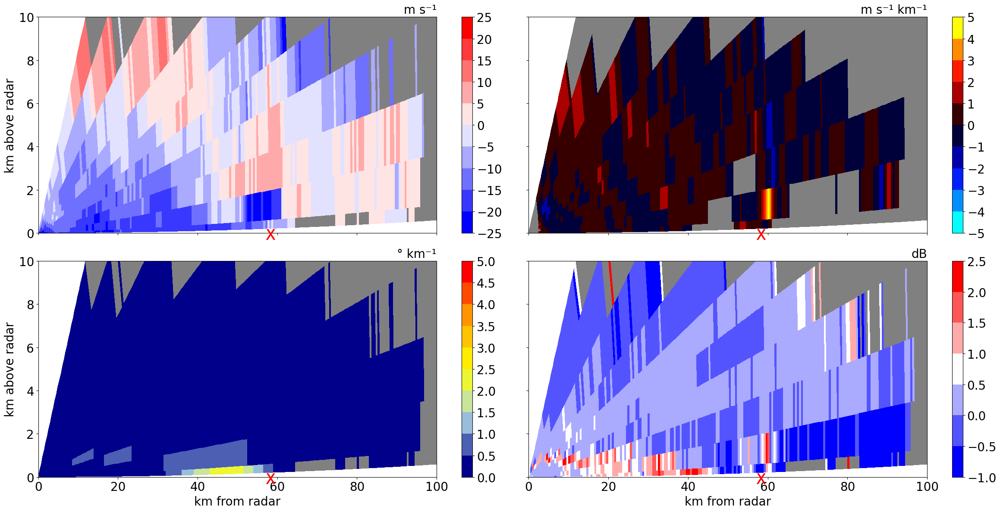

In [ ]:
# Set up the figure with 4 rows and 4 columns
fig, axes = plt.subplots(2, 2, sharex=True, sharey=True, figsize=(24, 12))

div_shear_norm = BoundaryNorm(boundaries=div_shear_levels, ncolors=256, clip=True)
# Define tick levels and normalization
div_shear_levels = np.arange(-5, 5.5, 1)  # Original tick locations

# Zugriff auf die Achsen aus dem erzeugten Gitter
ax_vel_first_scan = axes[0, 0]
ax_div_shear_first_scan = axes[0, 1]
ax_kdp_first_scan = axes[1, 0]
ax_zdr_first_scan = axes[1, 1]
        
# Plot 'corrected_velocity' with specified color limits
cmap_velocity.set_bad(color='grey')
display_first_scan.plot_rhi('corrected_velocity', ax=ax_vel_first_scan, #vmin=-30, vmax=30, 
                            ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity, colorbar_label='')
#ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")

cmap_div_shear.set_bad(color='grey')
display_first_scan.plot_rhi('div_shear', ax=ax_div_shear_first_scan, ticks=div_shear_levels, norm=div_shear_norm, 
#vmin=-20, vmax=70,
    cmap=cmap_div_shear, colorbar_label='')
#ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

# Plot KDP
cmap_Kdp.set_bad(color='grey')
display_first_scan.plot_rhi('kdp', ax=ax_kdp_first_scan, ticks=Kdp_levels, norm=Kdp_norm, 
            #vmin=-20, vmax=70,
                cmap=cmap_Kdp, colorbar_label='')

# Plot Zdr
cmap_diff_reflectivity.set_bad(color='grey')
display_first_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_first_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                #vmin=-20, vmax=70,
                cmap=cmap_diff_reflectivity, colorbar_label='')
   
    
# Loop over rows
for row in range(2):  # Adjust depending on the number of rows in your layout
    for col in range(2):  # Adjust depending on the number of columns
        ax_vel = axes[0, 0]  # Velocity plot
        #ax_ref = axes[row, 2]  # Reflectivity plot
        ax_div_shear = axes[0, 1]  # Divergence/Shear plot
        ax_kdp = axes[1, 0]
        ax_zdr = axes[1, 1]

        # Annotate 'X' on the axes where needed
        for axis in [ax_vel, ax_div_shear, ax_kdp, ax_zdr]:
            axis.annotate('X', xy=(downburst_distance, 0), xytext=(downburst_distance, -0.3),
                          textcoords='data', ha='center', color='red', fontsize=24,
                          arrowprops=dict(arrowstyle='-', color='red'))

        # Set axis limits for each axis
        ax_vel.set_ylim([0, 10])   # Adjust height range as needed
        ax_vel.set_xlim([rhi_close, rhi_distance])  # Adjust distance range as needed

        # Set labels for all axes
        ax_vel.set_xlabel('')
        ax_vel.set_ylabel('km above radar', fontsize =20)
        
        ax_div_shear.set_xlabel('')
        ax_div_shear.set_ylabel('')

        ax_kdp.set_xlabel('km from radar', fontsize =20)
        ax_kdp.set_ylabel('km above radar', fontsize =20)

        ax_zdr.set_xlabel('km from radar', fontsize =20)
        ax_zdr.set_ylabel('')

# Set global font size for tick labels
plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)

# Loop over axes to ensure consistent label sizes
for ax in [ax_vel_first_scan, ax_div_shear_first_scan, ax_kdp_first_scan, ax_zdr_first_scan]:
    ax.tick_params(axis='both', which='major', labelsize=20)  # Major ticks
    ax.tick_params(axis='both', which='minor', labelsize=20)  # Minor ticks (if needed)
    ax.set_title('')

#ax_vel.set_title('A', fontsize=40, loc='left')
ax_vel.set_title('m s⁻¹', fontsize=20, loc='right')

#ax_div_shear.set_title('B', fontsize=40, loc='left')
ax_div_shear.set_title('m s⁻¹ km⁻¹', fontsize=20, loc='right')

#ax_kdp.set_title('C', fontsize=40, loc='left')
ax_kdp.set_title('° km⁻¹', fontsize=20, loc='right')

#ax_zdr.set_title('D', fontsize=40, loc='left')
ax_zdr.set_title('dB', fontsize=20, loc='right')

plt.tight_layout()  # Adjust layout for the title

#plt.savefig("/users/fackerma/newproject1/figures/first_case/RHI_1531UTC_Bouveret_3.png", dpi=300)


In [16]:
# Prepare the Half scnas of the Moléson RHI 1610
downburst_location = 'Moléson'
downburst_x = 567719
downburst_y = 155077
downburst_z = 1974

if radar_station == 'D':
    rhi_close = 0
    rhi_distance = 100
else:
    rhi_distance = 150
    rhi_close = 0

# Define time intervals: x minutes before, and the exact time
time_deltas = [0]  # minutes
first_scan = ['001', '003', '005', '007', '009', '011', '013', '015', '017', '019']
second_scan = ['002', '004', '006', '008', '010', '012', '014', '016', '018', '020']

wgs84 = converter.LV03toWGS84(downburst_x, downburst_y, downburst_z)
print(wgs84)
downburst_lat = wgs84[0]
downburst_lon = wgs84[1]

radar_coords = (radar_lat, radar_lon)
downburst_coords = (downburst_lat, downburst_lon)
downburst_distance = geopy.distance.geodesic(radar_coords, downburst_coords).km

# Calculate azimuth
azimuth_to_downburst = calculate_azimuth(radar_lat, radar_lon, downburst_lat, downburst_lon)
print(f"Azimuth angle to downburst occurrence: {azimuth_to_downburst:.2f} degrees")

# Convert valid_time3 to a datetime object
base_time = datetime.strptime(valid_time3, "%H%M")

div_shear_levels = np.arange(-5,5.5,0.5)
div_shear_norm = BoundaryNorm(boundaries=div_shear_levels, ncolors=256, clip=True)


for index, delta in enumerate(time_deltas):
    # Calculate the time for this row
    current_time = (base_time + timedelta(minutes=delta)).strftime("%H%M")
    print(f"Looking for files with time: {current_time}")
    
    # Check what files are available in the directory
    files_rhi = sorted(glob.glob(f"{path}/MLD/ML{radar_station}19166{current_time}*"))
    print(f"Files found for time {current_time}: {files_rhi}")

    # Separate the files into two lists
    file_rhi_first_scan = []
    file_rhi_second_scan = []

    for file in files_rhi:
        # Extract the elevation scan number (last two digits before the file extension)
        elevation_scan = file.split('.')[-1]

        if elevation_scan in first_scan:
            file_rhi_first_scan.append(file)
        elif elevation_scan in second_scan:
            file_rhi_second_scan.append(file)


    # Merge radar data for first scan
    radar_merged_first_scan = None
    for i, f in enumerate(file_rhi_first_scan):
        radar = pyart.aux_io.read_metranet(f)
        if i == 0:
            radar_merged_first_scan = radar
        else:
            radar_merged_first_scan = pyart.util.join_radar(radar_merged_first_scan, radar)

    # Merge radar data for second scan  
    radar_merged_second_scan = None
    for i, f in enumerate(file_rhi_second_scan):
        radar = pyart.aux_io.read_metranet(f)
        if i == 0:
            radar_merged_second_scan = radar
        else:
            radar_merged_second_scan = pyart.util.join_radar(radar_merged_second_scan, radar)

    # Perform dealiasing
    #corr_vel = pyart.correct.dealias_region_based(radar_merged)
    corr_vel_first_scan = pyart.correct.dealias_region_based(radar_merged_first_scan)
    corr_vel_second_scan = pyart.correct.dealias_region_based(radar_merged_second_scan)

    # Add 'corrected_velocity' field if it doesn't already exist
    if 'corrected_velocity' not in radar_merged_first_scan.fields:
        radar_merged_first_scan.add_field('corrected_velocity', corr_vel_first_scan)
    else:
        print(f"Field 'corrected_velocity_first_scan' already exists for time {current_time}. Skipping addition.")

    # Add 'corrected_velocity' field if it doesn't already exist
    if 'corrected_velocity' not in radar_merged_second_scan.fields:
        radar_merged_second_scan.add_field('corrected_velocity', corr_vel_second_scan)
    else:
        print(f"Field 'corrected_velocity_second_scan' already exists for time {current_time}. Skipping addition.")

    #div_shear = llsd(vel=radar_merged.fields['corrected_velocity']['data'], az_min=3, az_max=90, w_k=1.5, r_k=2, resolution=0.5)
    div_shear_first_scan = llsd(vel=radar_merged_first_scan.fields['corrected_velocity']['data'], az_min=3, az_max=10, w_k=5, r_k=5, resolution=0.5)
    div_shear_second_scan = llsd(vel=radar_merged_second_scan.fields['corrected_velocity']['data'], az_min=3, az_max=10, w_k=5, r_k=5, resolution=0.5)

    # Assuming div_shear is a NumPy array or similar
    div_shear_dict_first_scan = {
        'data': div_shear_first_scan[1],  # This should be the numerical array
        'units': 'm/s/km',  # You can adjust the units based on the actual meaning of div_shear
        'long_name': 'Divergence Shear',  # Add a descriptive name for the field
        'standard_name': 'div_shear',  # You can add any standard name
    }
    radar_merged_first_scan.add_field('div_shear', div_shear_dict_first_scan)
    # Assuming div_shear is a NumPy array or similar
    div_shear_dict_second_scan = {
        'data': div_shear_second_scan[1],  # This should be the numerical array
        'units': 'm/s/km',  # You can adjust the units based on the actual meaning of div_shear
        'long_name': 'Divergence Shear',  # Add a descriptive name for the field
        'standard_name': 'div_shear',  # You can add any standard name
    }
    radar_merged_second_scan.add_field('div_shear', div_shear_dict_second_scan)
    # Now, add the field to the radar object

    kdp = pyart.retrieve.kdp_vulpiani(radar_merged_first_scan, psidp_field='uncorrected_differential_phase', band='C', parallel=True)
    radar_merged_first_scan.add_field('kdp', kdp[0])

    kdp = pyart.retrieve.kdp_vulpiani(radar_merged_second_scan, psidp_field='uncorrected_differential_phase', band='C', parallel=True)
    radar_merged_second_scan.add_field('kdp', kdp[0])
 
    
    # Create a pseudo RHI cross-section at azimuth 270 degrees
    pseudorhi = pyart.util.cross_section_ppi(radar_merged, [azimuth_to_downburst])
    display = pyart.graph.RadarDisplay(pseudorhi)
    # Create a pseudo RHI cross-section at azimuth 270 degrees
    pseudorhi_first_scan = pyart.util.cross_section_ppi(radar_merged_first_scan, [azimuth_to_downburst])
    display_first_scan = pyart.graph.RadarDisplay(pseudorhi_first_scan)
    # Create a pseudo RHI cross-section at azimuth 270 degrees
    pseudorhi_second_scan = pyart.util.cross_section_ppi(radar_merged_second_scan, [azimuth_to_downburst])
    display_second_scan = pyart.graph.RadarDisplay(pseudorhi_second_scan)

[46.54620053012867, 7.017760746224894, 2024.97379732]
Azimuth angle to downburst occurrence: 78.87 degrees
Looking for files with time: 1610
Files found for time 1610: ['/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616100U.001', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616100U.002', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616100U.003', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616100U.004', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616100U.005', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616100U.006', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616100U.007', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616100U.008', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616100U.009', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616100U.010', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616100U.011', '/scratch/mch/fackerma/orders/case_150619/MLD/MLD1916616100U.012', '/scratch/mch/fackerma/orde

/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pyart/aux_io/metranet_reader.py:142: UserWarning: Invalid reader name or C library not available, using python (default) instead
  warn('Invalid reader name or C library not available,' +
/scratch/mch/fackerma/miniforge3/envs/testenv/lib/python3.12/site-packages/pyart/aux_io/metranet_reader.py:925: UserWarning: Moment SNR not in file
  warn('Moment ' + momnames[i] + ' not in file')


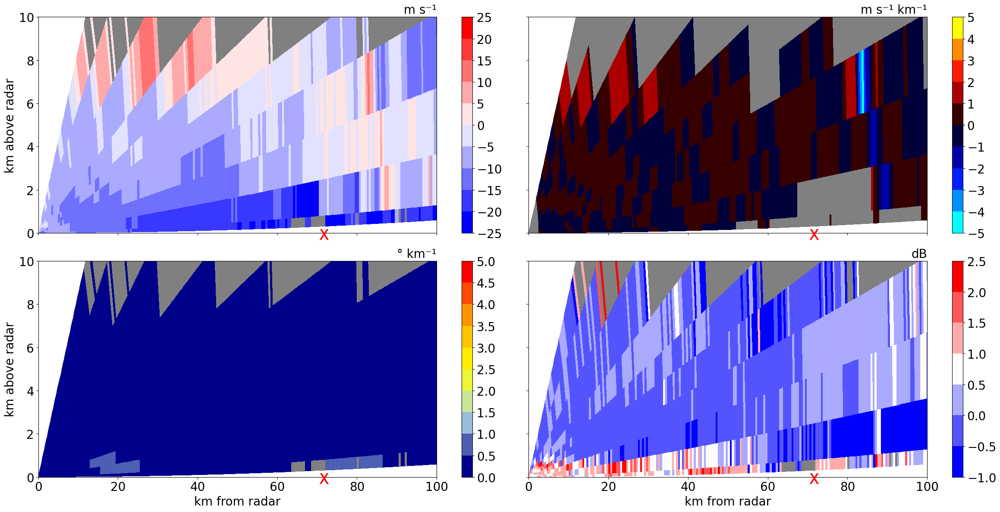

In [19]:
# Set up the figure with 4 rows and 4 columns
fig, axes = plt.subplots(2, 2, sharex=True, sharey=True, figsize=(24, 12))

div_shear_norm = BoundaryNorm(boundaries=div_shear_levels, ncolors=256, clip=True)
# Define tick levels and normalization
div_shear_levels = np.arange(-5, 5.5, 1)  # Original tick locations

# Zugriff auf die Achsen aus dem erzeugten Gitter
ax_vel_first_scan = axes[0, 0]
ax_div_shear_first_scan = axes[0, 1]
ax_kdp_first_scan = axes[1, 0]
ax_zdr_first_scan = axes[1, 1]
        
# Plot 'corrected_velocity' with specified color limits
cmap_velocity.set_bad(color='grey')
display_first_scan.plot_rhi('corrected_velocity', ax=ax_vel_first_scan, #vmin=-30, vmax=30, 
                            ticks=velocity_levels, norm=velocity_norm, cmap=cmap_velocity, colorbar_label='')
#ax_vel.set_title(f"Corrected Velocity at {current_time[:2]}:{current_time[2:]} UTC")

cmap_div_shear.set_bad(color='grey')
display_first_scan.plot_rhi('div_shear', ax=ax_div_shear_first_scan, ticks=div_shear_levels, norm=div_shear_norm, 
#vmin=-20, vmax=70,
    cmap=cmap_div_shear, colorbar_label='')
#ax_div_shear.set_title(f"Radial Shear at {current_time[:2]}:{current_time[2:]} UTC")

# Plot KDP
cmap_Kdp.set_bad(color='grey')
display_first_scan.plot_rhi('kdp', ax=ax_kdp_first_scan, ticks=Kdp_levels, norm=Kdp_norm, 
            #vmin=-20, vmax=70,
                cmap=cmap_Kdp, colorbar_label='')

# Plot Zdr
cmap_diff_reflectivity.set_bad(color='grey')
display_first_scan.plot_rhi('differential_reflectivity', ax=ax_zdr_first_scan, ticks=diff_reflectivity_levels, norm=diff_reflectivity_norm, 
                #vmin=-20, vmax=70,
                cmap=cmap_diff_reflectivity, colorbar_label='')
   
    
# Loop over rows
for row in range(2):  # Adjust depending on the number of rows in your layout
    for col in range(2):  # Adjust depending on the number of columns
        ax_vel = axes[0, 0]  # Velocity plot
        #ax_ref = axes[row, 2]  # Reflectivity plot
        ax_div_shear = axes[0, 1]  # Divergence/Shear plot
        ax_kdp = axes[1, 0]
        ax_zdr = axes[1, 1]

        # Annotate 'X' on the axes where needed
        for axis in [ax_vel, ax_div_shear, ax_kdp, ax_zdr]:
            axis.annotate('X', xy=(downburst_distance, 0), xytext=(downburst_distance, -0.3),
                          textcoords='data', ha='center', color='red', fontsize=24,
                          arrowprops=dict(arrowstyle='-', color='red'))

        # Set axis limits for each axis
        ax_vel.set_ylim([0, 10])   # Adjust height range as needed
        ax_vel.set_xlim([rhi_close, rhi_distance])  # Adjust distance range as needed

        # Set labels for all axes
        ax_vel.set_xlabel('')
        ax_vel.set_ylabel('km above radar', fontsize =20)
        
        ax_div_shear.set_xlabel('')
        ax_div_shear.set_ylabel('')

        ax_kdp.set_xlabel('km from radar', fontsize =20)
        ax_kdp.set_ylabel('km above radar', fontsize =20)

        ax_zdr.set_xlabel('km from radar', fontsize =20)
        ax_zdr.set_ylabel('')

# Set global font size for tick labels
plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)

# Loop over axes to ensure consistent label sizes
for ax in [ax_vel_first_scan, ax_div_shear_first_scan, ax_kdp_first_scan, ax_zdr_first_scan]:
    ax.tick_params(axis='both', which='major', labelsize=20)  # Major ticks
    ax.tick_params(axis='both', which='minor', labelsize=20)  # Minor ticks (if needed)
    ax.set_title('')

#ax_vel.set_title('A', fontsize=40, loc='left')
ax_vel.set_title('m s⁻¹', fontsize=20, loc='right')

#ax_div_shear.set_title('B', fontsize=40, loc='left')
ax_div_shear.set_title('m s⁻¹ km⁻¹', fontsize=20, loc='right')

#ax_kdp.set_title('C', fontsize=40, loc='left')
ax_kdp.set_title('° km⁻¹', fontsize=20, loc='right')

#ax_zdr.set_title('D', fontsize=40, loc='left')
ax_zdr.set_title('dB', fontsize=20, loc='right')

plt.tight_layout()  # Adjust layout for the title

#plt.savefig("/users/fackerma/newproject1/figures/first_case/RHI_1606UTC_Moléson.png", dpi=300)
